<a href="https://colab.research.google.com/github/lvb86/alura-bootcamp-dsa/blob/main/Alura_BC_DSA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Geral

##About 
>Curso: Alura\ Bootcamp: **Data Science Aplicada**

>> **Módulo 1**: Analisando dados da saúde com Python e Pandas

>> **Módulo 2**: Visualização de dados com Seaborn e Matplotlib

>> **Módulo 3**: Análise descritiva e testes estatísticos

Caderno de estudos de Leandro Barbosa

>Realização: de 2020.11.04 a 2021


## Declarações

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.style as style
import seaborn as sns
import numpy as np
from io import StringIO
from datetime import date
from zipfile import ZipFile
from statsmodels.stats.weightstats import zconfint
from statsmodels.stats.weightstats import DescrStatsW
from statsmodels.stats.weightstats import ztest
from scipy.stats import normaltest
from scipy.stats import ranksums

##Funções 

In [ ]:

# Para traduzir ticker para PT-BR
def formatador_de_dinheiro(valor, p):
    valor = f"{valor:,.2f}"
    mapa_de_traducao = str.maketrans(',.', '.,')
    return valor.translate(mapa_de_traducao)
#exemplo de uso 
#ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_dinheiro))
#Powered by @lpeixoto2000


## Dados

### D1. Dados do Módulo 1

In [ ]:
#Fonte um usada nas aulas[1a3] mas esta diferentre dos videos 
fonte = "https://raw.githubusercontent.com/alura-cursos/agendamento-hospitalar/main/dados/A160324189_28_143_208.csv"
dados = pd.read_csv(fonte,encoding="ISO-8859-1",skiprows=3,skipfooter=12,sep=";",thousands=".", decimal=",", na_values = '-' )
dados.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  This is separate from the ipykernel package so we can avoid doing imports until


,Unidade da Federação,1992/Mar,1992/Abr,1993/Mai,1993/Dez,1994/Jan,1994/Fev,1994/Mai,1994/Ago,1994/Nov,1995/Jan,1995/Mar,1995/Jun,1995/Ago,1995/Dez,1996/Fev,1996/Mar,1996/Ago,1996/Dez,1997/Fev,1997/Nov,1998/Fev,1998/Mar,1998/Jul,1998/Ago,1998/Set,1998/Out,1998/Dez,1999/Fev,1999/Mar,1999/Mai,1999/Jul,1999/Ago,1999/Set,1999/Out,1999/Nov,1999/Dez,2000/Jan,2000/Fev,2000/Mar,...,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago,Total
0,11 Rondônia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8041248.80,8199032.67,8363386.07,7889819.50,8603943.85,8048398.25,8159737.49,8457455.71,7766983.20,8858845.57,8407076.44,9492938.92,8206195.92,9011612.58,9124967.84,8406732.72,8411360.02,8651081.66,8193425.99,8388269.45,8645315.78,9050329.13,9211262.51,9490545.02,8600886.20,8919190.86,8909111.89,8409386.09,8924348.41,8948605.66,8660753.05,8326416.32,8413784.42,7174312.31,7423678.64,8581195.13,9193593.76,7407388.24,3556381.57,9.291297e+08
1,12 Acre,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3355223.35,3562691.54,3375296.64,3341497.58,3358378.05,3145385.44,2638773.92,2968168.75,2769797.39,3057631.96,2874965.31,3175575.17,3060903.21,3253011.61,3040645.05,2926179.27,3126120.64,2473454.85,2277493.49,2594347.32,2234388.36,2473008.49,2979764.77,3070533.95,3249052.69,3567538.64,2981072.98,2998860.31,3293378.97,3174249.43,2959569.09,3261123.88,2981264.22,2859102.06,2472063.08,2383895.48,2199920.70,1163813.08,NaN,4.206680e+08
2,13 Amazonas,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13718828.46,14396210.86,13745304.22,13979792.94,13895515.90,13518116.80,13635186.02,14549450.86,12753555.36,14749409.47,14577930.81,15381061.96,14653650.77,15544595.79,16374961.41,15343340.93,16249963.61,14255408.82,14274053.94,15358914.00,14100074.56,16103971.89,16154491.82,16529976.06,15509984.83,16642220.71,16493719.52,15346323.27,16282436.68,14781332.42,14923380.22,15939561.23,15138110.70,14773739.41,16330913.81,19441150.53,17509334.66,13358514.02,4726485.73,1.771655e+09
3,14 Roraima,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2699213.85,2682746.28,2891100.20,2737677.78,2693726.29,2671451.53,2688315.70,2740952.07,2478349.44,2674958.94,2721261.19,2844811.66,2967161.35,2841587.97,3328230.63,2878691.04,2964324.32,2524712.40,2462451.64,2662240.18,2499996.16,2846135.56,2789823.29,2839389.53,2647540.20,2865777.71,3181321.82,3070436.96,3162342.44,3121104.71,2889969.87,3084561.08,2967159.04,2813954.05,2304961.42,2910776.44,3216466.51,2739498.41,1524478.04,3.050109e+08
4,15 Pará,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,31808597.47,32133134.42,33770556.65,32979925.38,33665042.35,33475545.29,32067934.67,33615836.09,30623491.62,34121931.00,35039954.20,35424611.06,34160283.18,34484949.49,35618364.04,34380916.90,38441090.50,33583538.08,32789354.87,34513534.80,31885919.67,33236155.79,31008924.95,31064106.50,28543179.30,36713929.36,36462011.47,36790758.67,36974859.69,35555518.00,35222625.80,37009819.17,34635702.52,34749098.46,28714969.96,41248502.78,35396030.78,27618727.51,11559714.54,4.437116e+09


In [ ]:
#Fonte2 um usada nas aulas[3a...] para tentar adequar aos videos 
fonte2 = "https://raw.githubusercontent.com/alura-cursos/agendamento-hospitalar/main/dados/A160324189_28_143_208.csv?raw=true"
df = pd.read_csv(fonte2,encoding="ISO-8859-1",skiprows=3,skipfooter=12,sep=";",thousands=".", decimal=",", na_values = '-' )

df.head()


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  This is separate from the ipykernel package so we can avoid doing imports until


,Unidade da Federação,1992/Mar,1992/Abr,1993/Mai,1993/Dez,1994/Jan,1994/Fev,1994/Mai,1994/Ago,1994/Nov,1995/Jan,1995/Mar,1995/Jun,1995/Ago,1995/Dez,1996/Fev,1996/Mar,1996/Ago,1996/Dez,1997/Fev,1997/Nov,1998/Fev,1998/Mar,1998/Jul,1998/Ago,1998/Set,1998/Out,1998/Dez,1999/Fev,1999/Mar,1999/Mai,1999/Jul,1999/Ago,1999/Set,1999/Out,1999/Nov,1999/Dez,2000/Jan,2000/Fev,2000/Mar,...,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago,Total
0,11 Rondônia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8041248.80,8199032.67,8363386.07,7889819.50,8603943.85,8048398.25,8159737.49,8457455.71,7766983.20,8858845.57,8407076.44,9492938.92,8206195.92,9011612.58,9124967.84,8406732.72,8411360.02,8651081.66,8193425.99,8388269.45,8645315.78,9050329.13,9211262.51,9490545.02,8600886.20,8919190.86,8909111.89,8409386.09,8924348.41,8948605.66,8660753.05,8326416.32,8413784.42,7174312.31,7423678.64,8581195.13,9193593.76,7407388.24,3556381.57,9.291297e+08
1,12 Acre,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3355223.35,3562691.54,3375296.64,3341497.58,3358378.05,3145385.44,2638773.92,2968168.75,2769797.39,3057631.96,2874965.31,3175575.17,3060903.21,3253011.61,3040645.05,2926179.27,3126120.64,2473454.85,2277493.49,2594347.32,2234388.36,2473008.49,2979764.77,3070533.95,3249052.69,3567538.64,2981072.98,2998860.31,3293378.97,3174249.43,2959569.09,3261123.88,2981264.22,2859102.06,2472063.08,2383895.48,2199920.70,1163813.08,NaN,4.206680e+08
2,13 Amazonas,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13718828.46,14396210.86,13745304.22,13979792.94,13895515.90,13518116.80,13635186.02,14549450.86,12753555.36,14749409.47,14577930.81,15381061.96,14653650.77,15544595.79,16374961.41,15343340.93,16249963.61,14255408.82,14274053.94,15358914.00,14100074.56,16103971.89,16154491.82,16529976.06,15509984.83,16642220.71,16493719.52,15346323.27,16282436.68,14781332.42,14923380.22,15939561.23,15138110.70,14773739.41,16330913.81,19441150.53,17509334.66,13358514.02,4726485.73,1.771655e+09
3,14 Roraima,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2699213.85,2682746.28,2891100.20,2737677.78,2693726.29,2671451.53,2688315.70,2740952.07,2478349.44,2674958.94,2721261.19,2844811.66,2967161.35,2841587.97,3328230.63,2878691.04,2964324.32,2524712.40,2462451.64,2662240.18,2499996.16,2846135.56,2789823.29,2839389.53,2647540.20,2865777.71,3181321.82,3070436.96,3162342.44,3121104.71,2889969.87,3084561.08,2967159.04,2813954.05,2304961.42,2910776.44,3216466.51,2739498.41,1524478.04,3.050109e+08
4,15 Pará,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,31808597.47,32133134.42,33770556.65,32979925.38,33665042.35,33475545.29,32067934.67,33615836.09,30623491.62,34121931.00,35039954.20,35424611.06,34160283.18,34484949.49,35618364.04,34380916.90,38441090.50,33583538.08,32789354.87,34513534.80,31885919.67,33236155.79,31008924.95,31064106.50,28543179.30,36713929.36,36462011.47,36790758.67,36974859.69,35555518.00,35222625.80,37009819.17,34635702.52,34749098.46,28714969.96,41248502.78,35396030.78,27618727.51,11559714.54,4.437116e+09


In [ ]:
#dengue = "https://info.dengue.mat.br/api/alertcity/?geocode=3304557&disease=dengue&format=csv&ew_start=01&ey_start=2012&ew_end=50&ey_end=2013"
#dengue = "https://info.dengue.mat.br/api/alertcity/?geocode=3304557&disease=dengue&format=csv&ew_start=01&ey_start=2008&ew_end=50&ey_end=2020"
#dfdengue = pd.read_csv(dengue,sep=",",thousands=".", decimal=",", na_values = '-' )
#dfdengue.head()



In [ ]:
populacao = "http://api.sidra.ibge.gov.br/values/t/793/g/2/v/all/p/all?formato=json"
dfpop = pd.read_json(populacao)
dfpop.head()

,NC,NN,D1C,D1N,D2C,D2N,D3C,D3N,MC,MN,V
0,Nível Territorial (Código),Nível Territorial,"Brasil, Grande Região e UF (Código)","Brasil, Grande Região e UF",Variável (Código),Variável,Ano (Código),Ano,Unidade de Medida (Código),Unidade de Medida,Valor
1,1,Brasil,1,Brasil,93,População residente,2007,2007,45,Pessoas,183987291
2,2,Grande Região,1,Norte,93,População residente,2007,2007,45,Pessoas,14623316
3,3,Unidade da Federação,11,Rondônia,93,População residente,2007,2007,45,Pessoas,1453756
4,3,Unidade da Federação,12,Acre,93,População residente,2007,2007,45,Pessoas,655385


###D2. Dados do Módulo 2

In [ ]:
urlex = "https://github.com/alura-cursos/agendamento-hospitalar/raw/main/dados/estimativa_dou_2020.xls"
ibge_estimativa = pd.read_excel(urlex, skiprows=1)
ibge_estimativa.head()



,BRASIL E UNIDADES DA FEDERAÇÃO,Unnamed: 1,POPULAÇÃO ESTIMADA
0,Brasil,NaN,211755692
1,Região Norte,NaN,18672591
2,Rondônia,NaN,1796460
3,Acre,NaN,894470
4,Amazonas,NaN,4207714


In [ ]:
dados_da_populacao = """Posição	Unidade federativa	População	% da pop. total	País comparável
(habitantes)

1	 São Paulo	46 289 333	21,9%	Flag of Spain.svg Espanha (46 439 864)
2	 Minas Gerais	21 292 666	10,1%	 Sri Lanka (20 675 000)
3	 Rio de Janeiro	17 366 189	8,2%	 Países Baixos (16 922 900)
4	Bahia Bahia	14 930 634	7,1%	 Chade (14 037 000)
5	 Paraná	11 516 840	5,4%	 Bolívia (11 410 651)
6	 Rio Grande do Sul	11 422 973	5,4%	 Bélgica (11 250 659)
7	 Pernambuco	9 616 621	4,5%	 Bielorrússia (9 485 300)
8	 Ceará	9 187 103	4,3%	 Emirados Árabes Unidos (9 157 000)
9	Pará Pará	8 690 745	4,1%	 Áustria (8 602 112)
10	 Santa Catarina	7 252 502	3,4%	 Sérvia (7 114 393)
11	 Maranhão	7 114 598	3,4%	 Paraguai (7 003 406)
12	 Goiás	7 113 540	3,4%	 Paraguai (7 003 406)
13	 Amazonas	4 207 714	2,0%	 Líbano (4 168 000)
14	 Espírito Santo	4 064 052	1,9%	 Líbano (4 168 000)
15	 Paraíba	4 039 277	1,9%	 Líbano (4 168 000)
16	 Rio Grande do Norte	3 534 165	1,7%	 Uruguai (3 415 866)
17	 Mato Grosso	3 526 220	1,7%	 Uruguai (3 415 866)
18	 Alagoas	3 351 543	1,6%	 Uruguai (3 415 866)
19	 Piauí	3 281 480	1,6%	 Kuwait (3 268 431)
20	 Distrito Federal	3 055 149	1,4%	 Lituânia (2 900 787)
21	 Mato Grosso do Sul	2 809 394	1,3%	 Jamaica (2 717 991)
22	 Sergipe	2 318 822	1,1%	 Namíbia (2 280 700)
23	 Rondônia	1 796 460	0,8%	 Gabão (1 725 000)
24	 Tocantins	1 590 248	0,7%	 Bahrein (1 359 800)
25	 Acre	894 470	0,4%	 Fiji (859 178)
26	 Amapá	861 773	0,4%	 Fiji (859 178)
27	 Roraima	631 181	0,3%	 Luxemburgo (562 958)"""

# Fonte: https://pt.wikipedia.org/wiki/Lista_de_unidades_federativas_do_Brasil_por_popula%C3%A7%C3%A3o

In [ ]:
dados_da_populacao_io = StringIO(dados_da_populacao)
df_dados_pop = pd.read_csv(dados_da_populacao_io, sep="\t")
df_dados_popD = df_dados_pop.copy

In [ ]:
populacao = df_dados_pop

In [ ]:
##dados_da_populacao_io = StringIO(dados_da_populacao)
urlpop = "https://pt.wikipedia.org/wiki/Lista_de_unidades_federativas_do_Brasil_por_popula%C3%A7%C3%A3o"
pd.read_html(urlpop)[0]

,Posição,Unidade federativa,População,% da pop. total,País comparável (habitantes)
0,1,São Paulo,46 289 333,"21,9%",Espanha (46 439 864)
1,2,Minas Gerais,21 292 666,"10,1%",Sri Lanka (20 675 000)
2,3,Rio de Janeiro,17 366 189,"8,2%",Países Baixos (16 922 900)
3,4,Bahia,14 930 634,"7,1%",Chade (14 037 000)
4,5,Paraná,11 516 840,"5,4%",Bolívia (11 410 651)
5,6,Rio Grande do Sul,11 422 973,"5,4%",Bélgica (11 250 659)
6,7,Pernambuco,9 616 621,"4,5%",Bielorrússia (9 485 300)
7,8,Ceará,9 187 103,"4,3%",Emirados Árabes Unidos (9 157 000)
8,9,Pará,8 690 745,"4,1%",Áustria (8 602 112)
9,10,Santa Catarina,7 252 502,"3,4%",Sérvia (7 114 393)


### D3. Dados do Módulo 3


In [ ]:
caminho = "/content/drive/MyDrive/Ensino/Cursos/2020.11 - Alura DSA/Dados/PeNSE_2015_AMOSTRA2.zip"
zip = ZipFile(caminho)
caminho_pasta_zipada = zip.namelist()[1]
#zip.infolist()
#dadosM3 = pd.read_csv(caminho)
dadosM3 = pd.read_csv(zip.open(caminho_pasta_zipada),sep = ";",thousands = ".", decimal=",")
dadosM3.head()

,ANOPESQ,PAIS,REGEOGR,VB00004,VB01001,VB01002,VB01003,VB01004,VB01005,VB01006,VB01007,VB01008A,VB01010A,VB01011,VB01012,VB01013,VB01014,VB01015A,VB01016,VB01017,VB01018,VB01019,VB01020A,VB01021,VB01022,VB01023,VB01024,VB01025,VB01026,VB02001,VB02002,VB02004A,VB02010,VB02011,VB02013,VB02017A,VB02018A,VB02019A,VB02020A,VB02021,...,VB11005,VB11006,VB11007,VB12001,VB12002,VB12003,VB13001,VB13002A,VB13004A,VB13005,VB13006,VB13007,VB13008,VB13009,VB14001,VB14002,VB16001A01,VB16001A02,VB16001A03,VB16001A04,VB16001A05,VB16001A06,VB16001A07,VB16001A08,VB17001,VB17002,VB17003,VB17004,VB17005,VB17006,ESTRATO_EXP,ESTRATOGEOREG,PESO,V0006,V0007,V0008,V0041,aluno,escola,turma
0,2015,76,1,1,2,1,13,7,7,1,2,7,3,2,-1,1,1,1,1,1,2,4,2,4,1,2,2,5,1,8,3,4,3,6,6,1,6,1,-1,2,...,2,1,2,1,1,4,2,-1,3,1,1,-1,1,1,2,2,1,2,2,2,2,2,2,2,371.0,1570.0,37.1,157.0,2,1,1223,1,299.735235,1,2,4,1,1,1,296
1,2015,76,1,1,2,1,14,4,7,1,1,7,3,2,-1,1,1,1,1,1,2,2,2,4,1,2,2,5,3,8,2,1,8,8,6,1,1,5,-1,2,...,2,3,2,4,4,4,1,2,3,3,1,-1,1,1,2,2,2,2,2,1,2,2,2,2,502.0,1520.0,50.2,152.0,2,2,1223,1,355.170081,1,2,4,1,2,1,296
2,2015,76,1,1,1,4,13,6,7,1,1,5,5,2,-1,2,1,1,1,1,2,3,1,4,1,2,2,5,3,2,3,1,8,2,8,1,1,5,5,1,...,2,1,2,1,2,3,1,2,1,2,5,99,1,-1,2,2,1,1,1,1,1,1,1,1,482.0,1614.0,48.2,161.4,2,2,1223,1,299.735235,1,2,4,1,3,1,296
3,2015,76,1,1,1,1,14,6,7,1,1,7,4,2,-1,1,1,1,1,1,2,4,2,4,1,2,2,6,3,2,4,1,3,2,7,1,5,1,-1,2,...,2,1,2,2,2,4,1,10,3,1,2,-1,1,-1,2,2,1,2,2,2,1,2,2,2,694.0,1725.0,69.4,172.5,2,3,1223,1,355.170081,1,2,4,1,4,1,296
4,2015,76,1,1,1,1,13,9,7,1,2,5,4,2,-1,2,1,1,1,1,2,5,1,4,1,2,2,6,5,6,3,5,2,6,2,1,5,1,5,1,...,2,1,4,2,2,4,1,3,2,2,2,13,1,-1,1,2,1,1,1,1,1,1,1,1,789.0,1675.0,78.9,167.5,2,4,1223,1,299.735235,1,2,4,1,5,1,296


#Aulas

##M1: Analisando dados da saúde com Python e Pandas


###**M1A1.** Aquisilção e leitura de dados Reais

In [ ]:
fonte = "https://raw.githubusercontent.com/alura-cursos/agendamento-hospitalar/main/dados/A151346189_28_143_208.csv?raw=true"
dados = pd.read_csv(fonte,encoding="ISO-8859-1",skiprows=3,skipfooter=12,sep=";",thousands=".", decimal=",", na_values = '-' )

dados.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  


,Unidade da Federação,2008/Jan,2008/Fev,2008/Mar,2008/Abr,2008/Mai,2008/Jun,2008/Jul,2008/Ago,2008/Set,2008/Out,2008/Nov,2008/Dez,2009/Jan,2009/Fev,2009/Mar,2009/Abr,2009/Mai,2009/Jun,2009/Jul,2009/Ago,2009/Set,2009/Out,2009/Nov,2009/Dez,2010/Jan,2010/Fev,2010/Mar,2010/Abr,2010/Mai,2010/Jun,2010/Jul,2010/Ago,2010/Set,2010/Out,2010/Nov,2010/Dez,2011/Jan,2011/Fev,2011/Mar,...,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago,Total
0,11 Rondônia,1388528.39,2931283.42,1541682.52,1525314.96,1645953.84,1406150.68,3065279.01,3231494.61,3117178.63,3068430.44,2825838.52,2931173.58,2885269.07,2860103.74,3684944.68,3607289.68,3774356.60,3706711.84,3763187.55,3533625.83,3605007.43,3907032.72,3939820.71,3901084.11,3684407.02,3623015.58,3890461.90,4193533.87,4534400.67,4451208.03,4874592.78,4460802.38,5067886.24,4511092.85,4394680.50,4098741.80,4411499.48,3868617.95,4298702.78,...,7948291.63,8438077.45,7656644.83,8047742.98,8657206.23,8150893.68,7507845.13,7998345.94,8893683.69,8867793.32,8871408.50,8501601.67,8315107.81,8525499.78,9177611.46,7368996.38,8835095.43,8328186.64,8408512.77,9351705.82,8143007.97,8949741.77,9630553.15,9581970.31,7891114.05,9792370.67,9170787.53,8816846.71,10024554.15,9675423.70,8085025.66,9221412.18,7493310.88,8092260.11,7273843.63,7652120.28,8725530.68,11152107.08,10285455.78,9.291297e+08
1,12 Acre,902416.00,1497206.26,1794028.48,1730469.42,1819443.92,1828496.00,2511754.59,2089107.14,2275708.53,1923886.57,1756986.80,2235639.98,2497116.43,2253558.01,2122673.92,2834317.62,2722065.97,2432831.95,2630190.65,2307579.00,NaN,2826477.02,2170791.18,2541526.44,2491042.33,1954473.90,2389996.38,2654878.60,2844085.21,2336207.19,2125143.06,2430293.67,2377738.44,2184746.84,2468452.90,2516284.54,3051370.08,2629104.42,2485451.79,...,2397512.85,2348760.00,3139155.41,2765062.92,4540084.78,4120228.96,2610454.55,3576595.19,2444567.37,2602434.35,3064163.42,2276236.69,3239474.10,3126429.88,2998865.51,2619709.86,3018048.94,3342614.24,2123426.26,2664654.52,1906429.95,3096439.63,2411628.00,2840630.58,3260153.59,3250722.84,3204998.88,3052745.65,3124802.29,3021521.75,2874871.28,3331803.55,3417691.07,3076003.20,2286642.60,2896340.24,3045245.80,3915193.20,NaN,4.206680e+08
2,13 Amazonas,4735529.42,7118990.57,8196635.49,8259378.42,7831399.90,8477273.62,9368858.72,9352532.70,9363099.35,8618318.83,6555549.08,7777645.88,7403068.36,6683346.89,9927781.20,8844511.21,9079035.96,8832894.53,9373395.97,9578326.03,9730634.16,9179252.65,8314648.93,9050439.39,9419460.86,8680178.57,9168055.41,9897901.80,9651362.37,10854599.47,10417122.89,8718347.13,8221592.12,9613977.03,9927574.41,9470661.21,9736750.91,8745259.80,9380112.36,...,12789637.85,14376990.41,14240071.26,13594647.25,14584288.95,13158724.61,13169660.32,13572263.03,13083081.70,14322305.22,14643340.51,14632208.09,14500521.14,14840533.42,14427620.91,15818964.25,16358462.57,15391163.74,14154362.85,16791397.31,14369987.43,16339024.96,15622910.63,16483166.92,15422243.28,15961988.04,15787896.78,16515441.67,15731201.23,15744605.61,14346553.60,16018459.07,14913745.37,15068304.35,13509579.29,19658585.46,20897542.93,19346450.18,14726443.67,1.771655e+09
3,14 Roraima,657889.53,777939.31,718688.03,839994.39,862347.96,832440.66,996693.09,894271.18,910424.17,1191770.32,1056218.71,1244339.25,1085679.25,969528.54,1393226.70,1273734.17,1552638.50,1490587.74,1596751.80,1848998.68,1701611.25,1164711.18,1434809.17,1603817.28,1437340.80,1332094.01,1900513.75,1933875.49,1773958.29,1804729.73,1846639.32,1643518.23,1843163.29,1807885.17,1674871.65,1250999.28,1257275.43,1171045.72,1389668.67,...,2755620.24,2878177.60,2921978.36,2794080.79,2512259.50,2508514.18,2635287.45,2914195.21,2881281.13,2740423.51,2695484.62,2613895.43,302071

In [ ]:
dados.tail()

,Unidade da Federação,2008/Jan,2008/Fev,2008/Mar,2008/Abr,2008/Mai,2008/Jun,2008/Jul,2008/Ago,2008/Set,2008/Out,2008/Nov,2008/Dez,2009/Jan,2009/Fev,2009/Mar,2009/Abr,2009/Mai,2009/Jun,2009/Jul,2009/Ago,2009/Set,2009/Out,2009/Nov,2009/Dez,2010/Jan,2010/Fev,2010/Mar,2010/Abr,2010/Mai,2010/Jun,2010/Jul,2010/Ago,2010/Set,2010/Out,2010/Nov,2010/Dez,2011/Jan,2011/Fev,2011/Mar,...,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago,Total
22,43 Rio Grande do Sul,30931325.46,57363420.01,51547794.07,56673338.49,48397733.07,52413429.62,56636376.98,56113054.70,55356224.30,53637713.13,53699506.08,58730379.58,57629317.06,58779088.02,63366430.89,62200230.97,61683824.68,62495363.90,64614271.83,66457445.34,66425009.36,65782428.73,63714541.87,64488493.88,66304168.50,61527419.52,62490522.38,66814413.40,67900518.35,64799726.75,68518232.07,68731297.03,66174969.16,66891309.48,67456434.73,67096302.52,60754144.32,58884339.85,66205364.40,...,89585823.81,96174533.70,92176170.61,94228360.83,90655015.78,91242720.70,82934746.93,88817066.36,80572288.45,87419899.25,89396935.52,88148251.61,90754504.49,89093690.14,94010888.97,93664724.68,90025945.36,93081292.31,89050712.34,89664703.23,89259306.50,85585754.75,95152786.47,94163838.23,92237333.46,1.022983e+08,1.002601e+08,95917106.56,1.023316e+08,93971904.79,90775418.13,94908336.74,91437940.91,1.028761e+08,83000318.02,82381774.95,86051002.13,1.005310e+08,1.013743e+08,1.195865e+10
23,50 Mato Grosso do Sul,5377392.11,7002472.61,8423933.19,8797487.68,9770421.80,10905392.18,10249299.82,9671553.45,10218511.05,9547923.55,9450010.19,8365709.79,10033643.71,10746263.10,10849523.03,10902848.13,11991649.26,12050259.66,12174950.98,11178470.01,11997775.92,11686533.15,10756188.43,10565385.71,12148432.58,11270972.80,11947693.50,11435565.54,12392541.52,12441459.98,12025317.84,12353546.78,12381792.58,12340247.31,12467693.91,12356930.32,11209008.55,9656677.02,13698836.79,...,15676843.15,16956118.78,17043069.32,17477126.81,15488155.75,16596703.72,15353997.67,16320629.25,18448053.83,16620321.36,16682027.02,17555832.83,17357780.20,17090876.79,16468255.95,17395858.50,16259261.13,16390075.24,15350893.92,17108719.02,17713810.57,16882690.96,18253870.27,17778458.45,18387822.48,1.987093e+07,1.891386e+07,19591383.84,1.893544e+07,17230688.81,17895244.76,18115134.64,19542439.88,1.903279e+07,17410262.53,17913161.92,17331445.92,1.875556e+07,1.924162e+07,2.172158e+09
24,51 Mato Grosso,4795299.01,8684882.23,7886243.14,8794109.79,9231645.40,10221763.77,9163314.28,9243148.81,9052354.89,9677093.95,7150345.50,10421826.32,9939399.66,9332546.32,11965500.15,11185014.96,12058150.55,11635436.04,11698836.48,11823239.61,10810420.65,12130636.06,11574096.75,10726251.53,12364760.67,11382133.07,11947040.32,12233217.84,12656421.09,11263407.74,12795267.96,12805173.87,12171713.91,11961452.83,11777799.00,11142684.27,11709080.86,11149107.81,12381255.67,...,15509614.84,16372281.19,16231682.70,16044219.39,16146542.89,15487676.02,14770731.99,17253950.09,14789801.16,17498946.87,16279852.74,16103988.77,15883977.51,17163673.03,15569285.17,15630276.46,15838064.68,14815961.13,13853034.99,14229113.36,15288698.79,16045499.92,15890208.95,16092716.67,16699780.69,1.631481e+07,1.676358e+07,15608982.84,1.585564e+07,15811477.04,15029205.51,15249241.20,15046851.63,1.488682e+07,12546999.04,13604225.34,13151005.63,1.637164e+07,1.779065e+07,2.036924e+09
25,52 Goiás,15310637.29,22258668.68,21442515.75,20921212.45,21615970.67,18270043.87,20540517.13,20650730.67,20868443.56,20621423.04,17094580.10,21615561.61,20678552.05,23043942.78,23334312.45,23508108.16,23947606.91,24369848.15,24577126.64,24372626.65,25227845.74,24746686.90,24628958.50,25524615.37,23352380.22,23520045.07,25369725.89,24404417

In [ ]:
dados.mean()

2008/Jan    1.512685e+07
2008/Fev    2.271016e+07
2008/Mar    2.459419e+07
2008/Abr    2.543196e+07
2008/Mai    2.651125e+07
                ...     
2020/Mai    4.419363e+07
2020/Jun    4.732999e+07
2020/Jul    5.449551e+07
2020/Ago    5.650503e+07
Total       5.993732e+09
Length: 153, dtype: float64

In [ ]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Columns: 154 entries, Unidade da Federação to Total
dtypes: float64(153), object(1)
memory usage: 32.6+ KB


In [ ]:
pd.options.display.float_format = "{:.2f}".format

In [ ]:
dados.mean()

2008/Jan     15126846.64
2008/Fev     22710158.12
2008/Mar     24594187.35
2008/Abr     25431957.83
2008/Mai     26511245.91
                ...     
2020/Mai     44193633.75
2020/Jun     47329994.46
2020/Jul     54495511.57
2020/Ago     56505034.29
Total      5993731798.30
Length: 153, dtype: float64

In [ ]:
dados["2008/Ago"]

0      3231494.61
1      2089107.14
2      9352532.70
3       894271.18
4     23341218.03
5      1475551.38
6      5413710.38
7     15195312.89
8     10549176.40
9     27851438.72
10    10640817.47
11    12872578.37
12    35457038.66
13     9373432.00
14     5238398.50
15    46931248.28
16    84722528.10
17    12588595.77
18    50912706.60
19   184854516.35
20    56982774.90
21    31250854.33
22    56113054.70
23     9671553.45
24     9243148.81
25    20650730.67
26    13710857.89
Name: 2008/Ago, dtype: float64

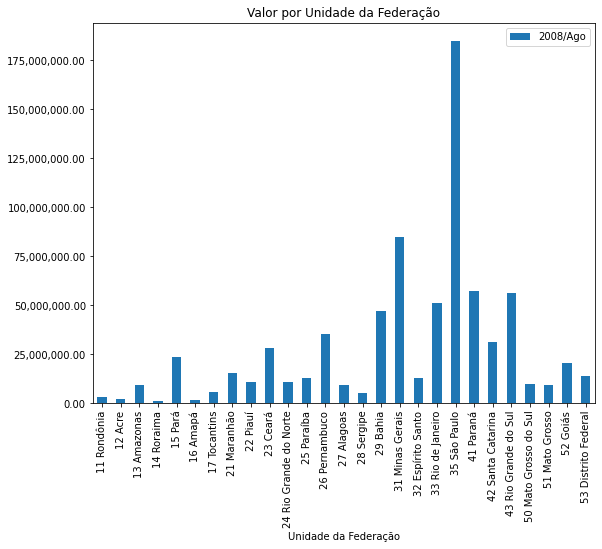

In [ ]:
ax = dados.plot( x="Unidade da Federação", y="2008/Ago", kind="bar", figsize=(9,7))
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.title("Valor por Unidade da Federação")
plt.grid
plt.show()

#### Desafios Aula 1

>Melhorar Titulo

>Fazer a mesma análise para um mês mais recente


In [ ]:
# Desafio 1
def f_grafico_procedimentos_hospitalares( mes):
    ax1 = dados.plot( x="Unidade da Federação", y=mes, kind="bar", figsize=(9,7))
    ax1.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
    plt.title("Procedimentos Hospitalares por Unidade da Federação em "+ mes )
    plt.xlabel("Unidade da Federação")
    plt.ylabel("Valor Gasto [R$]")
    plt.grid(linestyle=':')
    plt.legend([])
    plt.show()


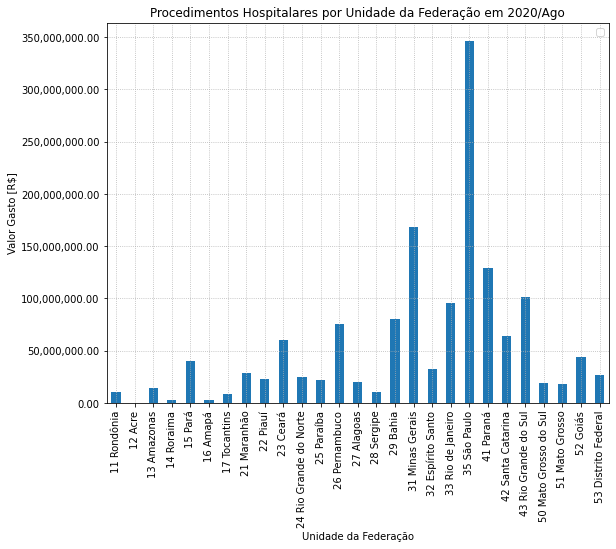

In [ ]:
# Desafio 2 mês mais recente
mes = dados.columns[1:-1]
f_grafico_procedimentos_hospitalares(mes[-1])

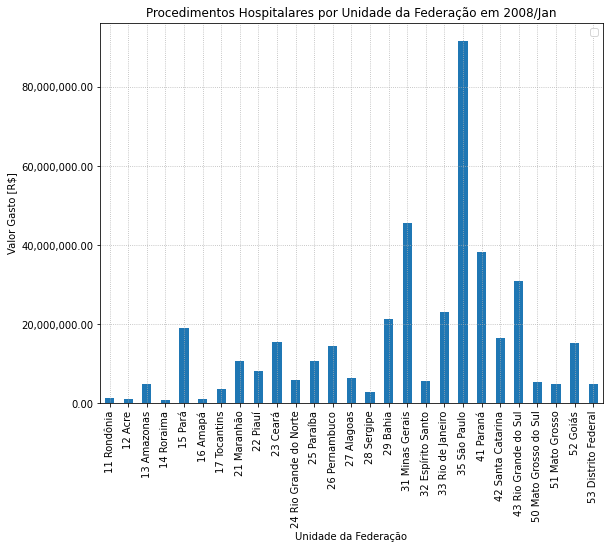

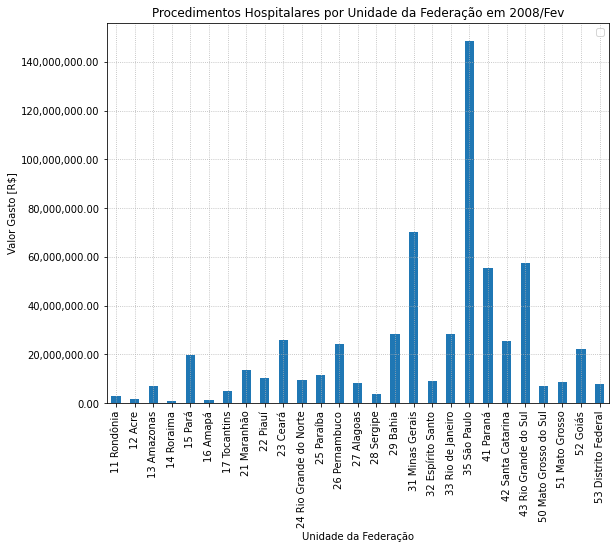

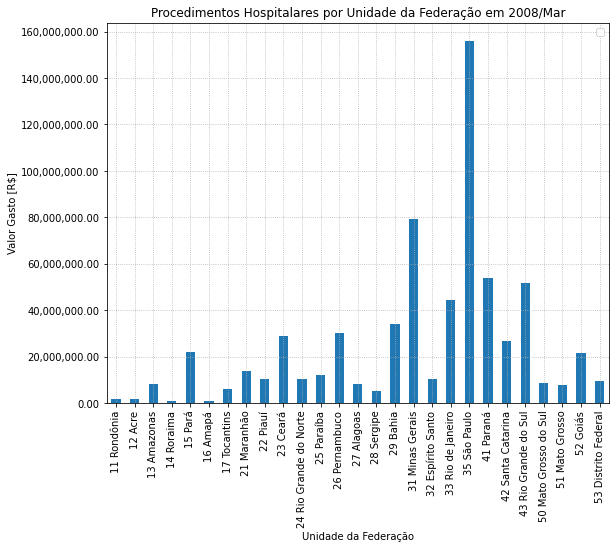

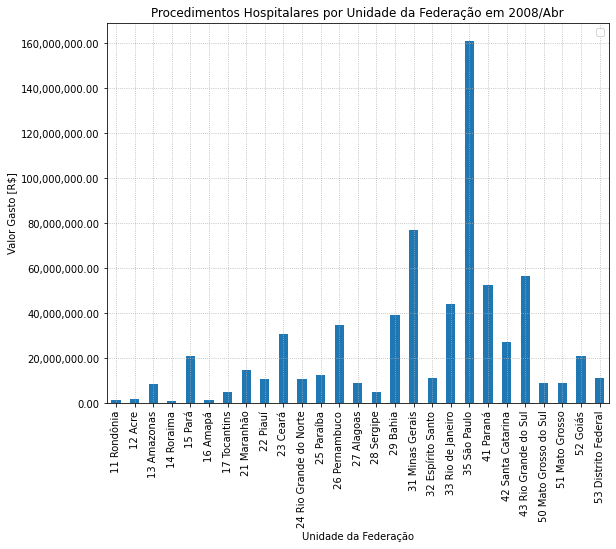

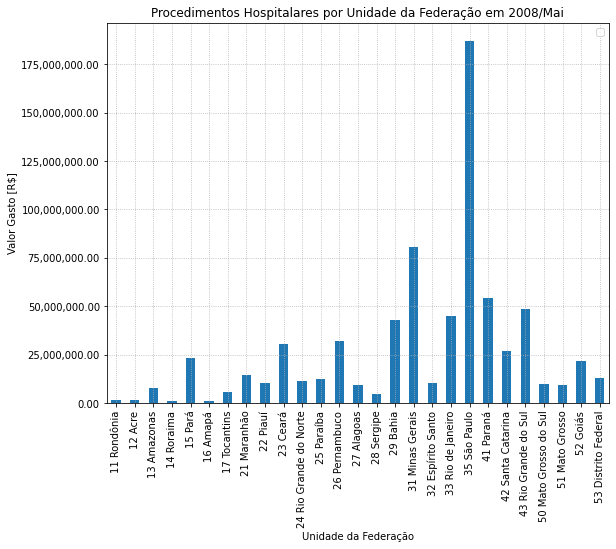

...

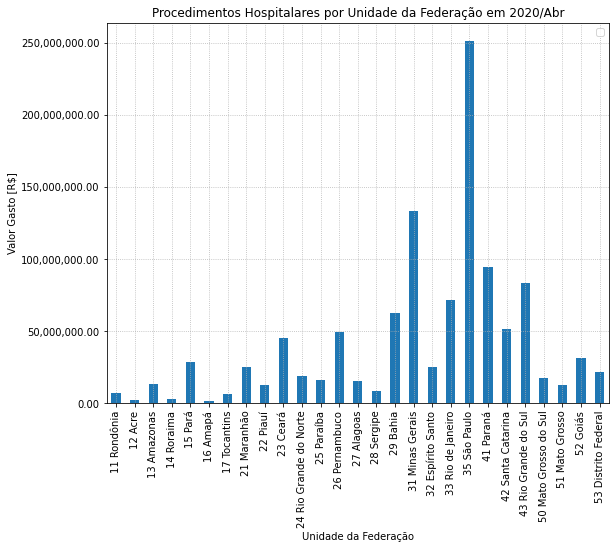

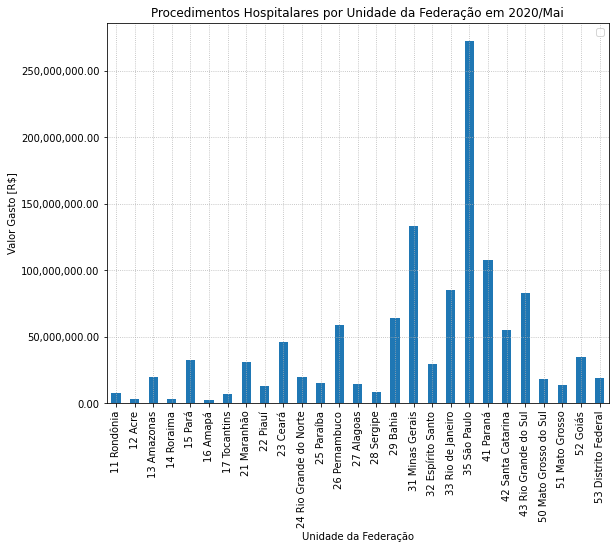

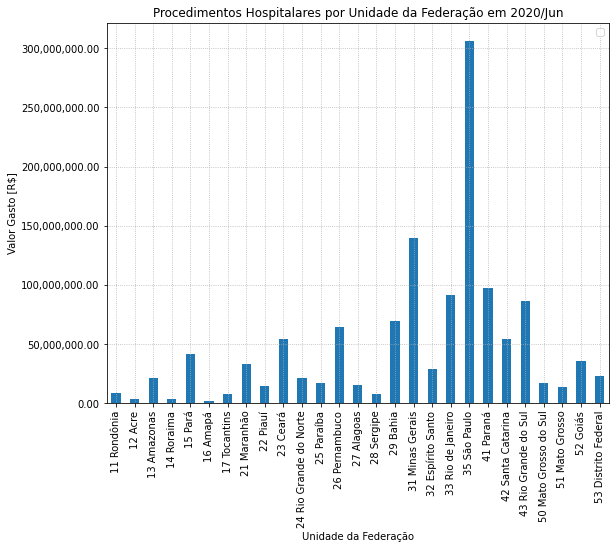

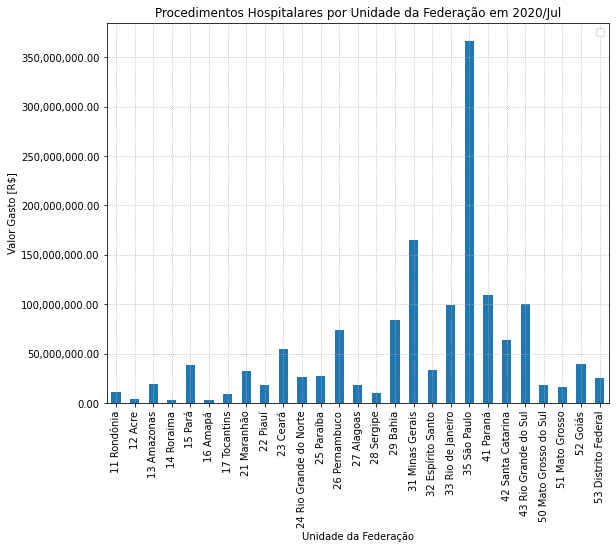

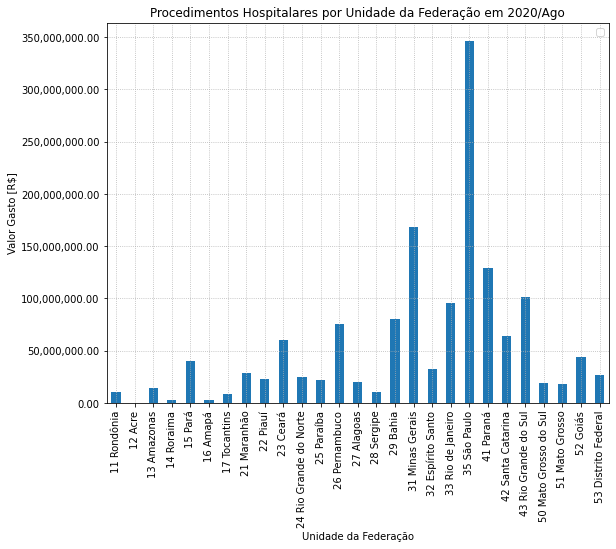

In [ ]:
# Desafio 2 Todos os meses
for x in mes:
    f_grafico_procedimentos_hospitalares(x)

###**M1A2.** Primeiras visualizações de dados

In [ ]:
fonte = "https://raw.githubusercontent.com/alura-cursos/agendamento-hospitalar/main/dados/A160324189_28_143_208.csv?raw=true"
dados2 = pd.read_csv(fonte,encoding="ISO-8859-1",skiprows=3,skipfooter=12,sep=";",thousands=".", decimal=",", na_values = '-' )

dados2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  


,Unidade da Federação,1992/Mar,1992/Abr,1993/Mai,1993/Dez,1994/Jan,1994/Fev,1994/Mai,1994/Ago,1994/Nov,1995/Jan,1995/Mar,1995/Jun,1995/Ago,1995/Dez,1996/Fev,1996/Mar,1996/Ago,1996/Dez,1997/Fev,1997/Nov,1998/Fev,1998/Mar,1998/Jul,1998/Ago,1998/Set,1998/Out,1998/Dez,1999/Fev,1999/Mar,1999/Mai,1999/Jul,1999/Ago,1999/Set,1999/Out,1999/Nov,1999/Dez,2000/Jan,2000/Fev,2000/Mar,...,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago,Total
0,11 Rondônia,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,8041248.80,8199032.67,8363386.07,7889819.50,8603943.85,8048398.25,8159737.49,8457455.71,7766983.20,8858845.57,8407076.44,9492938.92,8206195.92,9011612.58,9124967.84,8406732.72,8411360.02,8651081.66,8193425.99,8388269.45,8645315.78,9050329.13,9211262.51,9490545.02,8600886.20,8919190.86,8909111.89,8409386.09,8924348.41,8948605.66,8660753.05,8326416.32,8413784.42,7174312.31,7423678.64,8581195.13,9193593.76,7407388.24,3556381.57,929129659.72
1,12 Acre,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,3355223.35,3562691.54,3375296.64,3341497.58,3358378.05,3145385.44,2638773.92,2968168.75,2769797.39,3057631.96,2874965.31,3175575.17,3060903.21,3253011.61,3040645.05,2926179.27,3126120.64,2473454.85,2277493.49,2594347.32,2234388.36,2473008.49,2979764.77,3070533.95,3249052.69,3567538.64,2981072.98,2998860.31,3293378.97,3174249.43,2959569.09,3261123.88,2981264.22,2859102.06,2472063.08,2383895.48,2199920.70,1163813.08,nan,420668039.63
2,13 Amazonas,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,13718828.46,14396210.86,13745304.22,13979792.94,13895515.90,13518116.80,13635186.02,14549450.86,12753555.36,14749409.47,14577930.81,15381061.96,14653650.77,15544595.79,16374961.41,15343340.93,16249963.61,14255408.82,14274053.94,15358914.00,14100074.56,16103971.89,16154491.82,16529976.06,15509984.83,16642220.71,16493719.52,15346323.27,16282436.68,14781332.42,14923380.22,15939561.23,15138110.70,14773739.41,16330913.81,19441150.53,17509334.66,13358514.02,4726485.73,1771654871.23
3,14 Roraima,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,2699213.85,2682746.28,2891100.20,2737677.78,2693726.29,2671451.53,2688315.70,2740952.07,2478349.44,2674958.94,2721261.19,2844811.66,2967161.35,2841587.97,3328230.63,2878691.04,2964324.32,2524712.40,2462451.64,2662240.18,2499996.16,2846135.56,2789823.29,2839389.53,2647540.20,2865777.71,3181321.82,3070436.96,3162342.44,3121104.71,2889969.87,3084561.08,2967159.04,2813954.05,2304961.42,2910776.44,3216466.51,2739498.41,1524478.04,305010883.18
4,15 Pará,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,31808597.47,32133134.42,33770556.65,32979925.38,33665042.35,33475545.29,32067934.67,33615836.09,30623491.62,34121931.00,35039954.20,35424611.06,34160283.18,34484949.49,35618364.04,34380916.90,38441090.50,33583538.08,32789354.87,34513534.80,31885919.67,33236155.79,31008924.95,31064106.50,28543179.30,36713929.36,36462011.47,36790758.67,36974859.69,35555518.00,35222625.80,37009819.17,34635702.52,34749098.46,28714969.96,41248502.78,35396030.78,27618727.51,11559714.54,4437115730.71
5,16 Amapá,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,

In [ ]:
dados2[["2008/Ago","2008/Set"]].head()

,2008/Ago,2008/Set
0,2938286.29,2843930.91
1,1886871.84,2084884.80
2,8331763.97,8148089.92
3,1045291.11,1003740.89
4,23259148.28,23667690.01


In [ ]:
dados2.mean()

1992/Mar        40243.16
1992/Abr        11449.99
1993/Mai        34583.77
1993/Dez        68556.52
1994/Jan        39809.34
                ...     
2020/Mai     46769027.82
2020/Jun     45367349.74
2020/Jul     40717083.95
2020/Ago     19880851.12
Total      5993724452.01
Length: 279, dtype: float64

In [ ]:
colunas_usaveis = dados2.mean().index.tolist()
colunas_usaveis.insert(0, "Unidade da Federação")
colunas_usaveis

['Unidade da Federação',
 '1992/Mar',
 '1992/Abr',
 '1993/Mai',
 '1993/Dez',
 '1994/Jan',
 '1994/Fev',
 '1994/Mai',
 '1994/Ago',
 '1994/Nov',
 '1995/Jan',
 '1995/Mar',
 '1995/Jun',
 '1995/Ago',
 '1995/Dez',
 '1996/Fev',
 '1996/Mar',
 '1996/Ago',
 '1996/Dez',
 '1997/Fev',
 '1997/Nov',
 '1998/Fev',
 '1998/Mar',
 '1998/Jul',
 '1998/Ago',
 '1998/Set',
 '1998/Out',
 '1998/Dez',
 '1999/Fev',
 '1999/Mar',
 '1999/Mai',
 '1999/Jul',
 '1999/Ago',
 '1999/Set',
 '1999/Out',
 '1999/Nov',
 '1999/Dez',
 '2000/Jan',
 '2000/Fev',
 '2000/Mar',
 '2000/Abr',
 '2000/Mai',
 '2000/Jun',
 '2000/Jul',
 '2000/Ago',
 '2000/Set',
 '2000/Out',
 '2000/Nov',
 '2000/Dez',
 '2001/Jan',
 '2001/Fev',
 '2001/Mar',
 '2001/Abr',
 '2001/Mai',
 '2001/Jun',
 '2001/Jul',
 '2001/Ago',
 '2001/Set',
 '2001/Nov',
 '2001/Dez',
 '2002/Jan',
 '2002/Fev',
 '2002/Mar',
 '2002/Mai',
 '2002/Jun',
 '2002/Jul',
 '2002/Out',
 '2002/Nov',
 '2002/Dez',
 '2003/Jan',
 '2003/Fev',
 '2003/Mar',
 '2003/Abr',
 '2003/Jun',
 '2003/Jul',
 '2003/Ago',


In [ ]:
usaveis = dados2[colunas_usaveis]
usaveis.head()

,Unidade da Federação,1992/Mar,1992/Abr,1993/Mai,1993/Dez,1994/Jan,1994/Fev,1994/Mai,1994/Ago,1994/Nov,1995/Jan,1995/Mar,1995/Jun,1995/Ago,1995/Dez,1996/Fev,1996/Mar,1996/Ago,1996/Dez,1997/Fev,1997/Nov,1998/Fev,1998/Mar,1998/Jul,1998/Ago,1998/Set,1998/Out,1998/Dez,1999/Fev,1999/Mar,1999/Mai,1999/Jul,1999/Ago,1999/Set,1999/Out,1999/Nov,1999/Dez,2000/Jan,2000/Fev,2000/Mar,...,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago,Total
0,11 Rondônia,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,8041248.80,8199032.67,8363386.07,7889819.50,8603943.85,8048398.25,8159737.49,8457455.71,7766983.20,8858845.57,8407076.44,9492938.92,8206195.92,9011612.58,9124967.84,8406732.72,8411360.02,8651081.66,8193425.99,8388269.45,8645315.78,9050329.13,9211262.51,9490545.02,8600886.20,8919190.86,8909111.89,8409386.09,8924348.41,8948605.66,8660753.05,8326416.32,8413784.42,7174312.31,7423678.64,8581195.13,9193593.76,7407388.24,3556381.57,929129659.72
1,12 Acre,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,3355223.35,3562691.54,3375296.64,3341497.58,3358378.05,3145385.44,2638773.92,2968168.75,2769797.39,3057631.96,2874965.31,3175575.17,3060903.21,3253011.61,3040645.05,2926179.27,3126120.64,2473454.85,2277493.49,2594347.32,2234388.36,2473008.49,2979764.77,3070533.95,3249052.69,3567538.64,2981072.98,2998860.31,3293378.97,3174249.43,2959569.09,3261123.88,2981264.22,2859102.06,2472063.08,2383895.48,2199920.70,1163813.08,nan,420668039.63
2,13 Amazonas,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,13718828.46,14396210.86,13745304.22,13979792.94,13895515.90,13518116.80,13635186.02,14549450.86,12753555.36,14749409.47,14577930.81,15381061.96,14653650.77,15544595.79,16374961.41,15343340.93,16249963.61,14255408.82,14274053.94,15358914.00,14100074.56,16103971.89,16154491.82,16529976.06,15509984.83,16642220.71,16493719.52,15346323.27,16282436.68,14781332.42,14923380.22,15939561.23,15138110.70,14773739.41,16330913.81,19441150.53,17509334.66,13358514.02,4726485.73,1771654871.23
3,14 Roraima,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,2699213.85,2682746.28,2891100.20,2737677.78,2693726.29,2671451.53,2688315.70,2740952.07,2478349.44,2674958.94,2721261.19,2844811.66,2967161.35,2841587.97,3328230.63,2878691.04,2964324.32,2524712.40,2462451.64,2662240.18,2499996.16,2846135.56,2789823.29,2839389.53,2647540.20,2865777.71,3181321.82,3070436.96,3162342.44,3121104.71,2889969.87,3084561.08,2967159.04,2813954.05,2304961.42,2910776.44,3216466.51,2739498.41,1524478.04,305010883.18
4,15 Pará,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,31808597.47,32133134.42,33770556.65,32979925.38,33665042.35,33475545.29,32067934.67,33615836.09,30623491.62,34121931.00,35039954.20,35424611.06,34160283.18,34484949.49,35618364.04,34380916.90,38441090.50,33583538.08,32789354.87,34513534.80,31885919.67,33236155.79,31008924.95,31064106.50,28543179.30,36713929.36,36462011.47,36790758.67,36974859.69,35555518.00,35222625.80,37009819.17,34635702.52,34749098.46,28714969.96,41248502.78,35396030.78,27618727.51,11559714.54,4437115730.71


In [ ]:
usaveis = usaveis.set_index("Unidade da Federação")
usaveis

,1992/Mar,1992/Abr,1993/Mai,1993/Dez,1994/Jan,1994/Fev,1994/Mai,1994/Ago,1994/Nov,1995/Jan,1995/Mar,1995/Jun,1995/Ago,1995/Dez,1996/Fev,1996/Mar,1996/Ago,1996/Dez,1997/Fev,1997/Nov,1998/Fev,1998/Mar,1998/Jul,1998/Ago,1998/Set,1998/Out,1998/Dez,1999/Fev,1999/Mar,1999/Mai,1999/Jul,1999/Ago,1999/Set,1999/Out,1999/Nov,1999/Dez,2000/Jan,2000/Fev,2000/Mar,2000/Abr,...,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago,Total
Unidade da Federação,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
11 Rondônia,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,8041248.80,8199032.67,8363386.07,7889819.50,8603943.85,8048398.25,8159737.49,8457455.71,7766983.20,8858845.57,8407076.44,9492938.92,8206195.92,9011612.58,9124967.84,8406732.72,8411360.02,8651081.66,8193425.99,8388269.45,8645315.78,9050329.13,9211262.51,9490545.02,8600886.20,8919190.86,8909111.89,8409386.09,8924348.41,8948605.66,8660753.05,8326416.32,8413784.42,7174312.31,7423678.64,8581195.13,9193593.76,7407388.24,3556381.57,929129659.72
12 Acre,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,3355223.35,3562691.54,3375296.64,3341497.58,3358378.05,3145385.44,2638773.92,2968168.75,2769797.39,3057631.96,2874965.31,3175575.17,3060903.21,3253011.61,3040645.05,2926179.27,3126120.64,2473454.85,2277493.49,2594347.32,2234388.36,2473008.49,2979764.77,3070533.95,3249052.69,3567538.64,2981072.98,2998860.31,3293378.97,3174249.43,2959569.09,3261123.88,2981264.22,2859102.06,2472063.08,2383895.48,2199920.70,1163813.08,nan,420668039.63
13 Amazonas,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,13718828.46,14396210.86,13745304.22,13979792.94,13895515.90,13518116.80,13635186.02,14549450.86,12753555.36,14749409.47,14577930.81,15381061.96,14653650.77,15544595.79,16374961.41,15343340.93,16249963.61,14255408.82,14274053.94,15358914.00,14100074.56,16103971.89,16154491.82,16529976.06,15509984.83,16642220.71,16493719.52,15346323.27,16282436.68,14781332.42,14923380.22,15939561.23,15138110.70,14773739.41,16330913.81,19441150.53,17509334.66,13358514.02,4726485.73,1771654871.23
14 Roraima,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,2699213.85,2682746.28,2891100.20,2737677.78,2693726.29,2671451.53,2688315.70,2740952.07,2478349.44,2674958.94,2721261.19,2844811.66,2967161.35,2841587.97,3328230.63,2878691.04,2964324.32,2524712.40,2462451.64,2662240.18,2499996.16,2846135.56,2789823.29,2839389.53,2647540.20,2865777.71,3181321.82,3070436.96,3162342.44,3121104.71,2889969.87,3084561.08,2967159.04,2813954.05,2304961.42,2910776.44,3216466.51,2739498.41,1524478.04,305010883.18
15 Pará,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,31808597.47,32133134.42,33770556.65,32979925.38,33665042.35,33475545.29,32067934.67,33615836.09,30623491.62,34121931.00,35039954.20,35424611.06,34160283.18,34484949.49,35618364.04,34380916.90,38441090.50,33583538.08,32789354.87,34513534.80,31885919.67,33236155.79,31008924.95,31064106.50,28543179.30,36713929.36,36462011.47,36790758.67,36974859.69,35555518.00,35222625.80,37009819.17,34635702.52,34749098.46,28714969.96,41248502.78,35396030.78,27618727.51,11559714.54,4437115730.71
16 Amapá,nan,nan,nan,na

In [ ]:
usaveis["2019/Ago"]

Unidade da Federação
11 Rondônia                8909111.89
12 Acre                    2981072.98
13 Amazonas               16493719.52
14 Roraima                 3181321.82
15 Pará                   36462011.47
16 Amapá                   2173060.89
17 Tocantins               7140062.79
21 Maranhão               31374191.37
22 Piauí                  17816404.11
23 Ceará                  51672585.01
24 Rio Grande do Norte    23073307.72
25 Paraíba                19854699.54
26 Pernambuco             71735626.96
27 Alagoas                17668105.59
28 Sergipe                10075280.52
29 Bahia                  77852441.31
31 Minas Gerais          161707825.05
32 Espírito Santo         29298721.79
33 Rio de Janeiro         83311603.59
35 São Paulo             302367276.77
41 Paraná                127174095.05
42 Santa Catarina         64503540.72
43 Rio Grande do Sul      98546110.10
50 Mato Grosso do Sul     19217982.14
51 Mato Grosso            16532335.42
52 Goiás                  383

In [ ]:
usaveis.loc["12 Acre"]

1992/Mar            nan
1992/Abr            nan
1993/Mai            nan
1993/Dez            nan
1994/Jan            nan
               ...     
2020/Mai     2383895.48
2020/Jun     2199920.70
2020/Jul     1163813.08
2020/Ago            nan
Total      420668039.63
Name: 12 Acre, Length: 279, dtype: float64

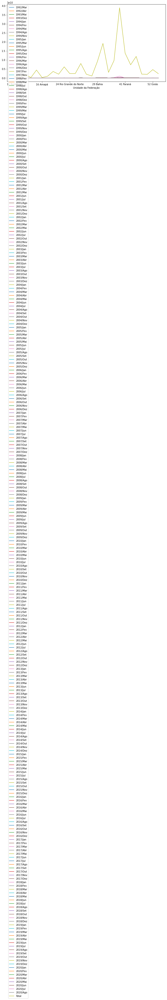

In [ ]:
usaveis.plot(figsize=(12,6))

In [ ]:
usaveis.T.head()

Unidade da Federação,11 Rondônia,12 Acre,13 Amazonas,14 Roraima,15 Pará,16 Amapá,17 Tocantins,21 Maranhão,22 Piauí,23 Ceará,24 Rio Grande do Norte,25 Paraíba,26 Pernambuco,27 Alagoas,28 Sergipe,29 Bahia,31 Minas Gerais,32 Espírito Santo,33 Rio de Janeiro,35 São Paulo,41 Paraná,42 Santa Catarina,43 Rio Grande do Sul,50 Mato Grosso do Sul,51 Mato Grosso,52 Goiás,53 Distrito Federal
1992/Mar,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,40243.16,nan,nan,nan,nan,nan,nan,nan
1992/Abr,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,11449.99,nan,nan,nan,nan,nan,nan,nan
1993/Mai,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,34583.77,nan,nan,nan,nan,nan,nan,nan
1993/Dez,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,68556.52,nan,nan,nan,nan,nan,nan,nan
1994/Jan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,39809.34,nan,nan,nan,nan,nan,nan,nan


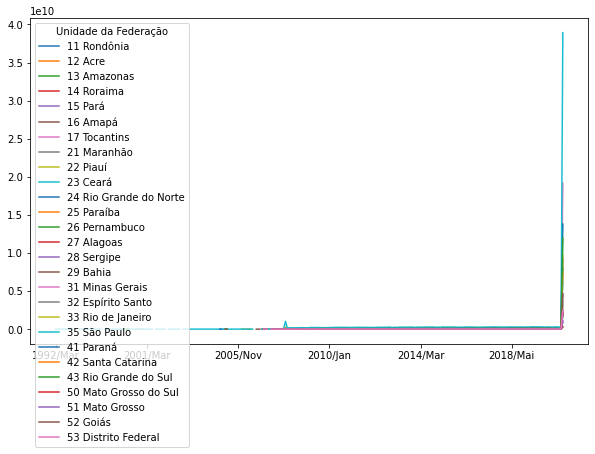

In [ ]:
usaveis.T.plot(figsize=(10,6))

In [ ]:
usaveis = usaveis.drop("Total", axis=1)

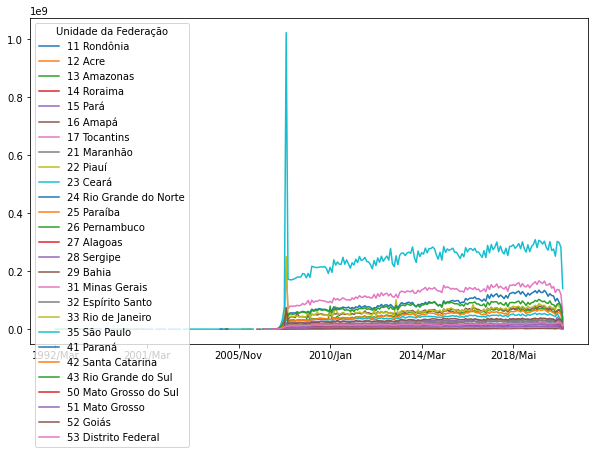

In [ ]:
usaveis.T.plot(figsize=(10,6))

####Desafios Aula 2
>Legenda separada 

>Visualizar 5 estados 

In [ ]:
colunas2 = colunas_usaveis[91+3*12:-1]
colunas2

['2008/Jan',
 '2008/Fev',
 '2008/Mar',
 '2008/Abr',
 '2008/Mai',
 '2008/Jun',
 '2008/Jul',
 '2008/Ago',
 '2008/Set',
 '2008/Out',
 '2008/Nov',
 '2008/Dez',
 '2009/Jan',
 '2009/Fev',
 '2009/Mar',
 '2009/Abr',
 '2009/Mai',
 '2009/Jun',
 '2009/Jul',
 '2009/Ago',
 '2009/Set',
 '2009/Out',
 '2009/Nov',
 '2009/Dez',
 '2010/Jan',
 '2010/Fev',
 '2010/Mar',
 '2010/Abr',
 '2010/Mai',
 '2010/Jun',
 '2010/Jul',
 '2010/Ago',
 '2010/Set',
 '2010/Out',
 '2010/Nov',
 '2010/Dez',
 '2011/Jan',
 '2011/Fev',
 '2011/Mar',
 '2011/Abr',
 '2011/Mai',
 '2011/Jun',
 '2011/Jul',
 '2011/Ago',
 '2011/Set',
 '2011/Out',
 '2011/Nov',
 '2011/Dez',
 '2012/Jan',
 '2012/Fev',
 '2012/Mar',
 '2012/Abr',
 '2012/Mai',
 '2012/Jun',
 '2012/Jul',
 '2012/Ago',
 '2012/Set',
 '2012/Out',
 '2012/Nov',
 '2012/Dez',
 '2013/Jan',
 '2013/Fev',
 '2013/Mar',
 '2013/Abr',
 '2013/Mai',
 '2013/Jun',
 '2013/Jul',
 '2013/Ago',
 '2013/Set',
 '2013/Out',
 '2013/Nov',
 '2013/Dez',
 '2014/Jan',
 '2014/Fev',
 '2014/Mar',
 '2014/Abr',
 '2014/Mai',

In [ ]:
usaveis2 = usaveis[colunas2]
usaveis2

,2008/Jan,2008/Fev,2008/Mar,2008/Abr,2008/Mai,2008/Jun,2008/Jul,2008/Ago,2008/Set,2008/Out,2008/Nov,2008/Dez,2009/Jan,2009/Fev,2009/Mar,2009/Abr,2009/Mai,2009/Jun,2009/Jul,2009/Ago,2009/Set,2009/Out,2009/Nov,2009/Dez,2010/Jan,2010/Fev,2010/Mar,2010/Abr,2010/Mai,2010/Jun,2010/Jul,2010/Ago,2010/Set,2010/Out,2010/Nov,2010/Dez,2011/Jan,2011/Fev,2011/Mar,2011/Abr,...,2017/Mai,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago
Unidade da Federação,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
11 Rondônia,1829559.71,1940792.63,1955721.68,2143353.81,2280382.58,2624542.97,2973421.02,2938286.29,2843930.91,2878153.20,2780022.62,2651804.89,3147566.24,3082108.12,4190355.33,4040251.62,3946423.71,3372377.96,3720608.86,3787323.26,3679369.94,3866146.99,3667808.60,3633471.79,3812315.59,3911776.03,4663060.75,4524544.88,4778755.26,4369733.23,4632439.12,4464307.47,4668642.02,4490368.23,4423840.08,4384430.09,4173529.95,4293085.61,4674947.02,5087527.81,...,8140639.49,8041248.80,8199032.67,8363386.07,7889819.50,8603943.85,8048398.25,8159737.49,8457455.71,7766983.20,8858845.57,8407076.44,9492938.92,8206195.92,9011612.58,9124967.84,8406732.72,8411360.02,8651081.66,8193425.99,8388269.45,8645315.78,9050329.13,9211262.51,9490545.02,8600886.20,8919190.86,8909111.89,8409386.09,8924348.41,8948605.66,8660753.05,8326416.32,8413784.42,7174312.31,7423678.64,8581195.13,9193593.76,7407388.24,3556381.57
12 Acre,1731744.62,1743978.66,2057439.02,2057829.69,2226577.93,2112576.82,2029128.01,1886871.84,2084884.80,2230838.45,2122013.12,2196651.69,2152239.30,2086775.61,2476364.26,2396887.63,2610261.80,2174098.10,2051885.16,1714707.91,1341532.34,2288458.90,2462712.79,2254900.20,2381535.93,2079981.05,2564837.77,2588318.06,2538525.67,2319786.41,2279156.60,2454599.37,2578923.75,2625443.29,2512995.15,2500589.76,2749521.65,2473515.82,2801446.23,2672803.31,...,3161446.53,3355223.35,3562691.54,3375296.64,3341497.58,3358378.05,3145385.44,2638773.92,2968168.75,2769797.39,3057631.96,2874965.31,3175575.17,3060903.21,3253011.61,3040645.05,2926179.27,3126120.64,2473454.85,2277493.49,2594347.32,2234388.36,2473008.49,2979764.77,3070533.95,3249052.69,3567538.64,2981072.98,2998860.31,3293378.97,3174249.43,2959569.09,3261123.88,2981264.22,2859102.06,2472063.08,2383895.48,2199920.70,1163813.08,nan
13 Amazonas,11419210.08,7934652.10,8641517.13,8531576.49,9079902.15,8646295.77,8755806.50,8331763.97,8148089.92,7681661.02,7761445.21,7764782.66,8607222.74,8385962.92,9207129.28,8160517.20,8562322.43,9484998.71,9465068.52,9267006.58,9092823.55,9218407.34,8674068.02,8365788.46,9386945.03,8373048.81,10321150.01,9990164.13,9767161.23,9151838.50,9140196.88,9437224.41,9742680.49,9996686.44,9532878.27,9335803.05,9800511.52,9461664.54,10954545.77,10529645.04,...,13909566.03,13718828.46,14396210.86,13745304.22,13979792.94,13895515.90,13518116.80,13635186.02,14549450.86,12753555.36,14749409.47,14577930.81,15381061.96,14653650.77,15544595.79,16374961.41,15343340.93,16249963.61,14255408.82,14274053.94,15358914.00,14100074.56,16103971.89,16154491.82,16529976.06,15509984.83,16642220.71,16493719.52,15346323.27,16282436.68,14781332.42,14923380.22,15939561.23,15138110.70,14773739.41,16330913.81,19441150.53,17509334.66,13358514.02,4726485.73
14 Roraima,808448.39,771687.83,876091.18,896952.53,1027288.73,938293.54,1004340.44,1045291.11,1003740.89,1055063.43,1223200.73,1236529.18,1186281.36,1106225.18,1422690.18,1377859.19,1363883.01,1346660.89,1371019.37,1529696.18,1573418.68,1517391.92,1597811.24,1536941.82,1617781.76,1452295.35,1817004.16,1715762.10,1933733.03,1849065.95,1877204.62,2046063.98,1939488.67,1757675.71,1528245.34,1485166.60,1604886.45,1220176.72,1276120.86,1379942.19,...,276

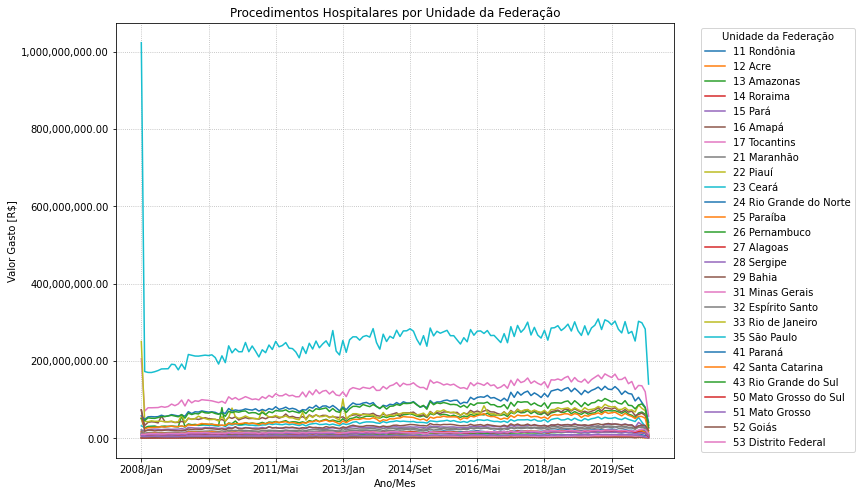

In [ ]:
ax2 = usaveis2.T.plot(figsize=(10,8) )
ax2.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.title("Procedimentos Hospitalares por Unidade da Federação" )
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")
plt.grid(linestyle=':')
plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

In [ ]:
Norte = usaveis2.index[0:7]
Nordeste = usaveis2.index[7:16]
Sudeste = usaveis2.index[16:20]
Sul = usaveis2.index[20:23]
Centro_Oeste = usaveis2.index[23:27]

regioes={1:Norte,2:Nordeste,3:Sudeste,4:Sul,5:Centro_Oeste}
nome_reg=("0","Norte","Nordeste","Sudeste","Sul","Centro Oeste")

In [ ]:
regioes[1]

Index(['11 Rondônia', '12 Acre', '13 Amazonas', '14 Roraima', '15 Pará',
       '16 Amapá', '17 Tocantins'],
      dtype='object', name='Unidade da Federação')

In [ ]:
nome_reg[1]

'Norte'

In [ ]:
def f_graf_regioes(r):
    ax2 = usaveis2.loc[regioes[r]].T.plot(figsize=(10,8) )
    ax2.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
    plt.title("Procedimentos Hospitalares Região " + nome_reg[r])
    plt.xlabel("Ano/Mes")
    plt.ylabel("Valor Gasto [R$]")
    plt.grid(linestyle=':')
    plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

    plt.show()

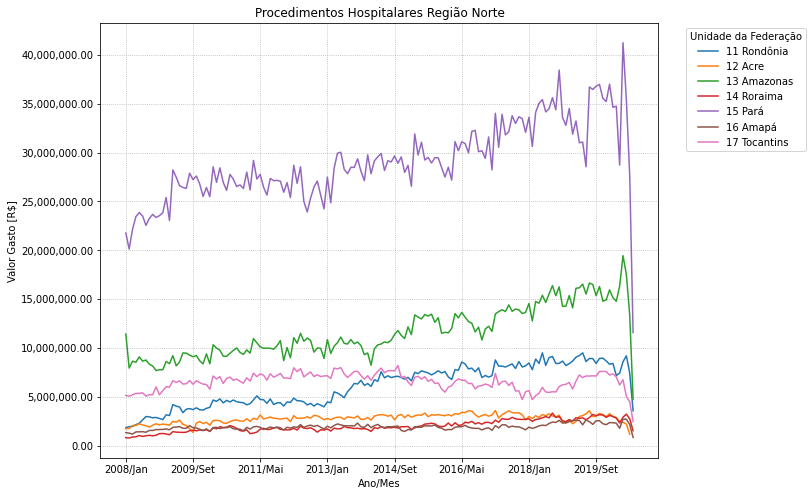

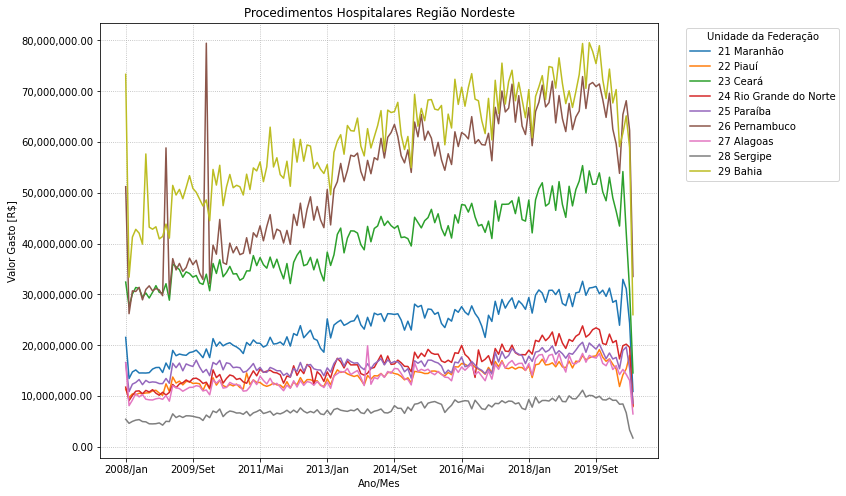

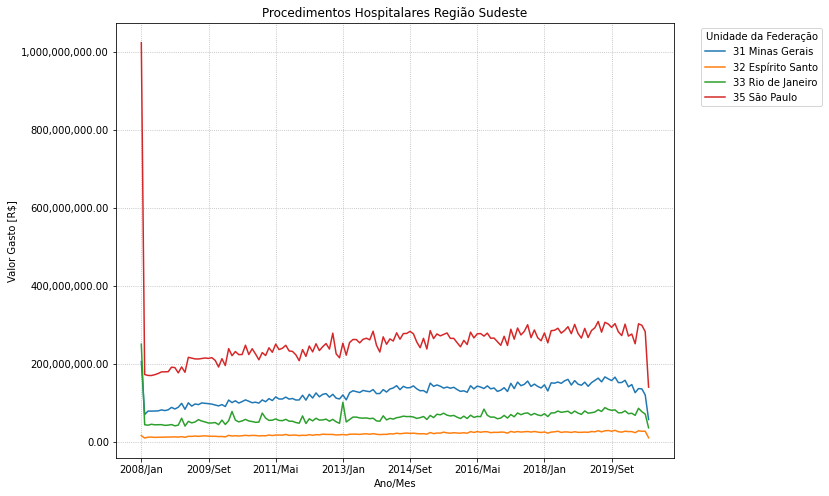

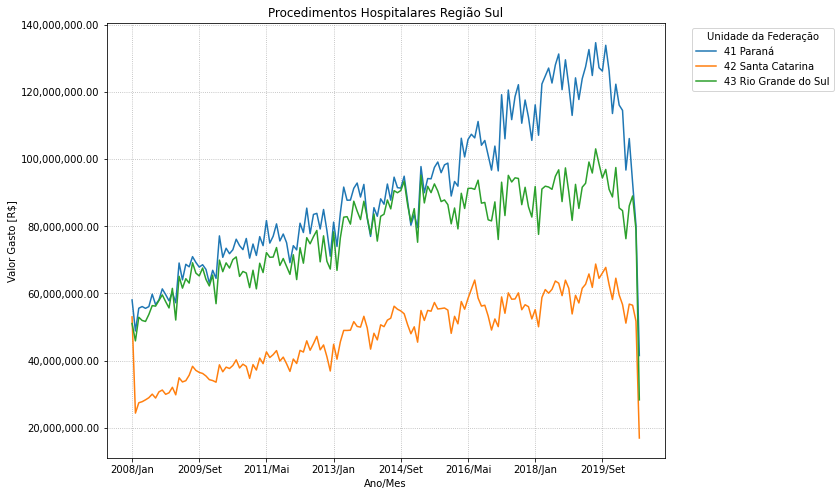

In [ ]:
for x in range(1,5):
    f_graf_regioes(x)

###**M1A3.** Manipulação de dados

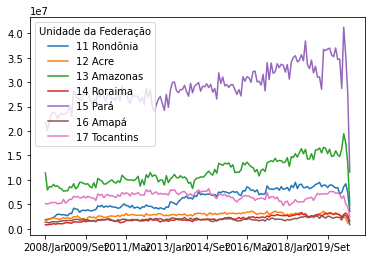

In [ ]:
usaveis2[:7].T.plot()

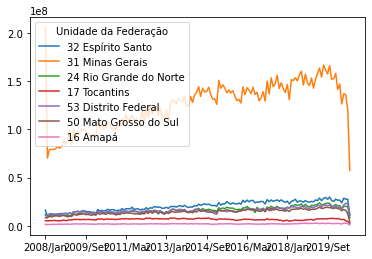

In [ ]:
np.random.seed(687942)
usaveis2.sample(n=7).T.plot()

In [ ]:
usaveis2.head()

,2008/Jan,2008/Fev,2008/Mar,2008/Abr,2008/Mai,2008/Jun,2008/Jul,2008/Ago,2008/Set,2008/Out,2008/Nov,2008/Dez,2009/Jan,2009/Fev,2009/Mar,2009/Abr,2009/Mai,2009/Jun,2009/Jul,2009/Ago,2009/Set,2009/Out,2009/Nov,2009/Dez,2010/Jan,2010/Fev,2010/Mar,2010/Abr,2010/Mai,2010/Jun,2010/Jul,2010/Ago,2010/Set,2010/Out,2010/Nov,2010/Dez,2011/Jan,2011/Fev,2011/Mar,2011/Abr,...,2017/Mai,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago
Unidade da Federação,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
11 Rondônia,1829559.71,1940792.63,1955721.68,2143353.81,2280382.58,2624542.97,2973421.02,2938286.29,2843930.91,2878153.20,2780022.62,2651804.89,3147566.24,3082108.12,4190355.33,4040251.62,3946423.71,3372377.96,3720608.86,3787323.26,3679369.94,3866146.99,3667808.60,3633471.79,3812315.59,3911776.03,4663060.75,4524544.88,4778755.26,4369733.23,4632439.12,4464307.47,4668642.02,4490368.23,4423840.08,4384430.09,4173529.95,4293085.61,4674947.02,5087527.81,...,8140639.49,8041248.80,8199032.67,8363386.07,7889819.50,8603943.85,8048398.25,8159737.49,8457455.71,7766983.20,8858845.57,8407076.44,9492938.92,8206195.92,9011612.58,9124967.84,8406732.72,8411360.02,8651081.66,8193425.99,8388269.45,8645315.78,9050329.13,9211262.51,9490545.02,8600886.20,8919190.86,8909111.89,8409386.09,8924348.41,8948605.66,8660753.05,8326416.32,8413784.42,7174312.31,7423678.64,8581195.13,9193593.76,7407388.24,3556381.57
12 Acre,1731744.62,1743978.66,2057439.02,2057829.69,2226577.93,2112576.82,2029128.01,1886871.84,2084884.80,2230838.45,2122013.12,2196651.69,2152239.30,2086775.61,2476364.26,2396887.63,2610261.80,2174098.10,2051885.16,1714707.91,1341532.34,2288458.90,2462712.79,2254900.20,2381535.93,2079981.05,2564837.77,2588318.06,2538525.67,2319786.41,2279156.60,2454599.37,2578923.75,2625443.29,2512995.15,2500589.76,2749521.65,2473515.82,2801446.23,2672803.31,...,3161446.53,3355223.35,3562691.54,3375296.64,3341497.58,3358378.05,3145385.44,2638773.92,2968168.75,2769797.39,3057631.96,2874965.31,3175575.17,3060903.21,3253011.61,3040645.05,2926179.27,3126120.64,2473454.85,2277493.49,2594347.32,2234388.36,2473008.49,2979764.77,3070533.95,3249052.69,3567538.64,2981072.98,2998860.31,3293378.97,3174249.43,2959569.09,3261123.88,2981264.22,2859102.06,2472063.08,2383895.48,2199920.70,1163813.08,nan
13 Amazonas,11419210.08,7934652.10,8641517.13,8531576.49,9079902.15,8646295.77,8755806.50,8331763.97,8148089.92,7681661.02,7761445.21,7764782.66,8607222.74,8385962.92,9207129.28,8160517.20,8562322.43,9484998.71,9465068.52,9267006.58,9092823.55,9218407.34,8674068.02,8365788.46,9386945.03,8373048.81,10321150.01,9990164.13,9767161.23,9151838.50,9140196.88,9437224.41,9742680.49,9996686.44,9532878.27,9335803.05,9800511.52,9461664.54,10954545.77,10529645.04,...,13909566.03,13718828.46,14396210.86,13745304.22,13979792.94,13895515.90,13518116.80,13635186.02,14549450.86,12753555.36,14749409.47,14577930.81,15381061.96,14653650.77,15544595.79,16374961.41,15343340.93,16249963.61,14255408.82,14274053.94,15358914.00,14100074.56,16103971.89,16154491.82,16529976.06,15509984.83,16642220.71,16493719.52,15346323.27,16282436.68,14781332.42,14923380.22,15939561.23,15138110.70,14773739.41,16330913.81,19441150.53,17509334.66,13358514.02,4726485.73
14 Roraima,808448.39,771687.83,876091.18,896952.53,1027288.73,938293.54,1004340.44,1045291.11,1003740.89,1055063.43,1223200.73,1236529.18,1186281.36,1106225.18,1422690.18,1377859.19,1363883.01,1346660.89,1371019.37,1529696.18,1573418.68,1517391.92,1597811.24,1536941.82,1617781.76,1452295.35,1817004.16,1715762.10,1933733.03,1849065.95,1877204.62,2046063.98,1939488.67,1757675.71,1528245.34,1485166.60,1604886.45,1220176.72,1276120.86,1379942.19,...,276

In [ ]:
#usaveis2 = usaveis2.drop(columns="Total")
usaveis2.sum()

2008/Jan   2043825080.21
2008/Fev    643042732.56
2008/Mar    698654217.70
2008/Abr    707681317.65
2008/Mai    707813813.59
                ...     
2020/Abr   1080153330.85
2020/Mai   1262763751.01
2020/Jun   1224918442.85
2020/Jul   1099361266.73
2020/Ago    516902129.10
Length: 152, dtype: float64

In [ ]:
usaveis2["Total"] = usaveis2.sum()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
ordenados_por_total = usaveis2.sort_values("Total", ascending=False)
ordenados_por_total = ordenados_por_total.drop("Total", axis=1 )

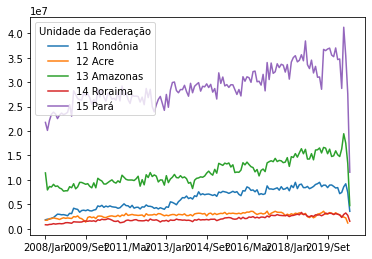

In [ ]:
ordenados_por_total.head(5).T.plot()

 ***MUDANDO A FONTE DE DADOS***


In [ ]:
colunas3 = []
colunas_usaveis = df.mean().index.tolist()
colunas3 = colunas_usaveis[114:]
colunas3.insert(0,"Unidade da Federação")
colunas3[:5]

['Unidade da Federação', '2007/Jan', '2007/Fev', '2007/Mar', '2007/Abr']

In [ ]:
ordenados_por_total = df[colunas3].sort_values("Total",ascending=False)
ordenados_por_total = ordenados_por_total.drop("Total",axis=1)
ordenados_por_total = ordenados_por_total.set_index("Unidade da Federação")

In [ ]:
ordenados_por_total.head(5)


,2007/Jan,2007/Fev,2007/Mar,2007/Abr,2007/Mai,2007/Jun,2007/Jul,2007/Ago,2007/Set,2007/Out,2007/Nov,2007/Dez,2008/Jan,2008/Fev,2008/Mar,2008/Abr,2008/Mai,2008/Jun,2008/Jul,2008/Ago,2008/Set,2008/Out,2008/Nov,2008/Dez,2009/Jan,2009/Fev,2009/Mar,2009/Abr,2009/Mai,2009/Jun,2009/Jul,2009/Ago,2009/Set,2009/Out,2009/Nov,2009/Dez,2010/Jan,2010/Fev,2010/Mar,2010/Abr,...,2017/Mai,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago
Unidade da Federação,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
35 São Paulo,27961.35,62859.39,45586.58,19967.71,15514.23,116836.99,367978.67,1665349.90,4434168.64,14577395.84,35032259.98,76668547.41,1023564534.21,172834914.73,170481849.56,170278285.95,172402180.59,175416595.83,179525002.10,179898070.22,180082203.71,191685220.08,190539738.80,177086380.69,192321557.36,178596376.79,216951591.57,215053018.45,212890248.16,212670900.80,214041237.42,215212536.08,214135444.45,216056582.61,208973892.04,192127099.10,213467885.76,195784795.23,239323932.16,221172991.21,...,292113404.78,274301073.14,283534617.42,300593738.96,267297243.95,287114784.48,267113249.04,259451685.90,279497570.89,254004628.07,285270559.62,286191965.06,291440947.02,278926018.36,285851919.68,295419311.15,277576166.24,301454867.05,278114302.44,266239800.80,291081406.59,267662508.70,285576312.72,292584828.35,308925598.24,281405146.78,306633987.91,302367276.77,293685713.15,303382527.10,282391773.21,272697695.04,301991167.67,271356784.04,276606288.92,251696362.66,302857660.98,299060851.62,282709570.31,140414944.95
31 Minas Gerais,6313.69,1117.91,nan,2206.89,38672.41,16555.13,90760.11,971394.37,2861781.50,10018011.35,21730281.63,43429517.54,205912743.65,70301089.50,79119005.51,79046322.41,79268070.12,79608652.53,82200224.47,80374117.08,82400146.79,88613476.60,84486996.11,88928630.30,99018155.84,83675119.83,100240651.84,91831325.37,97289703.07,95723396.53,100050008.70,98968064.76,98202119.08,96962394.27,94767639.13,92412770.73,95806556.42,90764890.28,107389850.03,100829767.38,...,153412119.69,144291438.09,147533496.74,156055553.43,142285103.84,148306094.14,142323944.76,138341191.84,146501618.07,130702126.27,151496245.19,150687602.95,153589259.44,150251751.37,156633990.16,160420043.49,145941007.54,157247579.70,148172783.99,145387240.73,153177305.19,142669153.77,151943630.56,157922598.68,163591461.79,154114822.71,166735650.41,161707825.05,157419731.93,166133803.32,152106660.17,152398599.06,158097903.98,141323175.61,147078556.29,126330649.86,136867275.75,135977571.87,120467187.34,57473699.06
41 Paraná,840.14,1303.55,74.94,nan,5930.30,12273.67,143586.15,554800.22,1431708.01,4630402.44,11120030.79,28790722.87,58081334.45,48855046.46,55611791.07,56115135.82,55574831.93,56094754.74,59802402.07,56699001.13,58091985.79,61365941.22,59667208.62,57816197.74,60381593.99,57239101.63,69070488.20,64054678.26,68685542.95,67931227.06,70958762.64,69225783.96,67849968.52,68558209.28,67158496.97,63094274.28,66902643.63,64501133.64,77138870.60,70755396.99,...,120535312.96,111725261.22,118590172.07,122122835.72,110656147.72,117567691.91,112457522.94,105558123.29,116133193.49,107075982.24,122331354.51,124731345.17,127073853.11,122616924.02,127991900.80,131257163.40,120647377.43,129530163.96,121810669.26,112984630.73,124159239.68,117715473.32,123907372.22,127447033.66,132576563.13,124858292.37,134621315.53,127174095.05,126172679.50,133847978.48,126209369.22,113545318.91,122268754.10,116061602.52,114476997.52,96727112.19,106103737.62,92901461.36,80320852.69,41542401.16
43 Rio Grande do Sul,nan,nan,nan,nan,nan,11694.41,100916.50,1049252.33,3182913.14,8571312.11,16592432.80,30134255.70,51064610.03,45897704.82,52928695.92,51972416.77,51679350.79,53759

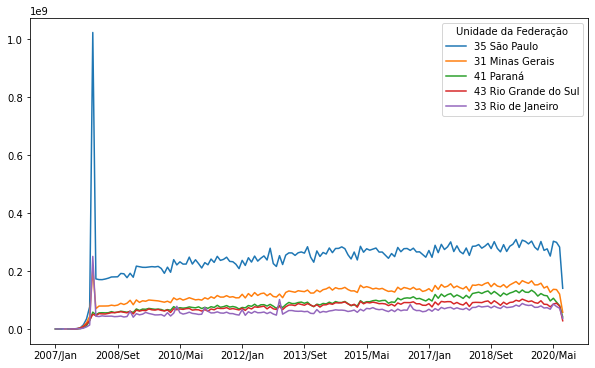

In [ ]:
ordenados_por_total.head(5).T.plot(figsize = (10,6))

####Desafios Aula 3

>Mudar palete de cores

>adicionar uma coluna mostrando a região de cada estado

>embelezar o Grafáco

>adicionar um estado para análise  


#### Adicionar coluna com a Região

In [ ]:
dfreg = df[colunas3]
dfreg = dfreg.set_index("Unidade da Federação")
dfreg["Região"] = dfreg.index.str[0]
regioes_map = {1:"Norte",2:"Nordeste",3:"Sudeste",4:"Sul",5:"Centro-Oeste"}
dfreg["Região"] = dfreg["Região"].map(lambda x: regioes_map[int(x)])
dfreg["Região"]

Unidade da Federação
11 Rondônia                      Norte
12 Acre                          Norte
13 Amazonas                      Norte
14 Roraima                       Norte
15 Pará                          Norte
16 Amapá                         Norte
17 Tocantins                     Norte
21 Maranhão                   Nordeste
22 Piauí                      Nordeste
23 Ceará                      Nordeste
24 Rio Grande do Norte        Nordeste
25 Paraíba                    Nordeste
26 Pernambuco                 Nordeste
27 Alagoas                    Nordeste
28 Sergipe                    Nordeste
29 Bahia                      Nordeste
31 Minas Gerais                Sudeste
32 Espírito Santo              Sudeste
33 Rio de Janeiro              Sudeste
35 São Paulo                   Sudeste
41 Paraná                          Sul
42 Santa Catarina                  Sul
43 Rio Grande do Sul               Sul
50 Mato Grosso do Sul     Centro-Oeste
51 Mato Grosso            Centro-Oeste
52 G

#### Adicionar estado para análise

In [ ]:
#acrescentar um estado para análise

analise = ordenados_por_total.index[:5].tolist()
analise.append("12 Acre")
analise


['35 São Paulo',
 '31 Minas Gerais',
 '41 Paraná',
 '43 Rio Grande do Sul',
 '33 Rio de Janeiro',
 '12 Acre']

In [ ]:
janela = ordenados_por_total.columns[13:-4]

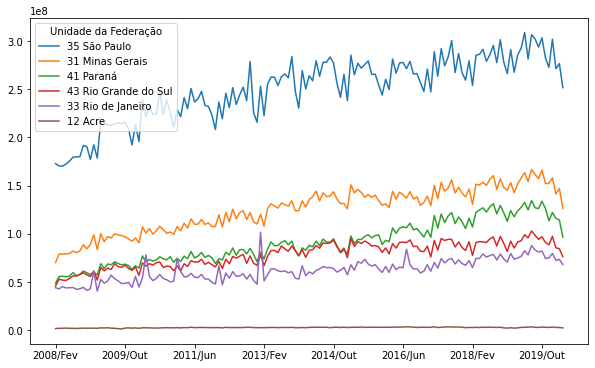

In [ ]:
ordenados_por_total[janela].loc[analise].T.plot(figsize = (10,6))

#### Embelezar o grafico + Paletas

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

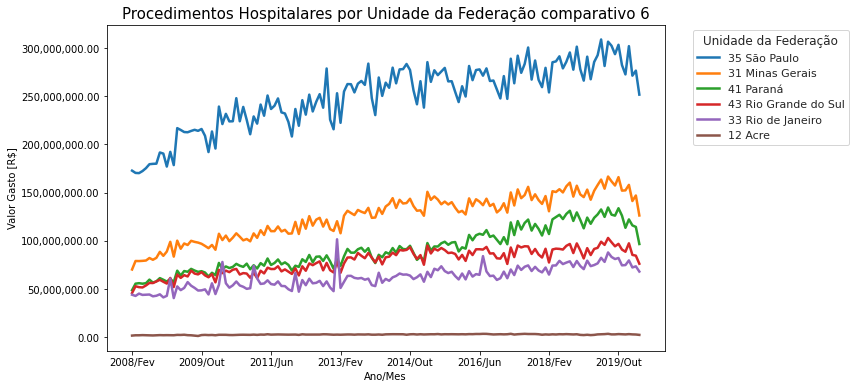

In [ ]:
# embelezar o grafico + Paletas

ax = ordenados_por_total[janela].loc[analise].T.plot(figsize = (10,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.title("Procedimentos Hospitalares por Unidade da Federação comparativo 6" ,fontsize = 15)
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")

## Paletes 
sns.color_palette("pastel")
#sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True)
#sns.color_palette("flare", as_cmap=True)
#sns.color_palette("Set2")
#sns.color_palette("husl", 9)
#sns.color_palette("deep")

## temas
#sns.set_theme(style="darkgrid")
#sns.set_theme(style="whitegrid")
sns.set_theme(style="ticks")
#sns.set_theme(style="white")
#sns.set_theme(style="dark")

plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

####Googlar surtos de dengue BR

http://observatoriodasauderj.com.br/30-anos-de-dengue-no-rio-de-janeiro-sua-epidemiologia/#:~:text=A%20Dengue%20no%20Munic%C3%ADpio%20do%20Rio%20de%20Janeiro&text=Dados%20da%20Secret%C3%A1ria%20de%20Sa%C3%BAde,n%C3%ADvel%20de%20transmiss%C3%A3o%20da%20dengue.



http://www.rio.rj.gov.br/dlstatic/10112/4536368/4115711/dengueconfirmados_mes2012.htm

.http://www.rio.rj.gov.br/dlstatic/10112/4536368/4115711/dengueconfirmados_mes2013.htm


http://g1.globo.com/rio-de-janeiro/noticia/2014/01/mortes-por-dengue-aumentaram-em-2013-no-estado-do-rj.html#:~:text=A%20epidemia%20de%20dengue%20no,mostrou%20O%20Bom%20Dia%20Rio.


https://info.dengue.mat.br/services/api

há uma aparente correlação entre os casos de dengue e os procedimentos hospitalares no Rio de Janeiro em janeiro de 2013


#### Plot sudeste e ver se afetou com um pico em 2010/2013

In [ ]:
sudeste = dfreg[dfreg["Região"]=="Sudeste"].index.tolist()

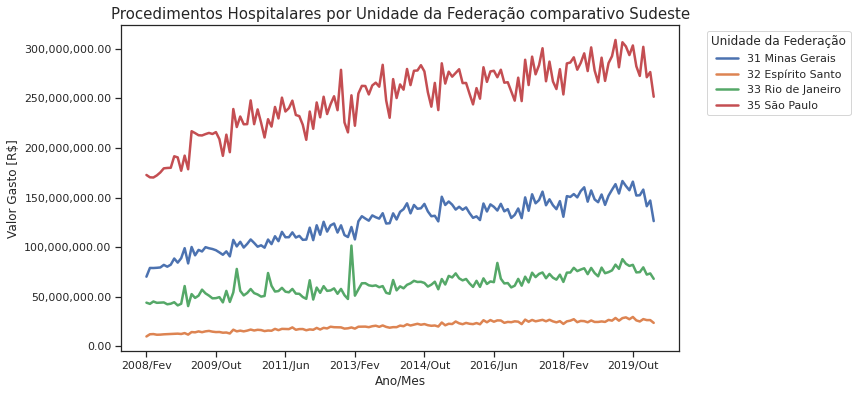

In [ ]:

ax = ordenados_por_total[janela].loc[sudeste].T.plot(figsize = (10,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.title("Procedimentos Hospitalares por Unidade da Federação comparativo Sudeste" ,fontsize = 15)
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")

sns.color_palette("pastel")
sns.set_theme(style="ticks")

plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

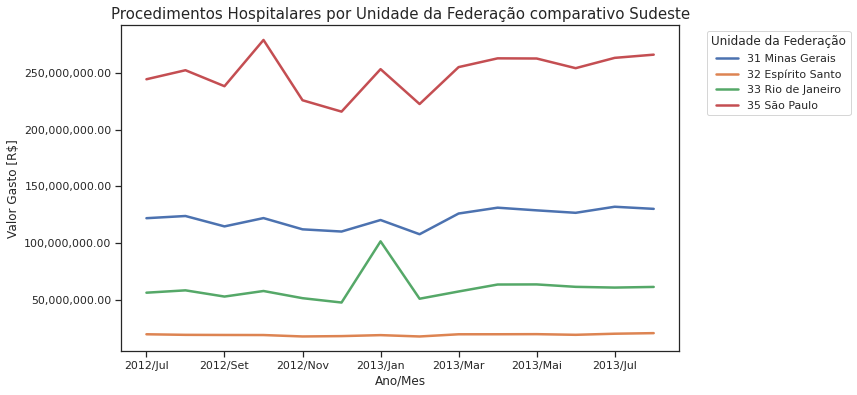

In [ ]:
janela2 = ordenados_por_total.columns[6+12*5:-12*7]

ax = ordenados_por_total[janela2].loc[sudeste].T.plot(figsize = (10,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.title("Procedimentos Hospitalares por Unidade da Federação comparativo Sudeste" ,fontsize = 15)
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")

sns.color_palette("pastel")
sns.set_theme(style="ticks")

plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

#### Plot sudeste vs seu Estado

In [ ]:
analise2 = sudeste[:]
analise2.append("43 Rio Grande do Sul")
analise2

['31 Minas Gerais',
 '32 Espírito Santo',
 '33 Rio de Janeiro',
 '35 São Paulo',
 '43 Rio Grande do Sul']

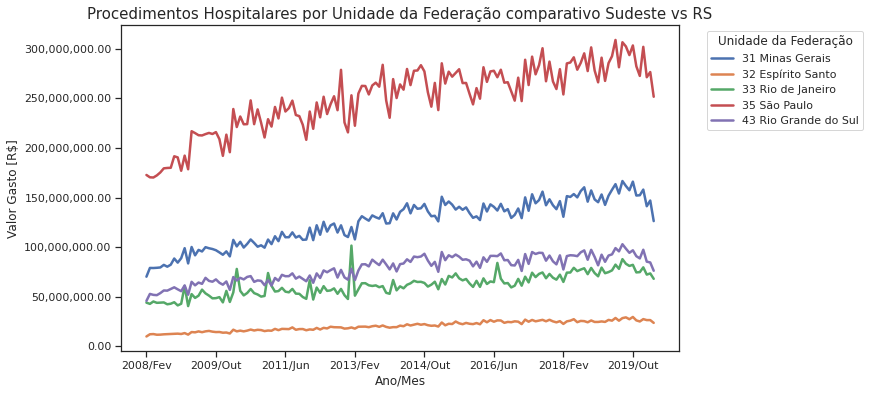

In [ ]:
ax = ordenados_por_total[janela].loc[analise2].T.plot(figsize = (10,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.title("Procedimentos Hospitalares por Unidade da Federação comparativo Sudeste vs RS" ,fontsize = 15)
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")

sns.color_palette("pastel")
sns.set_theme(style="ticks")

plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

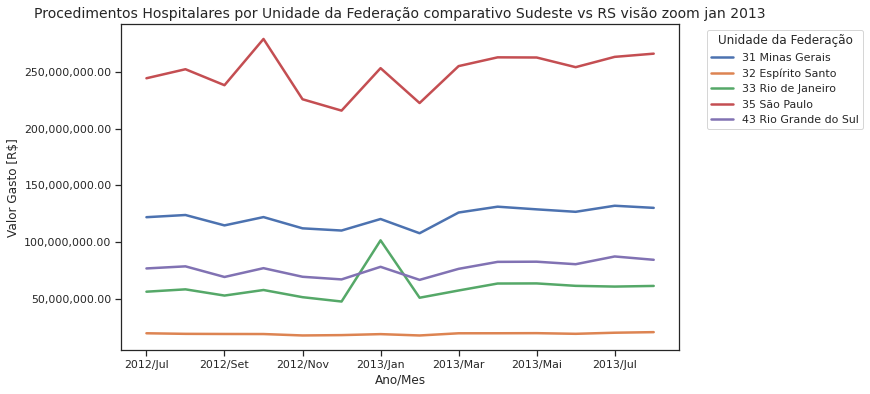

In [ ]:
ax = ordenados_por_total[janela2].loc[analise2].T.plot(figsize = (10,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.title("Procedimentos Hospitalares por Unidade da Federação comparativo Sudeste vs RS visão zoom jan 2013" ,fontsize = 14)
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")

sns.color_palette("pastel")
sns.set_theme(style="ticks")

plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

In [ ]:
#casos_dengue = dfdengue[["data","casos"]]
#casos_dengue["data"] = casos_dengue["data"].str[0:7]
#casos_dengue_mes = casos_dengue.groupby(["data"]).sum()


In [ ]:
#linhas = casos_dengue_mes.T.columns.tolist()

In [ ]:
#validas = linhas[1:]

In [ ]:
#casos_dengue_mes = casos_dengue_mes.loc[validas]

In [ ]:
#ax = casos_dengue_mes.plot(figsize=(10,6))
#plt.title("Casos de dengue no RIO", fontsize = 16)
#ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
#sns.set_theme(style="ticks")
#plt.show

In [ ]:
#casos_dengue = casos_dengue.set_index("mês")
#casos_dengue = casos_dengue.drop("data", axis=1)
#casos_dengue = casos_dengue.sum()

In [ ]:
#casos_dengue

###**M1A4.** Análise de gráficos e criação de hipótese

In [ ]:
janela3 = ordenados_por_total.columns[60:156] #jan12 a dez19
janela3

Index(['2012/Jan', '2012/Fev', '2012/Mar', '2012/Abr', '2012/Mai', '2012/Jun',
       '2012/Jul', '2012/Ago', '2012/Set', '2012/Out', '2012/Nov', '2012/Dez',
       '2013/Jan', '2013/Fev', '2013/Mar', '2013/Abr', '2013/Mai', '2013/Jun',
       '2013/Jul', '2013/Ago', '2013/Set', '2013/Out', '2013/Nov', '2013/Dez',
       '2014/Jan', '2014/Fev', '2014/Mar', '2014/Abr', '2014/Mai', '2014/Jun',
       '2014/Jul', '2014/Ago', '2014/Set', '2014/Out', '2014/Nov', '2014/Dez',
       '2015/Jan', '2015/Fev', '2015/Mar', '2015/Abr', '2015/Mai', '2015/Jun',
       '2015/Jul', '2015/Ago', '2015/Set', '2015/Out', '2015/Nov', '2015/Dez',
       '2016/Jan', '2016/Fev', '2016/Mar', '2016/Abr', '2016/Mai', '2016/Jun',
       '2016/Jul', '2016/Ago', '2016/Set', '2016/Out', '2016/Nov', '2016/Dez',
       '2017/Jan', '2017/Fev', '2017/Mar', '2017/Abr', '2017/Mai', '2017/Jun',
       '2017/Jul', '2017/Ago', '2017/Set', '2017/Out', '2017/Nov', '2017/Dez',
       '2018/Jan', '2018/Fev', '2018/Mar', '2018/Abr

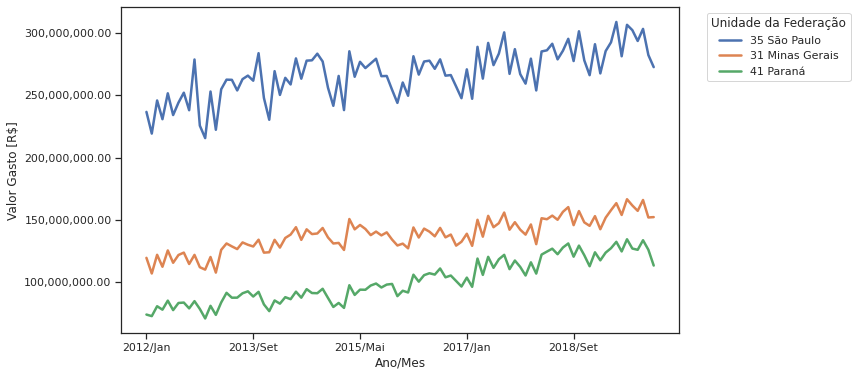

In [ ]:
ax = ordenados_por_total[janela3].head(3).T.plot(figsize = (10,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))

plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")

sns.color_palette("pastel")
sns.set_theme(style="ticks")

plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

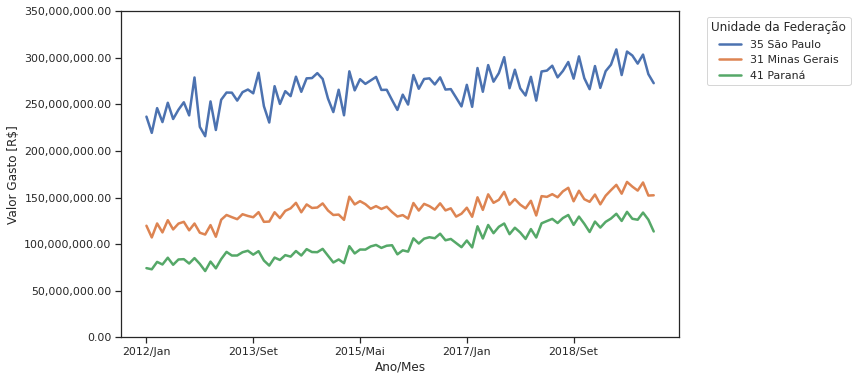

In [ ]:
ax = ordenados_por_total[janela3].head(3).T.plot(figsize = (10,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")

sns.color_palette("pastel")
sns.set_theme(style="ticks")
plt.ylim(0,350_000_000)
plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

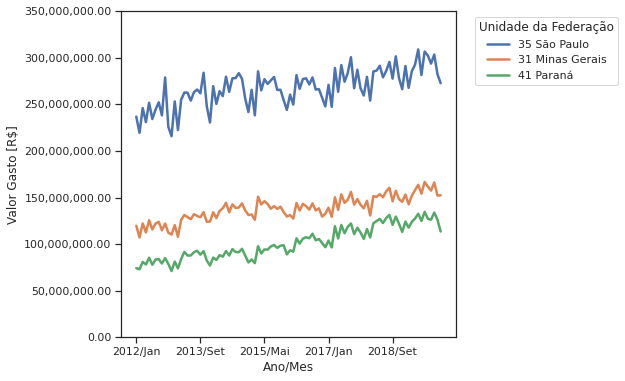

In [ ]:
ax = ordenados_por_total[janela3].head(3).T.plot(figsize = (6,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")

sns.color_palette("pastel")
sns.set_theme(style="ticks")
plt.ylim(0,350_000_000)
plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

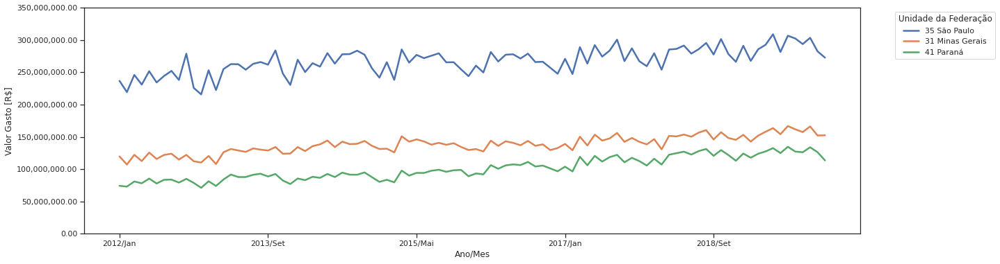

In [ ]:
ax = ordenados_por_total[janela3].head(3).T.plot(figsize = (20,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")

sns.color_palette("pastel")
sns.set_theme(style="ticks")
plt.ylim(0,350_000_000)
plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))

plt.show()

##### Desafios Aula 4

Desafio 01: Refaça as manipulações feitas em aulas e gaste um tempo analisando os dados e entendendo os efeitos das manipulações

Desafio 02: Reflita sobre os problemas na manipulação de dados e discuta esse assunto no Discord.

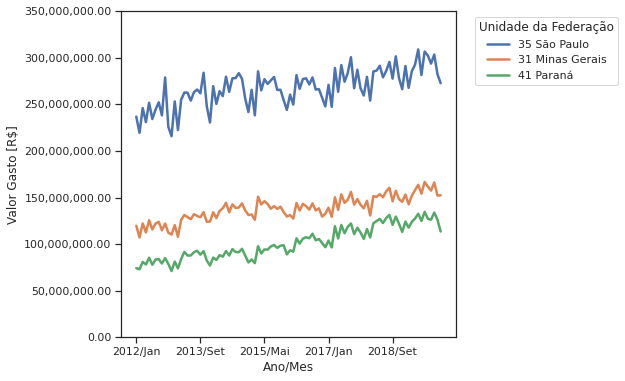

In [ ]:
ax = ordenados_por_total[janela3].head(3).T.plot(figsize = (6,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")
plt.ylim(0,350_000_000)
plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))
plt.show()

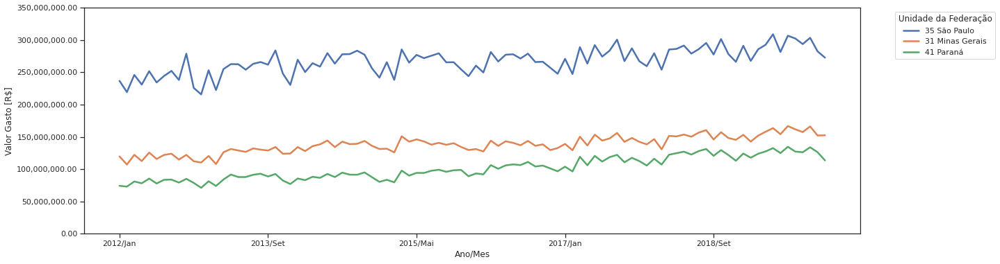

In [ ]:
ax = ordenados_por_total[janela3].head(3).T.plot(figsize = (20,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")
plt.ylim(0,350_000_000)
plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))
plt.show()

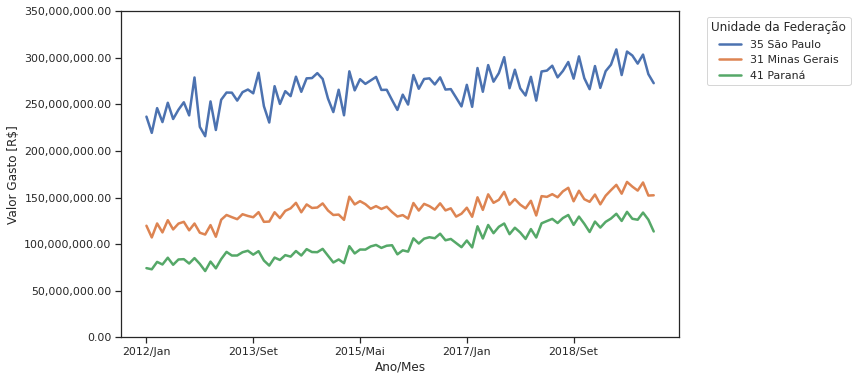

In [ ]:
ax = ordenados_por_total[janela3].head(3).T.plot(figsize = (10,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")
plt.ylim(0,350_000_000)
plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))
plt.show()

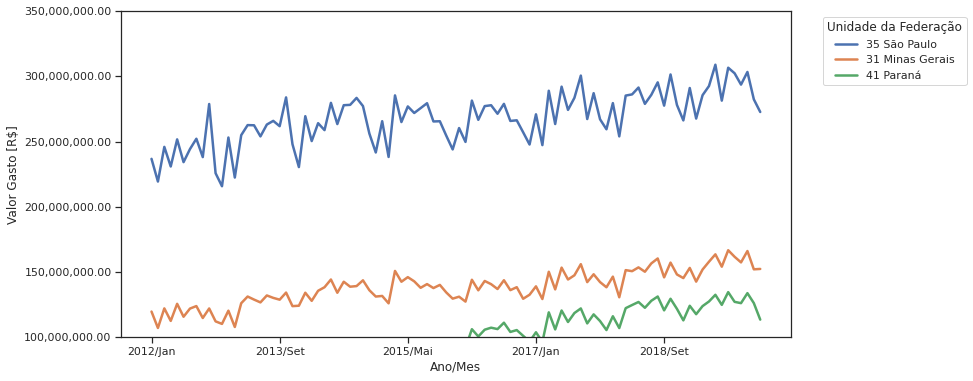

In [ ]:
ax = ordenados_por_total[janela3].head(3).T.plot(figsize = (12,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")
plt.ylim(100_000_000,350_000_000)
plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))
plt.show()

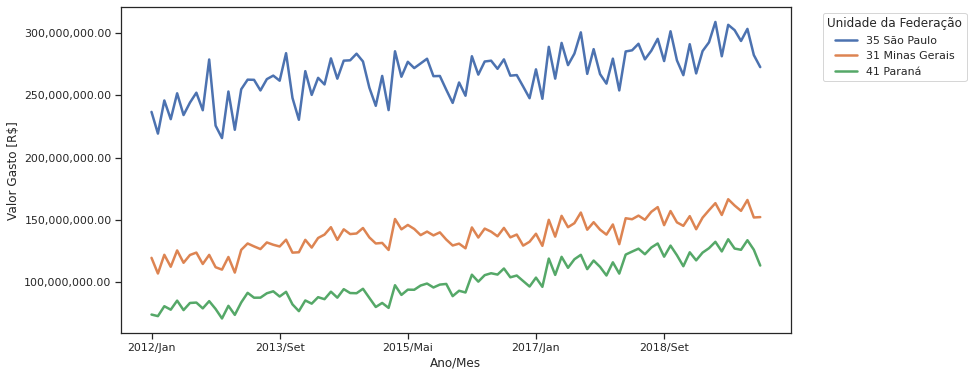

In [ ]:
ax = ordenados_por_total[janela3].head(3).T.plot(figsize = (12,6), linewidth = 2.5)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.xlabel("Ano/Mes")
plt.ylabel("Valor Gasto [R$]")
#plt.ylim(100_000_000,350_000_000)
plt.legend(loc='upper left', title='Unidade da Federação', bbox_to_anchor=(1.04, 1))
plt.show()

###**M1A5.** Manipulação e interpretação de gráficos

In [ ]:
mes_mais_recente = ordenados_por_total.columns[-2]

In [ ]:
gastos_do_mes_mais_recente = ordenados_por_total[mes_mais_recente]

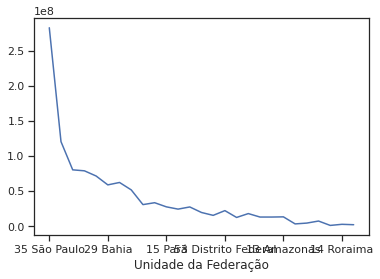

In [ ]:
gastos_do_mes_mais_recente.plot()

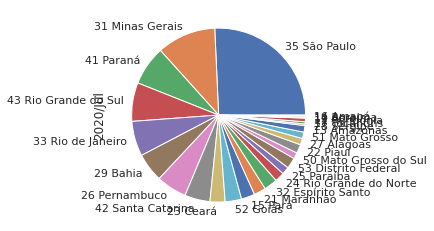

In [ ]:
gastos_do_mes_mais_recente.plot(kind='pie')

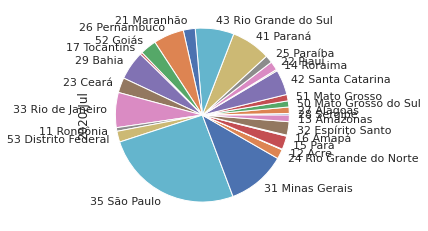

In [ ]:
gastos_do_mes_mais_recente.sample(frac=1).plot(kind='pie')

In [ ]:
gastos_do_mes_mais_recente

Unidade da Federação
35 São Paulo             282709570.31
31 Minas Gerais          120467187.34
41 Paraná                 80320852.69
43 Rio Grande do Sul      78929703.81
33 Rio de Janeiro         71540227.33
29 Bahia                  58898100.40
26 Pernambuco             62325444.34
42 Santa Catarina         51764534.76
23 Ceará                  30809221.22
52 Goiás                  33499284.38
15 Pará                   27618727.51
21 Maranhão               24374205.15
32 Espírito Santo         27460475.47
24 Rio Grande do Norte    19593057.45
25 Paraíba                15491469.06
53 Distrito Federal       22233542.26
50 Mato Grosso do Sul     12508717.35
22 Piauí                  18019214.49
27 Alagoas                13087850.40
51 Mato Grosso            13083151.70
13 Amazonas               13358514.02
28 Sergipe                 3312766.32
17 Tocantins               4489665.87
11 Rondônia                7407388.24
12 Acre                    1163813.08
14 Roraima                 27

In [ ]:
gastos_do_mes_mais_recente / gastos_do_mes_mais_recente["33 Rio de Janeiro"]

Unidade da Federação
35 São Paulo             3.95
31 Minas Gerais          1.68
41 Paraná                1.12
43 Rio Grande do Sul     1.10
33 Rio de Janeiro        1.00
29 Bahia                 0.82
26 Pernambuco            0.87
42 Santa Catarina        0.72
23 Ceará                 0.43
52 Goiás                 0.47
15 Pará                  0.39
21 Maranhão              0.34
32 Espírito Santo        0.38
24 Rio Grande do Norte   0.27
25 Paraíba               0.22
53 Distrito Federal      0.31
50 Mato Grosso do Sul    0.17
22 Piauí                 0.25
27 Alagoas               0.18
51 Mato Grosso           0.18
13 Amazonas              0.19
28 Sergipe               0.05
17 Tocantins             0.06
11 Rondônia              0.10
12 Acre                  0.02
14 Roraima               0.04
16 Amapá                 0.03
Name: 2020/Jul, dtype: float64

In [ ]:
(gastos_do_mes_mais_recente / gastos_do_mes_mais_recente["33 Rio de Janeiro"]).head(5)

Unidade da Federação
35 São Paulo           3.95
31 Minas Gerais        1.68
41 Paraná              1.12
43 Rio Grande do Sul   1.10
33 Rio de Janeiro      1.00
Name: 2020/Jul, dtype: float64

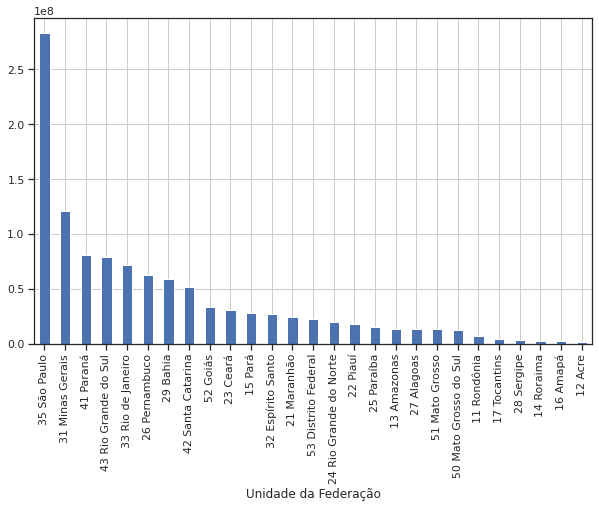

In [ ]:
gastos_do_mes_mais_recente = gastos_do_mes_mais_recente.sort_values(ascending=False)
gastos_do_mes_mais_recente.plot(kind = 'bar', grid = True, figsize = (10,6))

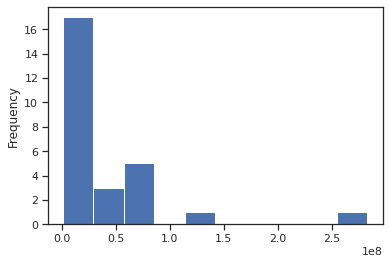

In [ ]:
gastos_do_mes_mais_recente.plot(kind='hist')

##### Desafios Aula 5 


###### Criar a tabela de comparação com o seu estado

In [ ]:
tabRSvsBR = gastos_do_mes_mais_recente / gastos_do_mes_mais_recente["43 Rio Grande do Sul"]
tabRSvsBR

Unidade da Federação
35 São Paulo             3.58
31 Minas Gerais          1.53
41 Paraná                1.02
43 Rio Grande do Sul     1.00
33 Rio de Janeiro        0.91
26 Pernambuco            0.79
29 Bahia                 0.75
42 Santa Catarina        0.66
52 Goiás                 0.42
23 Ceará                 0.39
15 Pará                  0.35
32 Espírito Santo        0.35
21 Maranhão              0.31
53 Distrito Federal      0.28
24 Rio Grande do Norte   0.25
22 Piauí                 0.23
25 Paraíba               0.20
13 Amazonas              0.17
27 Alagoas               0.17
51 Mato Grosso           0.17
50 Mato Grosso do Sul    0.16
11 Rondônia              0.09
17 Tocantins             0.06
28 Sergipe               0.04
14 Roraima               0.03
16 Amapá                 0.03
12 Acre                  0.01
Name: 2020/Jul, dtype: float64

###### Documentação do Matplotlib e pandas para colocar grid no gráfico

https://pandas.pydata.org/pandas-docs/version/0.18/generated/pandas.DataFrame.plot.html

https://matplotlib.org/gallery/axes_grid1/demo_axes_grid.html?highlight=grid


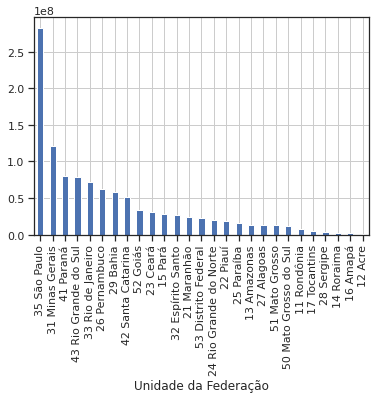

In [ ]:
gastos_do_mes_mais_recente.plot(kind='bar', grid = True)

###### Gráfico de barras em relação ao seu estado

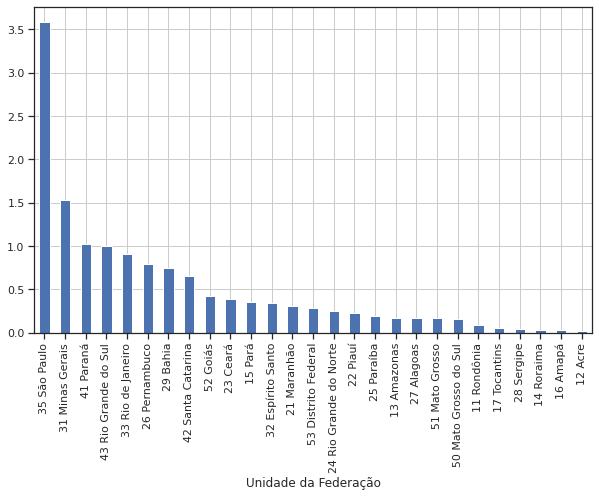

In [ ]:
tabRSvsBR.plot(kind = 'bar', grid = True, figsize = (10,6))

###### Normalizar gastos por população 
comparar dois estados 

In [ ]:
dfpop["V"].head()

0        Valor
1    183987291
2     14623316
3      1453756
4       655385
Name: V, dtype: object

In [ ]:
dfpop.columns

Index(['NC', 'NN', 'D1C', 'D1N', 'D2C', 'D2N', 'D3C', 'D3N', 'MC', 'MN', 'V'], dtype='object')

In [ ]:
dfpop["UF"] = dfpop["D1C"]+" "+dfpop["D1N"]

In [ ]:
dfp = dfpop[["UF","V"]]

In [ ]:
dfp = dfp.drop([0,1,2,10,20,25,29])

In [ ]:
dfp = dfp.set_index("UF")

In [ ]:
dfp.head()

,V
UF,
11 Rondônia,1453756
12 Acre,655385
13 Amazonas,3221939
14 Roraima,395725
15 Pará,7065573


In [ ]:
dfp.loc["12 Acre"]

V    655385
Name: 12 Acre, dtype: object

In [ ]:
gastos_do_mes_mais_recente["12 Acre"]

1163813.08

In [ ]:
pop = 0
gasto = 0
n_gasto = 0
mes_r_norm = gastos_do_mes_mais_recente[:]
for x in dfp.index:
    pop = int(dfp.loc[x])
    gasto = gastos_do_mes_mais_recente[x]
    n_gasto = gasto/pop
    mes_r_norm[x] = n_gasto


In [ ]:
mes_r_norm

Unidade da Federação
35 São Paulo             7.10
31 Minas Gerais          6.25
41 Paraná                7.81
43 Rio Grande do Sul     7.46
33 Rio de Janeiro        4.64
26 Pernambuco            7.35
29 Bahia                 4.18
42 Santa Catarina        8.82
52 Goiás                 5.93
23 Ceará                 3.76
15 Pará                  3.91
32 Espírito Santo        8.19
21 Maranhão              3.98
53 Distrito Federal      9.05
24 Rio Grande do Norte   6.50
22 Piauí                 5.94
25 Paraíba               4.25
13 Amazonas              4.15
27 Alagoas               4.31
51 Mato Grosso           4.58
50 Mato Grosso do Sul    5.52
11 Rondônia              5.10
17 Tocantins             3.61
28 Sergipe               1.71
14 Roraima               6.92
16 Amapá                 3.67
12 Acre                  1.78
Name: 2020/Jul, dtype: float64

In [ ]:
mes_r_norm = mes_r_norm.sort_values(ascending=False)

In [ ]:
mes_r_norm

Unidade da Federação
53 Distrito Federal      9.05
42 Santa Catarina        8.82
32 Espírito Santo        8.19
41 Paraná                7.81
43 Rio Grande do Sul     7.46
26 Pernambuco            7.35
35 São Paulo             7.10
14 Roraima               6.92
24 Rio Grande do Norte   6.50
31 Minas Gerais          6.25
22 Piauí                 5.94
52 Goiás                 5.93
50 Mato Grosso do Sul    5.52
11 Rondônia              5.10
33 Rio de Janeiro        4.64
51 Mato Grosso           4.58
27 Alagoas               4.31
25 Paraíba               4.25
29 Bahia                 4.18
13 Amazonas              4.15
21 Maranhão              3.98
15 Pará                  3.91
23 Ceará                 3.76
16 Amapá                 3.67
17 Tocantins             3.61
12 Acre                  1.78
28 Sergipe               1.71
Name: 2020/Jul, dtype: float64

<function matplotlib.pyplot.show>

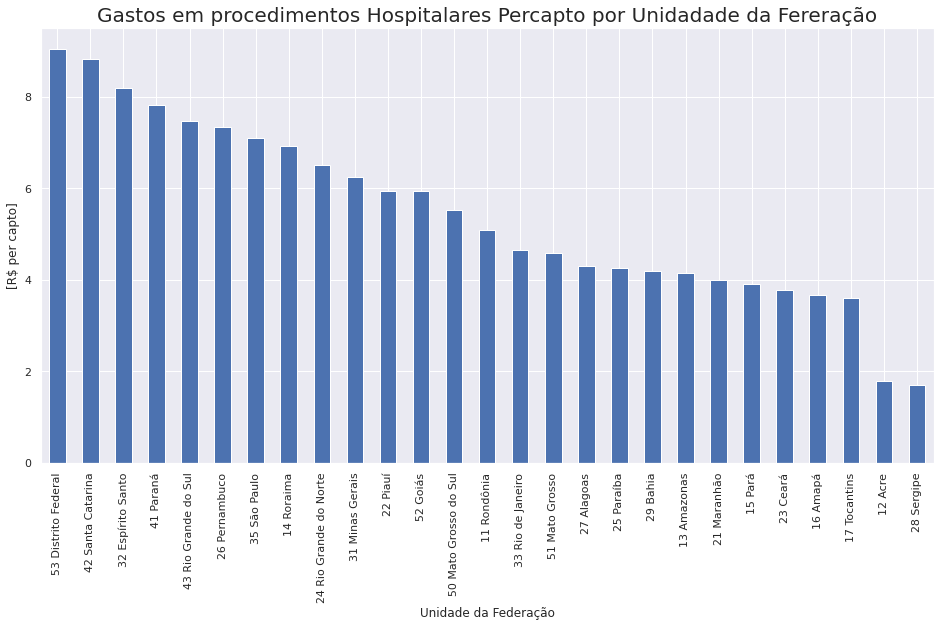

In [ ]:
sns.set()
sns.set_style("darkgrid")
ax = mes_r_norm.plot(kind='bar',figsize = (16,8))
plt.title("Gastos em procedimentos Hospitalares Percapto por Unidadade da Fereração", fontsize = 20)
plt.ylabel("[R$ per capto]")
plt.show

###### Explore e levante hipóteses e perguntas

Estados com maior renda percapta também tem os maiores gastos percáptos ? 



### **{PENDENTE}** Super Desafio escolha outro valor (fora do valor) do TABINET e explore

## M2: Visualização de dados com Seaborn e Matplotlib

###M2A1. Fontes externas, limpesa e manipulação de dados

####M2A1_1. Fontes externas, limpeza e manipulação de dados Ver primeiro vídeo



In [ ]:
gastos_do_mes_mais_recente.sum()

146.48262998630102

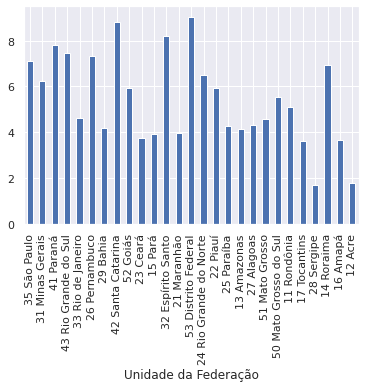

In [ ]:
gastos_do_mes_mais_recente.plot(kind = 'bar')

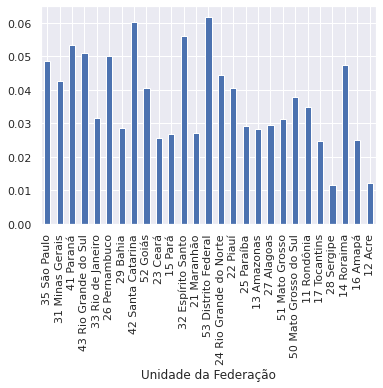

In [ ]:
gastos_proporcionais = gastos_do_mes_mais_recente/gastos_do_mes_mais_recente.sum()
gastos_proporcionais.plot(kind='bar')


In [ ]:
# df2_melted.rename(columns = {'variable': 'Year', 'value': 'Income'}, inplace = False)
df_dados_pop = df_dados_pop.rename(columns={'Unidade federativa':'uf','População':'populacao'},inplace = False)


In [ ]:
df_dados_pop.head()

,Posição,uf,populacao,% da pop. total,País comparável
0,(habitantes),NaN,NaN,NaN,NaN
1,1,São Paulo,46 289 333,"21,9%",Flag of Spain.svg Espanha (46 439 864)
2,2,Minas Gerais,21 292 666,"10,1%",Sri Lanka (20 675 000)
3,3,Rio de Janeiro,17 366 189,"8,2%",Países Baixos (16 922 900)
4,4,Bahia Bahia,14 930 634,"7,1%",Chade (14 037 000)


In [ ]:
df_dados_pop = df_dados_pop[['populacao','uf']]

In [ ]:
df_dados_pop.head()

,populacao,uf
0,NaN,NaN
1,46 289 333,São Paulo
2,21 292 666,Minas Gerais
3,17 366 189,Rio de Janeiro
4,14 930 634,Bahia Bahia


In [ ]:
df_dados_pop = df_dados_pop.dropna()

In [ ]:
df_dados_pop['populacao'] = df_dados_pop['populacao'].str.replace(" ","").astype(int)
df_dados_pop.head()

,populacao,uf
1,46289333,São Paulo
2,21292666,Minas Gerais
3,17366189,Rio de Janeiro
4,14930634,Bahia Bahia
5,11516840,Paraná


In [ ]:
df_dados_pop = df_dados_pop[['populacao','uf']].set_index('uf')


In [ ]:
df_dados_pop.head()

,populacao
uf,
São Paulo,46289333
Minas Gerais,21292666
Rio de Janeiro,17366189
Bahia Bahia,14930634
Paraná,11516840


####M2A1_2. Manipulação e junção de tabelas

In [ ]:
gastos_do_mes_mais_recente = ordenados_por_total[mes_mais_recente]

In [ ]:
gastos_do_mes_mais_recente.head()

Unidade da Federação
35 São Paulo           282709570.31
31 Minas Gerais        120467187.34
41 Paraná               80320852.69
43 Rio Grande do Sul    78929703.81
33 Rio de Janeiro       71540227.33
Name: 2020/Jul, dtype: float64

In [ ]:
populacao.head()

,Posição,Unidade federativa,População,% da pop. total,País comparável
0,(habitantes),NaN,NaN,NaN,NaN
1,1,São Paulo,46 289 333,"21,9%",Flag of Spain.svg Espanha (46 439 864)
2,2,Minas Gerais,21 292 666,"10,1%",Sri Lanka (20 675 000)
3,3,Rio de Janeiro,17 366 189,"8,2%",Países Baixos (16 922 900)
4,4,Bahia Bahia,14 930 634,"7,1%",Chade (14 037 000)


In [ ]:
gastos_do_mes_mais_recente.index = gastos_do_mes_mais_recente.index.str[3:]
gastos_do_mes_mais_recente.head()

Unidade da Federação
São Paulo           282709570.31
Minas Gerais        120467187.34
Paraná               80320852.69
Rio Grande do Sul    78929703.81
Rio de Janeiro       71540227.33
Name: 2020/Jul, dtype: float64

In [ ]:
populacao = populacao.dropna()
populacao['uf'] = populacao['Unidade federativa'] 
populacao['populacao'] = populacao['População'] 
populacao['populacao'] = populacao['populacao'].str.replace(" ","")
populacao['populacao'] = populacao['populacao'].astype(int)
populacao = populacao[['uf','populacao']]
populacao = populacao.set_index('uf')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [ ]:
gastos_do_mes_mais_recente.index = gastos_do_mes_mais_recente.index.str.strip()
populacao.index = populacao.index.str.strip()

In [ ]:
populacao.head()

,populacao
uf,
São Paulo,46289333
Minas Gerais,21292666
Rio de Janeiro,17366189
Bahia Bahia,14930634
Paraná,11516840


In [ ]:
populacao.join(gastos_do_mes_mais_recente)

,populacao,2020/Jul
uf,,
São Paulo,46289333,282709570.31
Minas Gerais,21292666,120467187.34
Rio de Janeiro,17366189,71540227.33
Bahia Bahia,14930634,nan
Paraná,11516840,80320852.69
Rio Grande do Sul,11422973,78929703.81
Pernambuco,9616621,62325444.34
Ceará,9187103,30809221.22
Pará Pará,8690745,nan


In [ ]:
#Correção do estado com nome duplo: 

for estado in gastos_do_mes_mais_recente.index:
    #print(f"{estado} {estado}")
    populacao.index = populacao.index.str.replace(f"{estado} {estado}",estado)
populacao.index 

Index(['São Paulo', 'Minas Gerais', 'Rio de Janeiro', 'Bahia', 'Paraná',
       'Rio Grande do Sul', 'Pernambuco', 'Ceará', 'Pará', 'Santa Catarina',
       'Maranhão', 'Goiás', 'Amazonas', 'Espírito Santo', 'Paraíba',
       'Rio Grande do Norte', 'Mato Grosso', 'Alagoas', 'Piauí',
       'Distrito Federal', 'Mato Grosso do Sul', 'Sergipe', 'Rondônia',
       'Tocantins', 'Acre', 'Amapá', 'Roraima'],
      dtype='object', name='uf')

In [ ]:
gastos_e_populacao_recente = populacao.join(gastos_do_mes_mais_recente)
gastos_e_populacao_recente.head()

,populacao,2020/Jul
uf,,
São Paulo,46289333,282709570.31
Minas Gerais,21292666,120467187.34
Rio de Janeiro,17366189,71540227.33
Bahia,14930634,58898100.40
Paraná,11516840,80320852.69


#### M2A1D0. Desafios

####M2A1D1. Desafio 01 
Entre nos dados do wikipedia e Leia a Base de dados direto do wikipedia.

In [ ]:
urlpop = "https://pt.wikipedia.org/wiki/Lista_de_unidades_federativas_do_Brasil_por_popula%C3%A7%C3%A3o"
popwiki=pd.read_html(urlpop)[0]
popwiki.head()

,Posição,Unidade federativa,População,% da pop. total,País comparável (habitantes)
0,1,São Paulo,46 289 333,"21,9%",Espanha (46 439 864)
1,2,Minas Gerais,21 292 666,"10,1%",Sri Lanka (20 675 000)
2,3,Rio de Janeiro,17 366 189,"8,2%",Países Baixos (16 922 900)
3,4,Bahia,14 930 634,"7,1%",Chade (14 037 000)
4,5,Paraná,11 516 840,"5,4%",Bolívia (11 410 651)


####M2A1D2. Desafio 02 
Neste desafio temos uma série de passos:

>Padronizar os nomes das colunas

>Transformar os dados nos tipos corretos

>Transformar a UF em index

In [ ]:
df_dados_popD=pd.read_html(urlpop)[0]

In [ ]:
df_dados_popD = df_dados_popD.dropna()
df_dados_popD = df_dados_popD.rename(columns={'Unidade federativa':'uf','População':'populacao'},inplace = False)
df_dados_popD = df_dados_popD[['uf','populacao']]
df_dados_popD['populacao'] = df_dados_popD['populacao'].str.replace(" ","").astype(int)
df_dados_popD.set_index('uf')

df_dados_popD

,uf,populacao
0,São Paulo,46289333
1,Minas Gerais,21292666
2,Rio de Janeiro,17366189
3,Bahia,14930634
4,Paraná,11516840
5,Rio Grande do Sul,11422973
6,Pernambuco,9616621
7,Ceará,9187103
8,Pará,8690745
9,Santa Catarina,7252502


####M2A1D3. Desafio 03

Buscar na documentação alguns métodos envolvendo strings


https://pandas.pydata.org/pandas-docs/stable/user_guide/text.html

####M2A1D4. Desafio 04 
Desenvolver uma função para a limpeza e tratamento dos dados, retornando duas tabelas "população" e "unida".

In [ ]:
del dfpop

In [ ]:
def f_join_populacao_por_uf(df):
    urlpop = "https://pt.wikipedia.org/wiki/Lista_de_unidades_federativas_do_Brasil_por_popula%C3%A7%C3%A3o"
    dfpop = pd.read_html(urlpop)[0]
    dfpop = dfpop.rename(columns={'Unidade federativa':'uf','População':'populacao'},inplace = False)
    dfpop = dfpop[['uf','populacao']]
    dfpop['populacao'] = dfpop['populacao'].str.replace(" ","").astype(int)
    dfpop = dfpop.set_index('uf')
    df.index = df.index.str.strip()
    dfpop.index = dfpop.index.str.strip()
    out = dfpop.join(df)
    return out

In [ ]:
f_join_populacao_por_uf(gastos_do_mes_mais_recente)

,populacao,2020/Jul
uf,,
São Paulo,46289333,282709570.31
Minas Gerais,21292666,120467187.34
Rio de Janeiro,17366189,71540227.33
Bahia,14930634,58898100.40
Paraná,11516840,80320852.69
Rio Grande do Sul,11422973,78929703.81
Pernambuco,9616621,62325444.34
Ceará,9187103,30809221.22
Pará,8690745,27618727.51


###M2A2. Proporcionalidades e Seaborn

####M2A2_1. Visualização, Seaborn e Proporcionalidades

https://bootcamps.alura.com.br/course/bootcamp-datascience-modulo2/task/73899

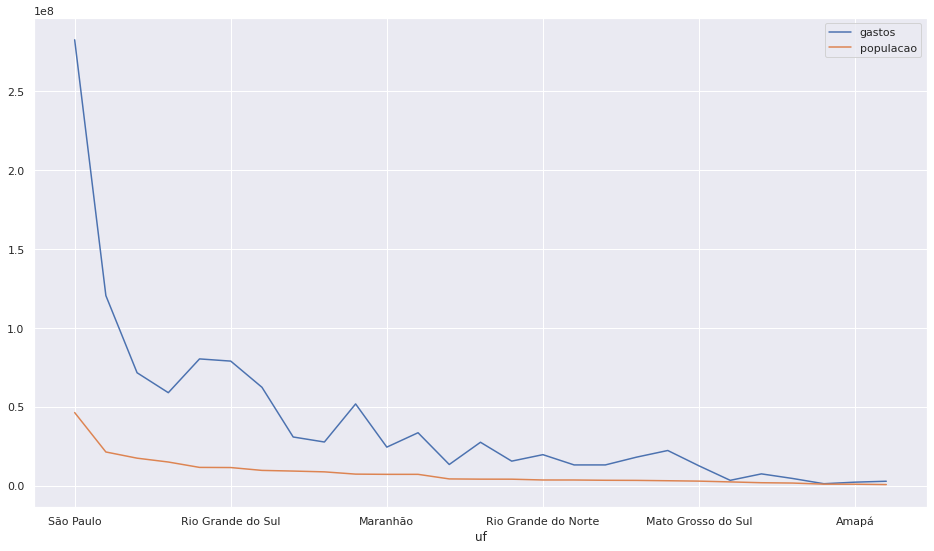

In [ ]:
gastos_e_populacao_recente["gastos"] = gastos_e_populacao_recente["2020/Jul"]  
gastos_e_populacao_recente[["gastos","populacao"]].plot(figsize = (16,9))

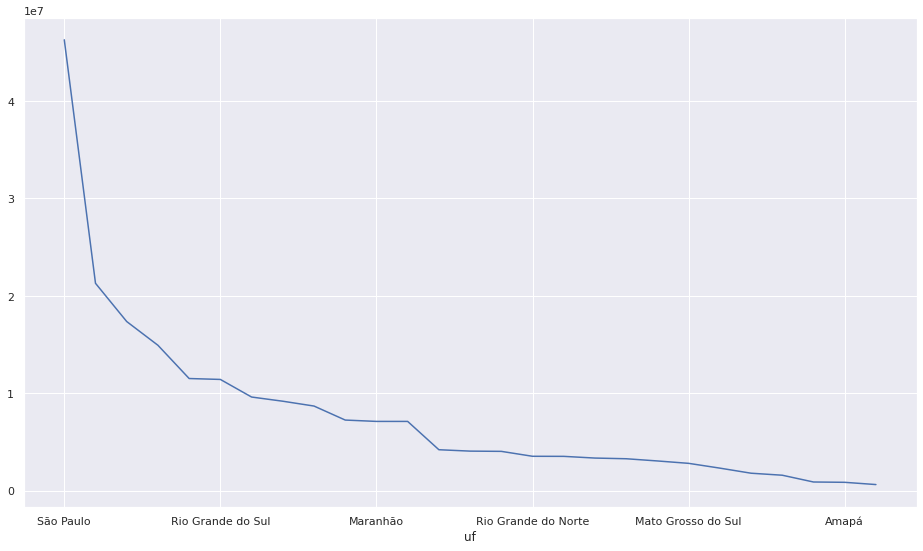

In [ ]:
gastos_e_populacao_recente['populacao'].plot(figsize = (16,9))

In [ ]:
gastos_e_populacao_recente.loc[['Rio Grande do Sul', 'São Paulo']]

,populacao,2020/Jul,gastos
uf,,,
Rio Grande do Sul,11422973,78929703.81,78929703.81
São Paulo,46289333,282709570.31,282709570.31


In [ ]:
gastos_e_populacao_recente['gastos_por_habitante'] = gastos_e_populacao_recente['gastos']/gastos_e_populacao_recente['populacao']

In [ ]:
gastos_e_populacao_recente.head()

,populacao,2020/Jul,gastos,gastos_por_habitante
uf,,,,
São Paulo,46289333,282709570.31,282709570.31,6.11
Minas Gerais,21292666,120467187.34,120467187.34,5.66
Rio de Janeiro,17366189,71540227.33,71540227.33,4.12
Bahia,14930634,58898100.40,58898100.40,3.94
Paraná,11516840,80320852.69,80320852.69,6.97


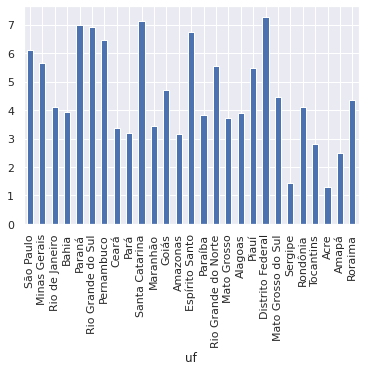

In [ ]:
gastos_e_populacao_recente['gastos_por_habitante'].plot(kind='bar')

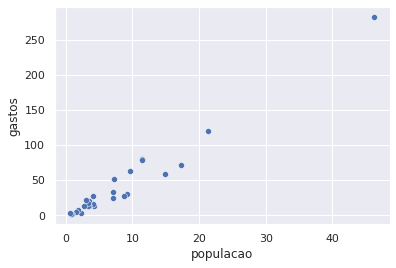

In [ ]:
sns.scatterplot(data=gastos_e_populacao_recente/1000_000,x='populacao', y='gastos')

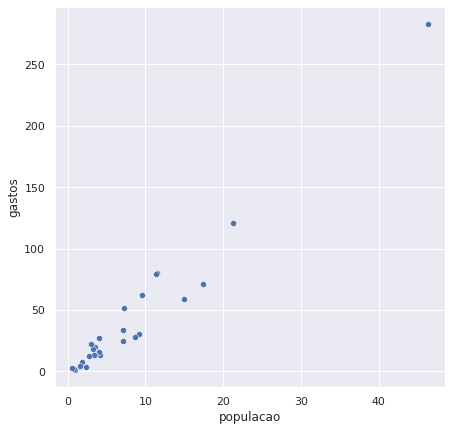

In [ ]:
plt.figure(figsize = (7,7))
sns.scatterplot(data=gastos_e_populacao_recente/1000_000,x='populacao', y='gastos')

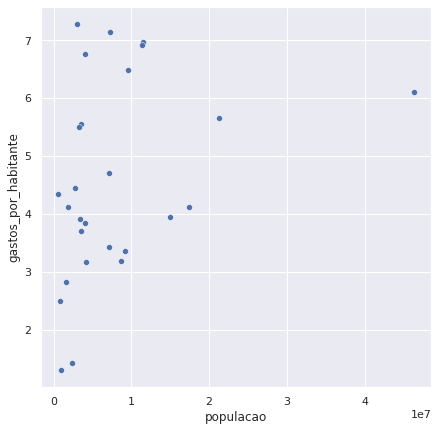

In [ ]:
plt.figure(figsize = (7,7))
sns.scatterplot(data=gastos_e_populacao_recente,x='populacao', y='gastos_por_habitante')

####M2A2D0. Desafios

####M2A2D1. Desafio 01

Ordenar o gráfico e criar uma visualização de gastos por habitantes ordenada.


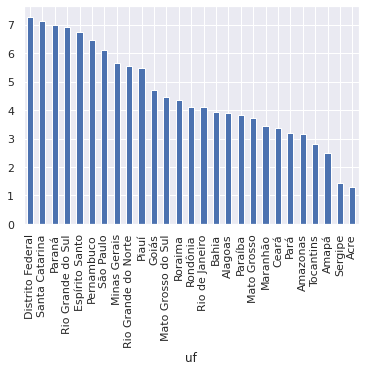

In [ ]:
gastos_e_populacao_recente.sort_values("gastos_por_habitante", ascending=False)['gastos_por_habitante'].plot(kind = 'bar')

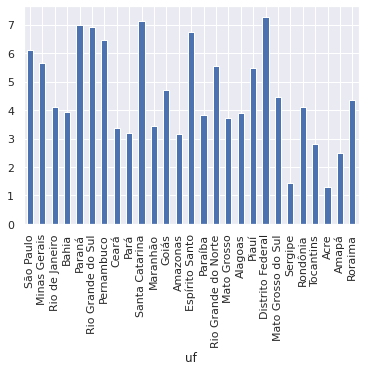

In [ ]:
gastos_e_populacao_recente.sort_values("populacao", ascending=False)['gastos_por_habitante'].plot(kind = 'bar')

####M2A2D2. Desafio 02 

(Super Desafio Gui): Fazer os mesmos gráficos do final da aulas 2.1 para meses anteriores, analisar e compartilhar suas hipóteses.


In [ ]:
mes_selecionado = ordenados_por_total.columns[-4]
gastos_do_mes_selecionado = ordenados_por_total[mes_selecionado].copy()
gastos_do_mes_selecionado.index = gastos_do_mes_selecionado.index.str[3:]
gastos_do_mes_selecionado.index = gastos_do_mes_selecionado.index.str.strip()
gastos_do_mes_selecionado.head()

Unidade da Federação
São Paulo           302857660.98
Minas Gerais        136867275.75
Paraná              106103737.62
Rio Grande do Sul    86076113.42
Rio de Janeiro       86281033.16
Name: 2020/Mai, dtype: float64

In [ ]:
gastos_e_populacao_selecionado = f_join_populacao_por_uf(gastos_do_mes_selecionado)
gastos_e_populacao_selecionado.head()

,populacao,2020/Mai
uf,,
São Paulo,46289333,302857660.98
Minas Gerais,21292666,136867275.75
Rio de Janeiro,17366189,86281033.16
Bahia,14930634,61756775.71
Paraná,11516840,106103737.62


In [ ]:
gastos_e_populacao_selecionado['gastos_por_habitante'] = gastos_e_populacao_selecionado[mes_selecionado]/gastos_e_populacao_selecionado['populacao']
gastos_e_populacao_selecionado['gastos']= gastos_e_populacao_selecionado[mes_selecionado]
gastos_e_populacao_selecionado.head()

,populacao,2020/Mai,gastos_por_habitante,gastos
uf,,,,
São Paulo,46289333,302857660.98,6.54,302857660.98
Minas Gerais,21292666,136867275.75,6.43,136867275.75
Rio de Janeiro,17366189,86281033.16,4.97,86281033.16
Bahia,14930634,61756775.71,4.14,61756775.71
Paraná,11516840,106103737.62,9.21,106103737.62


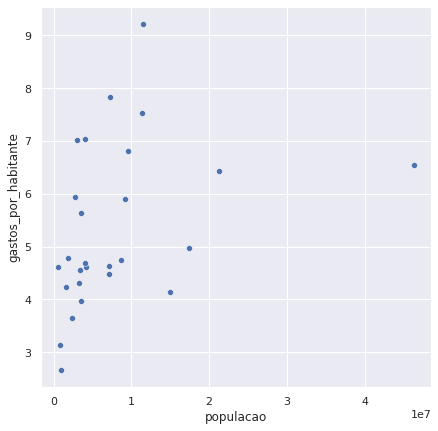

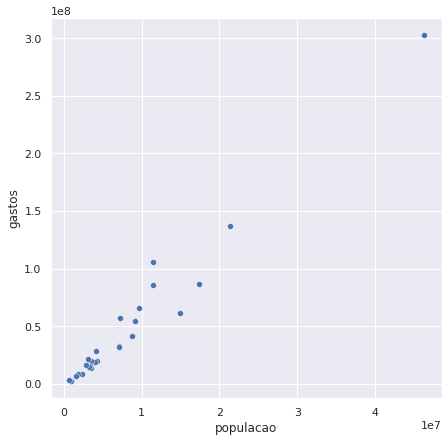

In [ ]:
plt.figure(figsize = (7,7))
sns.scatterplot(data=gastos_e_populacao_selecionado,x='populacao', y='gastos_por_habitante')
plt.show()
plt.figure(figsize = (7,7))
sns.scatterplot(data=gastos_e_populacao_selecionado,x='populacao', y='gastos')
plt.show()


####M2A2D3. Desafio 03 

(Super Desafio Thiago): Plotar no mesmos gráficos do final da aula o mês anterior e o mês correte, analisar e compartilhar suas hipóteses.

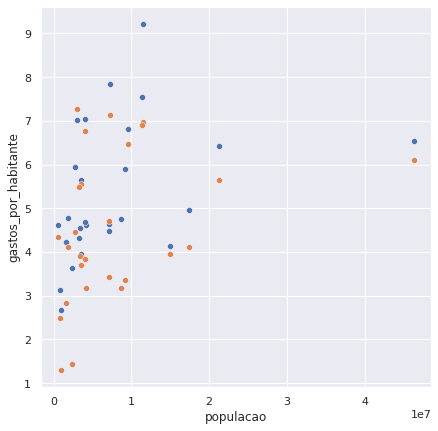

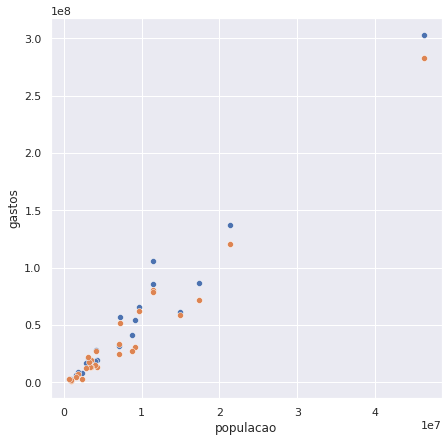

In [ ]:
plt.figure(figsize = (7,7))
sns.scatterplot(data=gastos_e_populacao_selecionado,x='populacao', y='gastos_por_habitante')
sns.scatterplot(data=gastos_e_populacao_recente,x='populacao', y='gastos_por_habitante')
plt.show()

plt.figure(figsize = (7,7))
sns.scatterplot(data=gastos_e_populacao_selecionado,x='populacao', y='gastos')
sns.scatterplot(data=gastos_e_populacao_recente,x='populacao', y='gastos')
plt.show()

####M2A2D4. Desafio 04 

 Analise os gráficos e tente chegar a hipóteses que explicam o que você está entendendo dos dados. Lembre-se que a conclusão é uma hipótese. E que esses dados serão alterados.

In [ ]:
ordenados_por_total.columns

Index(['2007/Jan', '2007/Fev', '2007/Mar', '2007/Abr', '2007/Mai', '2007/Jun',
       '2007/Jul', '2007/Ago', '2007/Set', '2007/Out',
       ...
       '2019/Nov', '2019/Dez', '2020/Jan', '2020/Fev', '2020/Mar', '2020/Abr',
       '2020/Mai', '2020/Jun', '2020/Jul', '2020/Ago'],
      dtype='object', length=164)

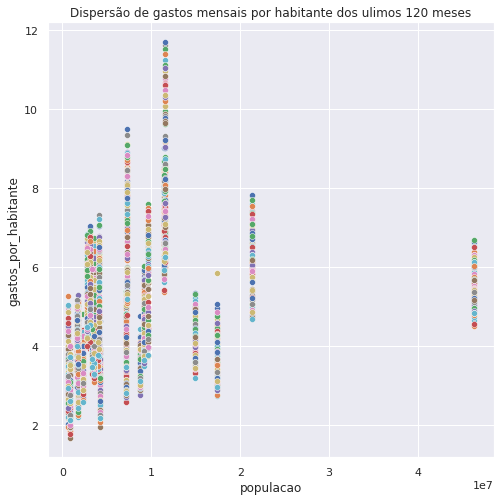

In [ ]:
plt.figure(figsize = (8,8))
for i in range(-4,-124,-1):
    mes_selecionado = ordenados_por_total.columns[i]
    gastos_do_mes_selecionado = ordenados_por_total[mes_selecionado].copy()
    gastos_do_mes_selecionado.index = gastos_do_mes_selecionado.index.str[3:]
    gastos_do_mes_selecionado.index = gastos_do_mes_selecionado.index.str.strip()
    gastos_e_populacao_selecionado = f_join_populacao_por_uf(gastos_do_mes_selecionado)
    gastos_e_populacao_selecionado['gastos_por_habitante'] = gastos_e_populacao_selecionado[mes_selecionado]/gastos_e_populacao_selecionado['populacao']
    gastos_e_populacao_selecionado['gastos']= gastos_e_populacao_selecionado[mes_selecionado]
    sns.scatterplot(data=gastos_e_populacao_selecionado,x='populacao', y='gastos_por_habitante')
plt.title("Dispersão de gastos mensais por habitante dos ulimos 120 meses")     
plt.show()



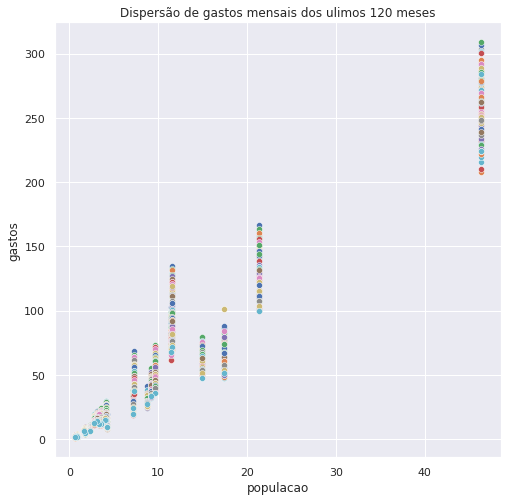

In [ ]:
plt.figure(figsize = (8,8))
for i in range(-4,-124,-1):
    mes_selecionado = ordenados_por_total.columns[i]
    gastos_do_mes_selecionado = ordenados_por_total[mes_selecionado].copy()
    gastos_do_mes_selecionado.index = gastos_do_mes_selecionado.index.str[3:]
    gastos_do_mes_selecionado.index = gastos_do_mes_selecionado.index.str.strip()
    gastos_e_populacao_selecionado = f_join_populacao_por_uf(gastos_do_mes_selecionado)
    gastos_e_populacao_selecionado['gastos_por_habitante'] = gastos_e_populacao_selecionado[mes_selecionado]/gastos_e_populacao_selecionado['populacao']
    gastos_e_populacao_selecionado['gastos']= gastos_e_populacao_selecionado[mes_selecionado]
    sns.scatterplot(data=gastos_e_populacao_selecionado/1_000_000,x='populacao', y='gastos')
plt.title("Dispersão de gastos mensais dos ulimos 120 meses")     
plt.show()


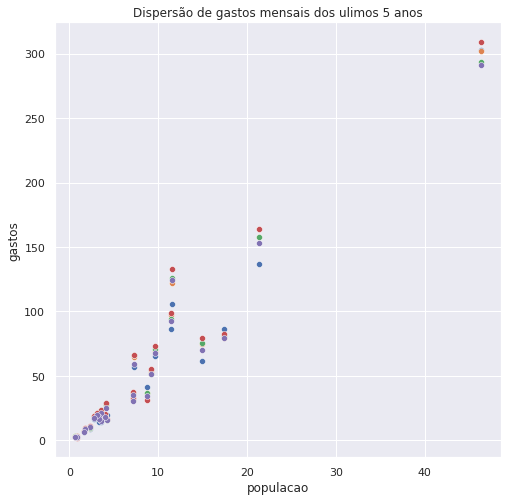

In [ ]:
plt.figure(figsize = (8,8))
for i in range(1,6):
    mes_selecionado = ordenados_por_total.columns[i*-4]
    gastos_do_mes_selecionado = ordenados_por_total[mes_selecionado].copy()
    gastos_do_mes_selecionado.index = gastos_do_mes_selecionado.index.str[3:]
    gastos_do_mes_selecionado.index = gastos_do_mes_selecionado.index.str.strip()
    gastos_e_populacao_selecionado = f_join_populacao_por_uf(gastos_do_mes_selecionado)
    gastos_e_populacao_selecionado['gastos_por_habitante'] = gastos_e_populacao_selecionado[mes_selecionado]/gastos_e_populacao_selecionado['populacao']
    gastos_e_populacao_selecionado['gastos']= gastos_e_populacao_selecionado[mes_selecionado]
    sns.scatterplot(data=gastos_e_populacao_selecionado/1_000_000,x='populacao', y='gastos')
plt.title("Dispersão de gastos mensais dos ulimos 5 anos") 
plt.show()

##### Conclusões

Como estamos comparanco com a população estimada ATUAL, parece estar ocorrendo uma expanção vegetativa dos gastos ao longo do tempo e aparentemente se comparassemos com a a população do respectivo período e ajustassemos os gastos para valor presente encontraríamos valores de gastos percaptos equivalentes aos atuais

###M2A3. Ticks, escalas e formatação de imagens

In [ ]:
df_ordenados_por_total = ordenados_por_total[ordenados_por_total.columns[13:-1]][:]/1000000
df_ordenados_por_total.index = df_ordenados_por_total.index.str[3:]

In [ ]:
df_ordenados_por_total.head()

,2008/Fev,2008/Mar,2008/Abr,2008/Mai,2008/Jun,2008/Jul,2008/Ago,2008/Set,2008/Out,2008/Nov,2008/Dez,2009/Jan,2009/Fev,2009/Mar,2009/Abr,2009/Mai,2009/Jun,2009/Jul,2009/Ago,2009/Set,2009/Out,2009/Nov,2009/Dez,2010/Jan,2010/Fev,2010/Mar,2010/Abr,2010/Mai,2010/Jun,2010/Jul,2010/Ago,2010/Set,2010/Out,2010/Nov,2010/Dez,2011/Jan,2011/Fev,2011/Mar,2011/Abr,2011/Mai,...,2017/Abr,2017/Mai,2017/Jun,2017/Jul,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul
Unidade da Federação,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
São Paulo,172.83,170.48,170.28,172.40,175.42,179.53,179.90,180.08,191.69,190.54,177.09,192.32,178.60,216.95,215.05,212.89,212.67,214.04,215.21,214.14,216.06,208.97,192.13,213.47,195.78,239.32,221.17,231.78,223.93,224.07,248.01,224.05,238.94,225.48,210.61,229.09,221.60,241.40,229.82,250.79,...,263.47,292.11,274.30,283.53,300.59,267.30,287.11,267.11,259.45,279.50,254.00,285.27,286.19,291.44,278.93,285.85,295.42,277.58,301.45,278.11,266.24,291.08,267.66,285.58,292.58,308.93,281.41,306.63,302.37,293.69,303.38,282.39,272.70,301.99,271.36,276.61,251.70,302.86,299.06,282.71
Minas Gerais,70.30,79.12,79.05,79.27,79.61,82.20,80.37,82.40,88.61,84.49,88.93,99.02,83.68,100.24,91.83,97.29,95.72,100.05,98.97,98.20,96.96,94.77,92.41,95.81,90.76,107.39,100.83,105.49,99.67,103.36,107.84,104.34,100.53,101.94,99.54,107.74,103.14,111.07,106.09,115.49,...,136.72,153.41,144.29,147.53,156.06,142.29,148.31,142.32,138.34,146.50,130.70,151.50,150.69,153.59,150.25,156.63,160.42,145.94,157.25,148.17,145.39,153.18,142.67,151.94,157.92,163.59,154.11,166.74,161.71,157.42,166.13,152.11,152.40,158.10,141.32,147.08,126.33,136.87,135.98,120.47
Paraná,48.86,55.61,56.12,55.57,56.09,59.80,56.70,58.09,61.37,59.67,57.82,60.38,57.24,69.07,64.05,68.69,67.93,70.96,69.23,67.85,68.56,67.16,63.09,66.90,64.50,77.14,70.76,73.46,71.84,73.01,76.15,74.24,73.04,76.36,70.52,74.71,71.31,76.91,74.23,81.71,...,106.03,120.54,111.73,118.59,122.12,110.66,117.57,112.46,105.56,116.13,107.08,122.33,124.73,127.07,122.62,127.99,131.26,120.65,129.53,121.81,112.98,124.16,117.72,123.91,127.45,132.58,124.86,134.62,127.17,126.17,133.85,126.21,113.55,122.27,116.06,114.48,96.73,106.10,92.90,80.32
Rio Grande do Sul,45.90,52.93,51.97,51.68,53.76,56.39,56.23,57.91,59.59,57.57,55.70,61.52,52.10,65.11,61.59,64.40,63.09,69.14,66.06,65.22,67.57,64.19,62.24,65.49,56.96,69.93,66.49,69.11,67.57,70.07,70.88,65.08,66.56,66.10,61.74,66.92,61.37,69.00,66.23,72.17,...,83.19,95.15,93.17,94.42,94.23,86.42,91.60,85.79,82.74,91.83,77.58,91.08,91.93,91.68,90.99,94.86,96.80,87.34,97.37,90.19,81.75,92.47,85.30,91.62,92.79,99.12,95.84,103.03,98.55,94.37,96.91,90.97,88.72,97.47,85.45,84.65,76.29,86.08,89.02,78.93
Rio de Janeiro,44.12,42.89,45.30,43.95,44.10,44.35,42.49,43.07,44.55,41.35,43.01,60.87,40.66,52.75,48.90,51.17,57.23,53.49,51.22,48.48,48.67,49.69,44.41,55.99,44.82,54.46,78.12,56.01,51.44,53.86,57.87,53.74,52.37,50.22,50.89,74.01,61.11,55.32,55.81,59.07,...,64.52,74.32,69.85,73.15,74.54,68.73,73.08,69.26,67.32,72.34,65.02,74.39,74.52,79.26,75.91,77.49,78.78,72.84,79.14,73.95,70.69,79.47,73.80,74.92,76.67,82.44,78.19,87.98,83.31,81.15,82.25,74.62,74.90,79.71,72.41,73.59,68.16,86.28,77.60,71.54


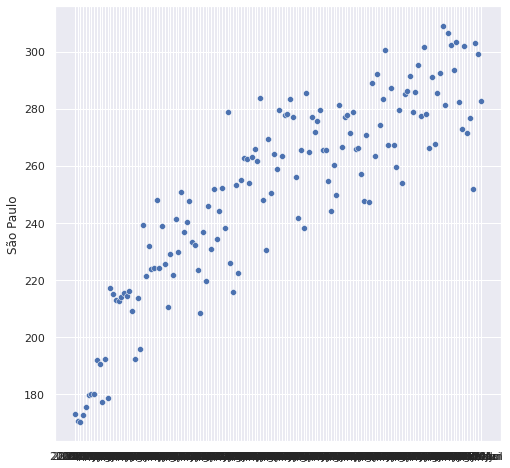

In [ ]:
plt.figure(figsize=(8,8))
sns.scatterplot( x=df_ordenados_por_total.columns, y =df_ordenados_por_total.loc["São Paulo"])

In [ ]:
df_ordenados_por_total.T

Unidade da Federação,São Paulo,Minas Gerais,Paraná,Rio Grande do Sul,Rio de Janeiro,Bahia,Pernambuco,Santa Catarina,Ceará,Goiás,Pará,Maranhão,Espírito Santo,Rio Grande do Norte,Paraíba,Distrito Federal,Mato Grosso do Sul,Piauí,Alagoas,Mato Grosso,Amazonas,Sergipe,Tocantins,Rondônia,Acre,Roraima,Amapá
2008/Fev,172.83,70.30,48.86,45.90,44.12,33.41,26.22,24.41,27.64,18.15,20.13,13.45,10.03,9.11,10.87,10.22,8.28,9.71,8.11,7.93,7.93,4.64,5.05,1.94,1.74,0.77,1.28
2008/Mar,170.48,79.12,55.61,52.93,42.89,41.30,30.72,27.48,30.09,20.99,22.15,14.75,12.26,10.13,12.35,11.63,9.79,10.43,9.21,9.42,8.64,5.02,5.20,1.96,2.06,0.88,1.18
2008/Abr,170.28,79.05,56.12,51.97,45.30,42.83,30.59,27.81,31.38,21.05,23.44,15.15,12.45,10.96,12.68,11.92,9.00,10.23,10.47,9.39,8.53,5.27,5.34,2.14,2.06,0.90,1.40
2008/Mai,172.40,79.27,55.57,51.68,43.95,42.07,31.41,28.35,31.19,19.16,23.86,14.54,11.79,11.03,13.26,11.90,9.84,10.56,9.84,9.38,9.08,5.37,5.34,2.28,2.23,1.03,1.41
2008/Jun,175.42,79.61,56.09,53.76,44.10,39.91,28.95,28.99,29.46,20.33,23.50,14.55,11.89,10.45,12.25,11.97,10.26,10.47,10.29,9.45,8.65,4.98,5.40,2.62,2.11,0.94,1.42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020/Mar,276.61,147.08,114.48,84.65,73.59,70.34,59.63,56.71,46.40,34.56,34.75,28.83,26.56,20.94,17.61,19.41,17.36,15.32,16.00,14.44,14.77,9.19,7.03,7.17,2.86,2.81,2.29
2020/Abr,251.70,126.33,96.73,76.29,68.16,59.11,53.84,51.18,43.47,27.50,28.71,23.94,23.74,17.32,15.39,18.12,15.65,11.88,14.24,11.94,16.33,8.40,6.20,7.42,2.47,2.30,1.77
2020/Mai,302.86,136.87,106.10,86.08,86.28,61.76,65.42,56.84,54.20,31.87,41.25,32.98,28.61,19.92,18.97,21.44,16.70,14.18,15.25,13.98,19.44,8.45,6.73,8.58,2.38,2.91,2.70
2020/Jun,299.06,135.98,92.90,89.02,77.60,65.16,68.15,56.50,42.15,34.44,35.40,31.13,27.45,20.22,19.67,23.48,15.84,15.38,14.28,14.59,17.51,6.71,5.02,9.19,2.20,3.22,2.70


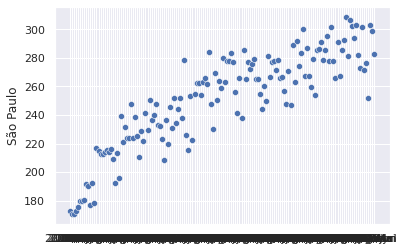

In [ ]:
sns.scatterplot( data=df_ordenados_por_total.T, x=df_ordenados_por_total.T.index, y ="São Paulo")

In [ ]:
mensal = df_ordenados_por_total.T

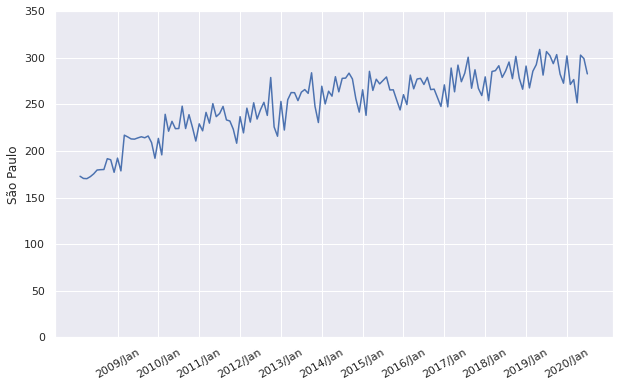

In [ ]:
plt.figure(figsize=(10,6))
ax = sns.lineplot( data=mensal, x=mensal.index, y ="São Paulo")
ax.xaxis.set_major_locator(ticker.IndexLocator(12,11))
plt.xticks(rotation = 30)
plt.ylim(0,350)
plt.grid(True)
plt.show()

####M2A3D1. Desafio 01
Fazer o scatter plot feito em aula para o seu estado, leia um pouco da documentação sobre este gráfico e teste alguns parâmetros.

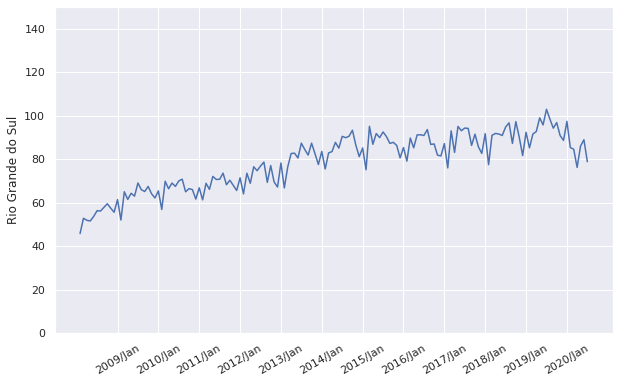

In [ ]:
plt.figure(figsize=(10,6))
ax = sns.lineplot( data=mensal, x=mensal.index, y ="Rio Grande do Sul")
ax.xaxis.set_major_locator(ticker.IndexLocator(12,11))
plt.xticks(rotation = 30)
plt.ylim(0,150)
plt.grid(True)
plt.show()

####M2A3D2. Desafio 02
Formatar o eixo y colocando a escala em milhões usando o StrMethodFormatter, colocar um título e colocar o título nos 2 eixos, alterando os tamanhos dos títulos.


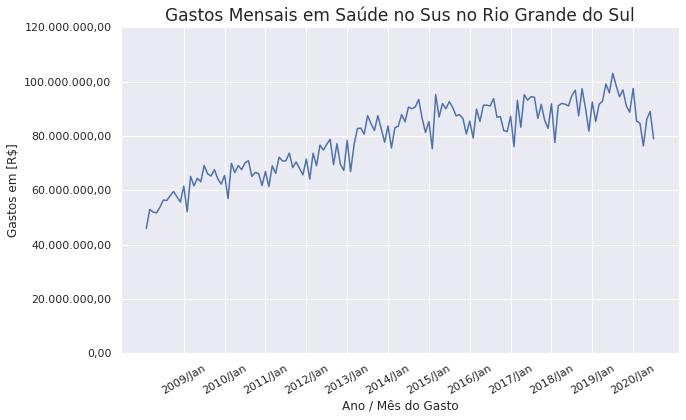

In [ ]:
plt.figure(figsize=(10,6))
ax = sns.lineplot( data=mensal*1000000, x=mensal.index, y ="Rio Grande do Sul")
ax.xaxis.set_major_locator(ticker.IndexLocator(12,11))
plt.xticks(rotation = 30)
plt.ylim(0,120000000)
plt.ylabel("Gastos em [R$]")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_dinheiro))
#ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:,.2f}"))
plt.xlabel("Ano / Mês do Gasto")
plt.title("Gastos Mensais em Saúde no Sus no Rio Grande do Sul",fontsize=17 )
plt.grid(True)
plt.show()

###M2A4. - Trabalhando com Datetime

####M2A4_1. - Datas com Datetime

In [ ]:
date.today()   

datetime.date(2020, 12, 11)

In [ ]:
meses = {
    "Jan" : 1,
    "Fev" : 2,
    "Mar" : 3,
    "Abr" : 4,
    "Mai" : 5,
    "Jun" : 6,
    "Jul" : 7,
    "Ago" : 8,
    "Set" : 9,
    "Out" : 10,
    "Nov" : 11,
    "Dez" : 12
}


def para_dia(ano_mes):
    ano: int = int(ano_mes[:4])
    mes: str = ano_mes[5:]
    mes_numero: int =  meses[mes]
    return date(ano,mes_numero,1)

In [ ]:
mensal.index.map(para_dia)

Index([2008-02-01, 2008-03-01, 2008-04-01, 2008-05-01, 2008-06-01, 2008-07-01,
       2008-08-01, 2008-09-01, 2008-10-01, 2008-11-01,
       ...
       2019-10-01, 2019-11-01, 2019-12-01, 2020-01-01, 2020-02-01, 2020-03-01,
       2020-04-01, 2020-05-01, 2020-06-01, 2020-07-01],
      dtype='object', length=150)

In [ ]:
mensal.index = mensal.index.map(para_dia)

In [ ]:
mensal.head()

Unidade da Federação,São Paulo,Minas Gerais,Paraná,Rio Grande do Sul,Rio de Janeiro,Bahia,Pernambuco,Santa Catarina,Ceará,Goiás,Pará,Maranhão,Espírito Santo,Rio Grande do Norte,Paraíba,Distrito Federal,Mato Grosso do Sul,Piauí,Alagoas,Mato Grosso,Amazonas,Sergipe,Tocantins,Rondônia,Acre,Roraima,Amapá
2008-02-01,172.83,70.30,48.86,45.90,44.12,33.41,26.22,24.41,27.64,18.15,20.13,13.45,10.03,9.11,10.87,10.22,8.28,9.71,8.11,7.93,7.93,4.64,5.05,1.94,1.74,0.77,1.28
2008-03-01,170.48,79.12,55.61,52.93,42.89,41.30,30.72,27.48,30.09,20.99,22.15,14.75,12.26,10.13,12.35,11.63,9.79,10.43,9.21,9.42,8.64,5.02,5.20,1.96,2.06,0.88,1.18
2008-04-01,170.28,79.05,56.12,51.97,45.30,42.83,30.59,27.81,31.38,21.05,23.44,15.15,12.45,10.96,12.68,11.92,9.00,10.23,10.47,9.39,8.53,5.27,5.34,2.14,2.06,0.90,1.40
2008-05-01,172.40,79.27,55.57,51.68,43.95,42.07,31.41,28.35,31.19,19.16,23.86,14.54,11.79,11.03,13.26,11.90,9.84,10.56,9.84,9.38,9.08,5.37,5.34,2.28,2.23,1.03,1.41
2008-06-01,175.42,79.61,56.09,53.76,44.10,39.91,28.95,28.99,29.46,20.33,23.50,14.55,11.89,10.45,12.25,11.97,10.26,10.47,10.29,9.45,8.65,4.98,5.40,2.62,2.11,0.94,1.42


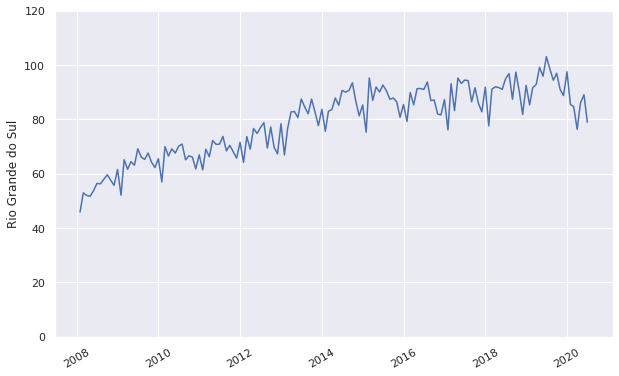

In [ ]:

plt.figure(figsize=(10,6))
ax = sns.lineplot( data=mensal, x=mensal.index, y ="Rio Grande do Sul")
plt.xticks(rotation = 30)
plt.ylim(0,120)
plt.grid(True)
plt.show()

In [ ]:
mensal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 150 entries, 2008-02-01 to 2020-07-01
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   São Paulo            150 non-null    float64
 1   Minas Gerais         150 non-null    float64
 2   Paraná               150 non-null    float64
 3   Rio Grande do Sul    150 non-null    float64
 4   Rio de Janeiro       150 non-null    float64
 5   Bahia                150 non-null    float64
 6   Pernambuco           150 non-null    float64
 7   Santa Catarina       150 non-null    float64
 8   Ceará                150 non-null    float64
 9   Goiás                150 non-null    float64
 10  Pará                 150 non-null    float64
 11  Maranhão             150 non-null    float64
 12  Espírito Santo       150 non-null    float64
 13  Rio Grande do Norte  150 non-null    float64
 14  Paraíba              150 non-null    float64
 15  Distrito Federal     150 non-

####M2A4_2. - Manipulação de dados com Melt

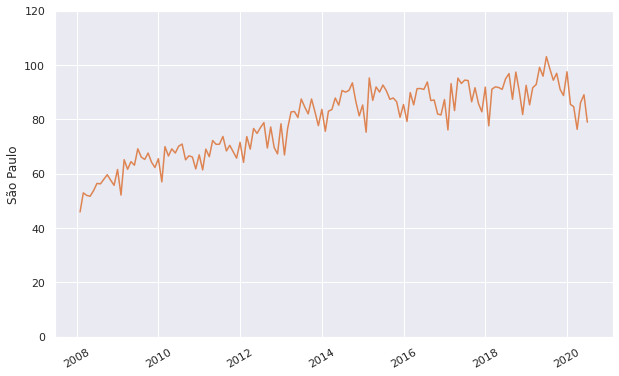

In [ ]:

plt.figure(figsize=(10,6))
ax = sns.lineplot( data=mensal, x=mensal.index, y ="São Paulo")
ax = sns.lineplot( data=mensal, x=mensal.index, y ="Rio Grande do Sul")
plt.xticks(rotation = 30)
plt.ylim(0,120)
plt.grid(True)
plt.show()

In [ ]:
mensal.head()

Unidade da Federação,São Paulo,Minas Gerais,Paraná,Rio Grande do Sul,Rio de Janeiro,Bahia,Pernambuco,Santa Catarina,Ceará,Goiás,Pará,Maranhão,Espírito Santo,Rio Grande do Norte,Paraíba,Distrito Federal,Mato Grosso do Sul,Piauí,Alagoas,Mato Grosso,Amazonas,Sergipe,Tocantins,Rondônia,Acre,Roraima,Amapá
2008-02-01,172.83,70.30,48.86,45.90,44.12,33.41,26.22,24.41,27.64,18.15,20.13,13.45,10.03,9.11,10.87,10.22,8.28,9.71,8.11,7.93,7.93,4.64,5.05,1.94,1.74,0.77,1.28
2008-03-01,170.48,79.12,55.61,52.93,42.89,41.30,30.72,27.48,30.09,20.99,22.15,14.75,12.26,10.13,12.35,11.63,9.79,10.43,9.21,9.42,8.64,5.02,5.20,1.96,2.06,0.88,1.18
2008-04-01,170.28,79.05,56.12,51.97,45.30,42.83,30.59,27.81,31.38,21.05,23.44,15.15,12.45,10.96,12.68,11.92,9.00,10.23,10.47,9.39,8.53,5.27,5.34,2.14,2.06,0.90,1.40
2008-05-01,172.40,79.27,55.57,51.68,43.95,42.07,31.41,28.35,31.19,19.16,23.86,14.54,11.79,11.03,13.26,11.90,9.84,10.56,9.84,9.38,9.08,5.37,5.34,2.28,2.23,1.03,1.41
2008-06-01,175.42,79.61,56.09,53.76,44.10,39.91,28.95,28.99,29.46,20.33,23.50,14.55,11.89,10.45,12.25,11.97,10.26,10.47,10.29,9.45,8.65,4.98,5.40,2.62,2.11,0.94,1.42


 

 Mes       | Valor     |  Estado
 ---|---|---
 2008-03  |  170.48  |    SP
 2008-03  |   79.12   |   MG




In [ ]:
mensal_aberto = mensal.reset_index().melt(id_vars=["index"],value_vars=mensal.columns)
mensal_aberto.columns = ["dia_mes_ano","uf","gasto"]
mensal_aberto['dia_mes_ano'] = mensal_aberto['dia_mes_ano'].astype('datetime64')
mensal_aberto.head()

,dia_mes_ano,uf,gasto
0,2008-02-01,São Paulo,172.83
1,2008-03-01,São Paulo,170.48
2,2008-04-01,São Paulo,170.28
3,2008-05-01,São Paulo,172.40
4,2008-06-01,São Paulo,175.42


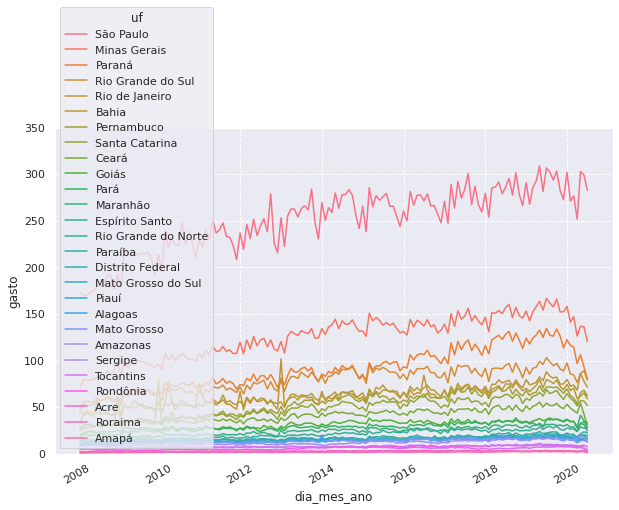

In [ ]:
plt.figure(figsize=(10,6))
ax = sns.lineplot( data=mensal_aberto, x="dia_mes_ano",  y="gasto", hue="uf")

plt.xticks(rotation = 30)
plt.ylim(0,350)
plt.grid(linestyle="--")
plt.show()

#### M2A4D2. Desafio 02
Aprendemos a usar o Melt para desnormalizar sua base de dados, agora o desafio é realizar o processo contrário, voltar atrás partindo do mensal_aberto chegando no mensal.

In [ ]:
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.pivot.html

mensal_aberto.pivot(index='dia_mes_ano',columns='uf',values='gasto')

uf,Acre,Alagoas,Amapá,Amazonas,Bahia,Ceará,Distrito Federal,Espírito Santo,Goiás,Maranhão,Mato Grosso,Mato Grosso do Sul,Minas Gerais,Paraná,Paraíba,Pará,Pernambuco,Piauí,Rio Grande do Norte,Rio Grande do Sul,Rio de Janeiro,Rondônia,Roraima,Santa Catarina,Sergipe,São Paulo,Tocantins
dia_mes_ano,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-02-01,1.74,8.11,1.28,7.93,33.41,27.64,10.22,10.03,18.15,13.45,7.93,8.28,70.30,48.86,10.87,20.13,26.22,9.71,9.11,45.90,44.12,1.94,0.77,24.41,4.64,172.83,5.05
2008-03-01,2.06,9.21,1.18,8.64,41.30,30.09,11.63,12.26,20.99,14.75,9.42,9.79,79.12,55.61,12.35,22.15,30.72,10.43,10.13,52.93,42.89,1.96,0.88,27.48,5.02,170.48,5.20
2008-04-01,2.06,10.47,1.40,8.53,42.83,31.38,11.92,12.45,21.05,15.15,9.39,9.00,79.05,56.12,12.68,23.44,30.59,10.23,10.96,51.97,45.30,2.14,0.90,27.81,5.27,170.28,5.34
2008-05-01,2.23,9.84,1.41,9.08,42.07,31.19,11.90,11.79,19.16,14.54,9.38,9.84,79.27,55.57,13.26,23.86,31.41,10.56,11.03,51.68,43.95,2.28,1.03,28.35,5.37,172.40,5.34
2008-06-01,2.11,10.29,1.42,8.65,39.91,29.46,11.97,11.89,20.33,14.55,9.45,10.26,79.61,56.09,12.25,23.50,28.95,10.47,10.45,53.76,44.10,2.62,0.94,28.99,4.98,175.42,5.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-03-01,2.86,16.00,2.29,14.77,70.34,46.40,19.41,26.56,34.56,28.83,14.44,17.36,147.08,114.48,17.61,34.75,59.63,15.32,20.94,84.65,73.59,7.17,2.81,56.71,9.19,276.61,7.03
2020-04-01,2.47,14.24,1.77,16.33,59.11,43.47,18.12,23.74,27.50,23.94,11.94,15.65,126.33,96.73,15.39,28.71,53.84,11.88,17.32,76.29,68.16,7.42,2.30,51.18,8.40,251.70,6.20
2020-05-01,2.38,15.25,2.70,19.44,61.76,54.20,21.44,28.61,31.87,32.98,13.98,16.70,136.87,106.10,18.97,41.25,65.42,14.18,19.92,86.08,86.28,8.58,2.91,56.84,8.45,302.86,6.73


#### M2A4D3. Desafio 03
 Melhorar o gráfico da distribuição do gráfico:

* Escolha apenas alguns estados.
* Mude a palete de cores.
* Posicione a legenda de forma mais adequada.
* Adicione título principal e nos eixos x e y.

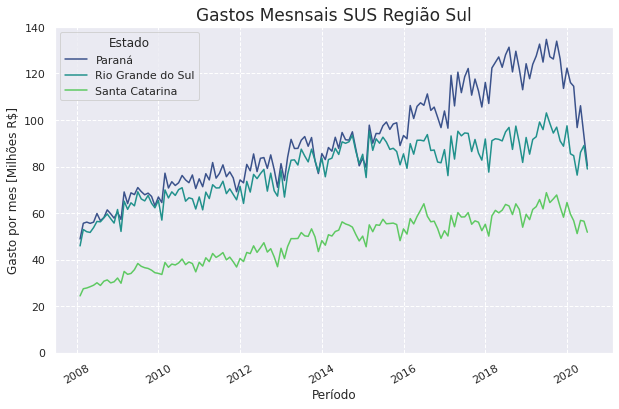

In [ ]:
#https://seaborn.pydata.org/tutorial/color_palettes.html
plt.figure(figsize=(10,6))

dados_selecionados = mensal_aberto[mensal_aberto['uf'].isin(
    ['Paraná','Santa Catarina','Rio Grande do Sul'])]
ax = sns.lineplot( data=dados_selecionados, x="dia_mes_ano",  y="gasto", hue="uf", palette="viridis")

plt.xticks(rotation = 30)
plt.title("Gastos Mesnsais SUS Região Sul", fontsize = 17)
plt.legend(title='Estado')
plt.ylabel("Gasto por mes [Milhões R$]")
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()

### M2A5. Manipulando datas e gerando novas análises

Comparando gastos ano a ano

In [ ]:
mensal_aberto["dia_mes_ano"].head()

0   2008-02-01
1   2008-03-01
2   2008-04-01
3   2008-05-01
4   2008-06-01
Name: dia_mes_ano, dtype: datetime64[ns]

In [ ]:
mensal_aberto["mes"] = mensal_aberto["dia_mes_ano"].dt.month
mensal_aberto["ano"] = mensal_aberto["dia_mes_ano"].dt.year
mensal_aberto.head()

,dia_mes_ano,uf,gasto,mes,ano
0,2008-02-01,São Paulo,172.83,2,2008
1,2008-03-01,São Paulo,170.48,3,2008
2,2008-04-01,São Paulo,170.28,4,2008
3,2008-05-01,São Paulo,172.40,5,2008
4,2008-06-01,São Paulo,175.42,6,2008


In [ ]:
mensal_aberto.query("uf == 'São Paulo'")
#mensal_aberto.query("uf in 'São Paulo'")

,dia_mes_ano,uf,gasto,mes,ano
0,2008-02-01,São Paulo,172.83,2,2008
1,2008-03-01,São Paulo,170.48,3,2008
2,2008-04-01,São Paulo,170.28,4,2008
3,2008-05-01,São Paulo,172.40,5,2008
4,2008-06-01,São Paulo,175.42,6,2008
...,...,...,...,...,...
145,2020-03-01,São Paulo,276.61,3,2020
146,2020-04-01,São Paulo,251.70,4,2020
147,2020-05-01,São Paulo,302.86,5,2020
148,2020-06-01,São Paulo,299.06,6,2020


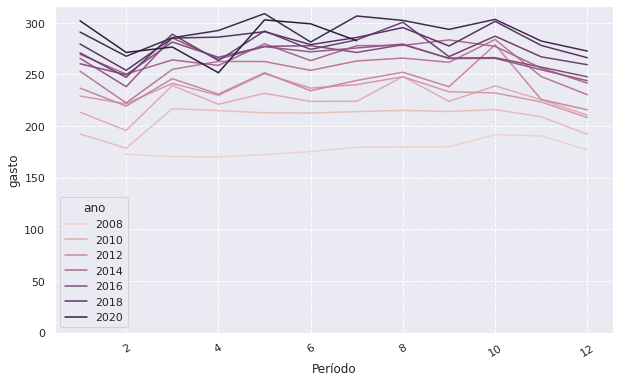

In [ ]:
#https://seaborn.pydata.org/tutorial/color_palettes.html
plt.figure(figsize=(10,6))

dados_selecionados = mensal_aberto.query("uf == 'São Paulo'")
ax = sns.lineplot( data=dados_selecionados, x="mes",  y="gasto", hue="ano")
plt.xticks(rotation = 30)
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()


In [ ]:
dias_por_mes = {
    1 : 31,
    2 : 28,
    3 : 31,
    4 : 30,
    5 : 31,
    6 : 30,
    7 : 31,
    8 : 31,
    9 : 30,
    10 : 31,
    11 : 30,
    12 : 31 
 }

In [ ]:
mensal_aberto['diario'] = mensal_aberto['gasto'] / mensal_aberto['mes'].map(dias_por_mes)

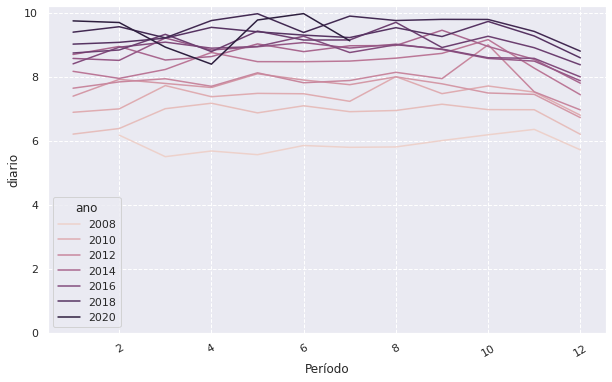

In [ ]:
#https://seaborn.pydata.org/tutorial/color_palettes.html
plt.figure(figsize=(10,6))

dados_selecionados = mensal_aberto.query("uf == 'São Paulo'")
ax = sns.lineplot( data=dados_selecionados, x="mes",  y="diario", hue="ano")
plt.xticks(rotation = 30)
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()

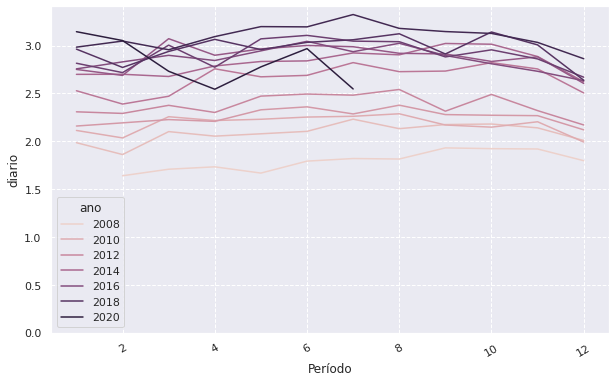

In [ ]:
plt.figure(figsize=(10,6))

dados_selecionados = mensal_aberto.query("uf == 'Rio Grande do Sul'")
ax = sns.lineplot( data=dados_selecionados, x="mes",  y="diario", hue="ano")
plt.xticks(rotation = 30)
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()

####M2A5D1. Desafio 01
Melhorar o gráfico ano a ano: 
* Mudar a palete de cor, 
* colocar um título descritivo, 
* adicionar ticks com o nome de cada mês no eixo x.


In [ ]:
mes_sigla = ['Jan', 'Fev', 'Mar', 'Abr', 'Mai',
             'Jun', 'Jul', 'Ago', 'Set', 'Out',
             'Nov', 'Dez']

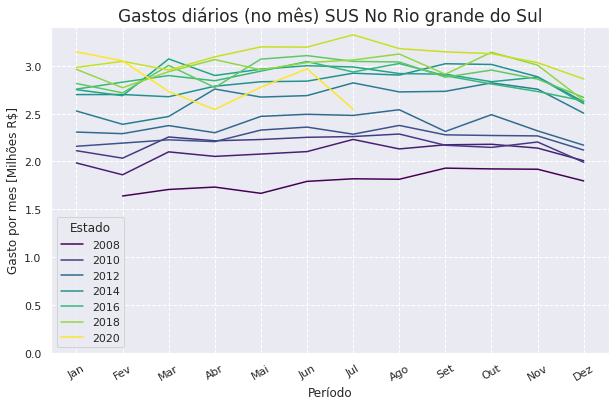

In [ ]:
plt.figure(figsize=(10,6))
dados_selecionados = mensal_aberto.query("uf == 'Rio Grande do Sul'")
ax = sns.lineplot( data=dados_selecionados, x="mes",  y="diario", hue="ano", palette="viridis")
plt.xticks(ticks=range(1,13),labels=mes_sigla, rotation = 30)
plt.title("Gastos diários (no mês) SUS No Rio grande do Sul", fontsize = 17)
plt.legend(title='Estado')
plt.ylabel("Gasto por mes [Milhões R$]")
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()



####M2A5D2. Desafio 02
* Pegar estados de climas diferentes (por exemplo, norte e sul) e 
* plotar o gráfico de linhas, 
* comparar ambos e compartilhar suas análises.

In [ ]:
mensal_aberto.query("uf in ('Rio Grande do Sul','Bahia') and ano == 2019")

,dia_mes_ano,uf,gasto,mes,ano,diario
581,2019-01-01,Rio Grande do Sul,92.47,1,2019,2.98
582,2019-02-01,Rio Grande do Sul,85.30,2,2019,3.05
583,2019-03-01,Rio Grande do Sul,91.62,3,2019,2.96
584,2019-04-01,Rio Grande do Sul,92.79,4,2019,3.09
585,2019-05-01,Rio Grande do Sul,99.12,5,2019,3.20
586,2019-06-01,Rio Grande do Sul,95.84,6,2019,3.19
587,2019-07-01,Rio Grande do Sul,103.03,7,2019,3.32
588,2019-08-01,Rio Grande do Sul,98.55,8,2019,3.18
589,2019-09-01,Rio Grande do Sul,94.37,9,2019,3.15
590,2019-10-01,Rio Grande do Sul,96.91,10,2019,3.13


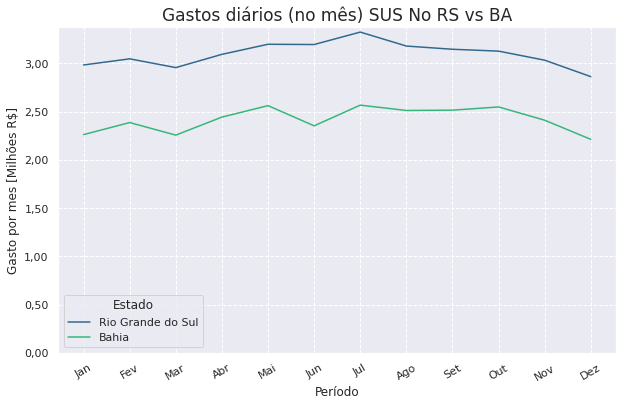

In [ ]:
plt.figure(figsize=(10,6))
dados_selecionados = mensal_aberto.query("uf in ('Rio Grande do Sul','Bahia') and ano == 2019")
ax = sns.lineplot( data=dados_selecionados, x="mes",  y="diario",hue='uf', palette="viridis")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_dinheiro))
plt.xticks(ticks=range(1,13),labels=mes_sigla, rotation = 30)
plt.title("Gastos diários (no mês) SUS No RS vs BA", fontsize = 17)
plt.legend(title='Estado')
plt.ylabel("Gasto por mes [Milhões R$]")
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()

### M2A6. Manipulando dados e análisando por categoria

Avançando em pandas e seaborn

In [ ]:
estado_a_analisar = mensal_aberto.query("uf in 'Rio Grande do Sul'")
estado_a_analisar.head()

,dia_mes_ano,uf,gasto,mes,ano,diario
450,2008-02-01,Rio Grande do Sul,45.90,2,2008,1.64
451,2008-03-01,Rio Grande do Sul,52.93,3,2008,1.71
452,2008-04-01,Rio Grande do Sul,51.97,4,2008,1.73
453,2008-05-01,Rio Grande do Sul,51.68,5,2008,1.67
454,2008-06-01,Rio Grande do Sul,53.76,6,2008,1.79


In [ ]:
gastos_por_ano = estado_a_analisar.groupby("ano").sum()
gastos_por_ano.head()

,gasto,mes,diario
ano,,,
2008,599.63,77,19.74
2009,762.24,78,25.04
2010,795.98,78,26.16
2011,823.43,78,27.07
2012,868.79,78,28.55


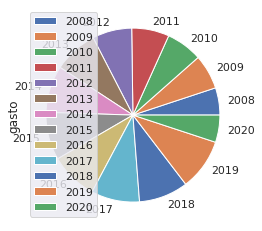

In [ ]:
gastos_por_ano.plot(kind = 'pie', y='gasto')

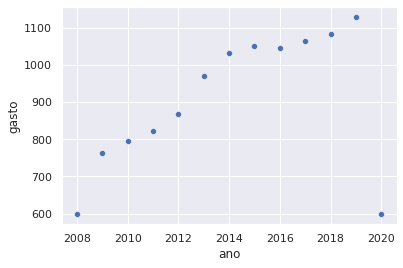

In [ ]:
sns.scatterplot(data = gastos_por_ano, x = gastos_por_ano.index , y='gasto')

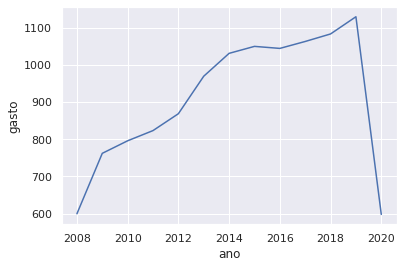

In [ ]:
sns.lineplot(data = gastos_por_ano, x = gastos_por_ano.index , y='gasto')

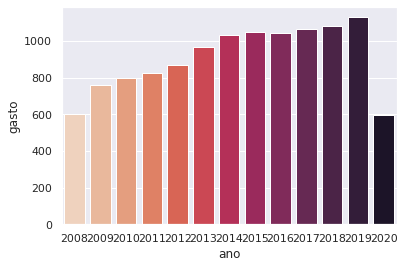

In [ ]:
ax = sns.barplot(data = gastos_por_ano, x = gastos_por_ano.index , y='gasto', palette=sns.color_palette("rocket_r",13))


In [ ]:
estados = ["Paraná", "Santa Catarina", "Rio Grande do Sul"]
por_ano_dos_estados = mensal_aberto.query("uf in @estados").groupby(["uf","ano"]).sum().reset_index()
por_ano_dos_estados.head()

,uf,ano,gasto,mes,diario
0,Paraná,2008,625.69,77,20.60
1,Paraná,2009,794.21,78,26.10
2,Paraná,2010,867.92,78,28.54
3,Paraná,2011,909.21,78,29.90
4,Paraná,2012,950.79,78,31.26


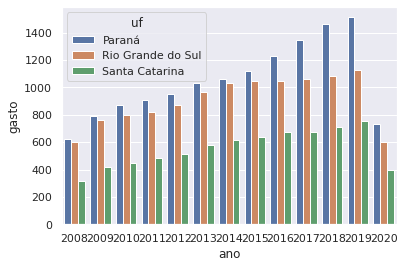

In [ ]:
sns.barplot(data = por_ano_dos_estados, x = 'ano' , y='gasto',hue='uf')
 #,palette=sns.color_palette("rocket_r",13))


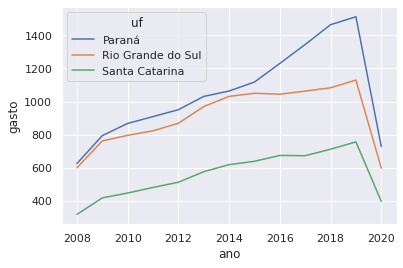

In [ ]:
sns.lineplot(data = por_ano_dos_estados, x = 'ano' , y='gasto',hue='uf')

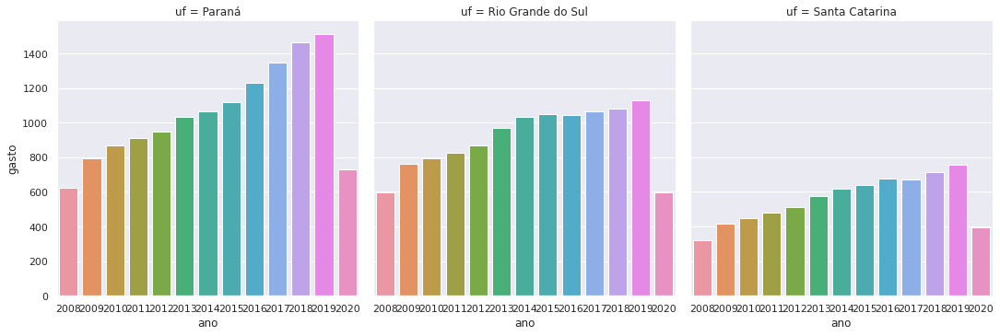

In [ ]:
sns.catplot(data = por_ano_dos_estados, x = 'ano' , y='gasto',kind = 'bar', col='uf')

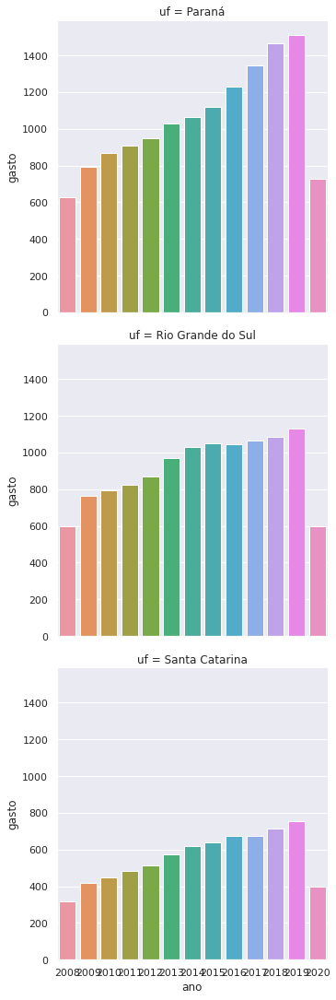

In [ ]:
sns.catplot(data = por_ano_dos_estados, x = 'ano' , y='gasto',kind = 'bar', row='uf')

####M2A6D1. Desafio 01
Reordenar as cores pelo valor do eixo y.

In [ ]:
# versão da solução de Silvia Freitas
# + #https://stackoverflow.com/questions/36271302/changing-color-scale-in-seaborn-bar-plot
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.rank.html?highlight=rank#pandas.Series.rank

rank = gastos_por_ano['gasto'].rank().astype(int) -1
col = sns.color_palette("Blues_d", len(gastos_por_ano))
pal = [col[x] for x in rank]

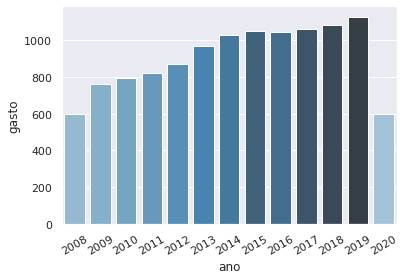

In [ ]:
sns.barplot(data=gastos_por_ano, x=gastos_por_ano.index, y="gasto", palette=pal)
plt.xticks(rotation = 30)
plt.show()

####M2A6D2. Desafio 02
Explorar a documentação do Seaborn.

####M2A6D3. Desafio 03
* Pensar e elaborar novos gráficos depois de estudar o Seaborn, 
* compartilhar com uma breve descrição no Discord, para que outros colegas aprendam sobre o gráfico usado.


####M2A6D4. Desafio 04
* Baixe uma outra base de dados do tabnet e 
* execute sua análise de forma similar a aula.

In [ ]:
url = "https://raw.githubusercontent.com/lvb86/alura-bootcamp-dsa/main/dados/M2A6_dados.csv"
dados = pd.read_csv(url,encoding="utf-8",skiprows=0,skipfooter=1,sep=";",thousands=".", decimal=",", na_values = '-')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  


In [ ]:
dados.tail()

,Unidade da Federação,2007/Jan,2007/Fev,2007/Mar,2007/Abr,2007/Mai,2007/Jun,2007/Jul,2007/Ago,2007/Set,2007/Out,2007/Nov,2007/Dez,2008/Jan,2008/Fev,2008/Mar,2008/Abr,2008/Mai,2008/Jun,2008/Jul,2008/Ago,2008/Set,2008/Out,2008/Nov,2008/Dez,2009/Jan,2009/Fev,2009/Mar,2009/Abr,2009/Mai,2009/Jun,2009/Jul,2009/Ago,2009/Set,2009/Out,2009/Nov,2009/Dez,2010/Jan,2010/Fev,2010/Mar,...,2017/Ago,2017/Set,2017/Out,2017/Nov,2017/Dez,2018/Jan,2018/Fev,2018/Mar,2018/Abr,2018/Mai,2018/Jun,2018/Jul,2018/Ago,2018/Set,2018/Out,2018/Nov,2018/Dez,2019/Jan,2019/Fev,2019/Mar,2019/Abr,2019/Mai,2019/Jun,2019/Jul,2019/Ago,2019/Set,2019/Out,2019/Nov,2019/Dez,2020/Jan,2020/Fev,2020/Mar,2020/Abr,2020/Mai,2020/Jun,2020/Jul,2020/Ago,2020/Set,2020/Out,Total
22,43 Rio Grande do Sul,nan,nan,nan,nan,nan,4.00,19.00,251,1261,4907,10116,27817,58910,54736,61611,59890,59106,60888,64579,61252,61948,62243,58598,55442,59078,52109,63522,59407,61791,61262,66785,62365,60969,63003,60792,58292,59683,54080,64897,...,66845,60222,62825,60568,57500,62521,54218,63875,64284,63550,62887,67131,66614,59802,65061,60075,56113,62443,56389,61635,64444,68285,65770,69225,67859,64316,66553,61739,59523,64798,58095,56860,44718,50472,52389,52685,51305,47244,26308.00,9428084
23,50 Mato Grosso do Sul,nan,nan,nan,nan,nan,nan,12.00,162,421,954,2198,6232,12254,12062,13397,13124,12990,13383,13603,12686,13317,13340,12329,11137,11884,11519,14521,13453,13163,12981,13726,14409,13626,13226,13429,12494,13342,13084,16236,...,14387,13421,13677,13323,12849,13703,12293,14594,14534,14615,13933,14648,14605,13923,14429,14006,13123,14012,13582,14841,15468,16162,14816,14758,14849,14724,14844,14442,14020,15220,14698,14463,10841,11582,11575,11975,10782,7911,2964.00,2075178
24,51 Mato Grosso,3.00,2.00,nan,nan,nan,1.00,6.00,102,320,977,2085,7975,13961,13522,16016,15480,15568,15085,15150,14483,14952,14449,13244,12567,13878,12784,16552,15968,15873,14763,14775,15580,14671,14052,14747,13942,15115,13939,16803,...,16379,15806,15873,14800,14317,15425,14307,17145,16825,17021,16036,16427,16308,15615,16561,15139,14447,15742,15054,16601,16936,17606,16340,16851,16797,16697,17200,15691,14500,15954,14932,15050,11654,12731,12468,12965,11939,10241,6217.00,2349334
25,52 Goiás,3.00,3.00,nan,nan,nan,3.00,7.00,298,812,1988,4158,15850,31520,28761,33751,34080,29786,28488,28751,30948,32218,29253,25739,24626,28061,26735,33745,31661,31135,28794,29833,31998,31121,29644,30215,28874,32623,30627,35019,...,28932,26765,28296,26454,25708,27719,25480,29211,28481,28692,26401,26744,27909,27232,27709,26380,25947,27589,26353,28366,30316,30868,28249,28659,29103,28726,29589,27591,26956,28591,27132,26418,20990,22774,23767,24625,23152,19675,12921.00,4405677
26,53 Distrito Federal,4.00,12.00,1.00,nan,1.00,1.00,9.00,47,281,1918,4752,9370,14525,14212,16576,16585,15974,15376,15099,15648,16040,15609,15052,14155,14664,14030,17386,16146,16175,15313,15674,15833,15794,14766,14992,14371,15434,14567,17306,...,17143,16192,17063,15613,15472,16630,15458,18084,17561,18035,16899,17108,17576,17661,17534,17409,17158,18334,18045,19814,20498,20370,18496,19792,20342,19898,20198,17807,17381,18315,17616,18055,15848,16646,16555,16829,16029,13996,10791.00,2467846


In [ ]:
dados['uf'] = dados['Unidade da Federação'].str[3:]
dados = dados.drop(columns = ['Unidade da Federação','Total'],axis = 1)
dados = dados.set_index('uf')
dados = dados.T
dados.index = dados.index.map(para_dia)
dados = dados.reset_index().melt(id_vars=["index"],value_vars=mensal.columns)
dados.columns = ["dia_mes_ano","uf","internacoes"]
dados['dia_mes_ano'] = dados['dia_mes_ano'].astype('datetime64')
dados['ano'] = dados['dia_mes_ano'].dt.year
dados['mes'] = dados['dia_mes_ano'].dt.month
dados['diario'] = dados['internacoes'] / dados['mes'].map(dias_por_mes)

In [ ]:
dados_estado_mes = dados.query("uf == 'Rio Grande do Sul'")
dados_estado_ano = dados.query("uf == 'Rio Grande do Sul'").groupby('ano').sum()
dados_estado_ano = dados.query("uf == 'Rio Grande do Sul'").groupby('ano').sum()
dados_estado_RS_BA = dados.query("uf in ('Rio Grande do Sul', 'Bahia')").groupby(['uf','ano']).sum()
dados_estado_sul = dados.query("uf in ('Paraná','Santa Catarina','Rio Grande do Sul')").groupby(['uf','ano']).sum()

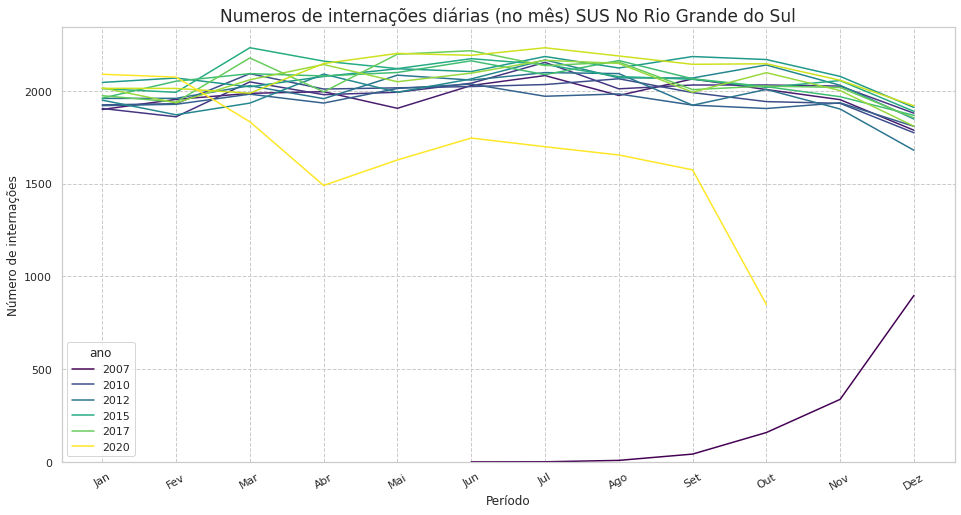

In [ ]:
plt.figure(figsize=(16,8))
sns.set(style="whitegrid")
ax = sns.lineplot(data = dados_estado_mes, x='mes',y='diario', hue = 'ano', palette="viridis")
plt.xticks(ticks=range(1,13),labels=mes_sigla, rotation = 30)
plt.title("Numeros de internações diárias (no mês) SUS No Rio Grande do Sul", fontsize = 17)
plt.grid('--')

#plt.legend(title='Estado')
plt.ylabel("Número de internações")
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()

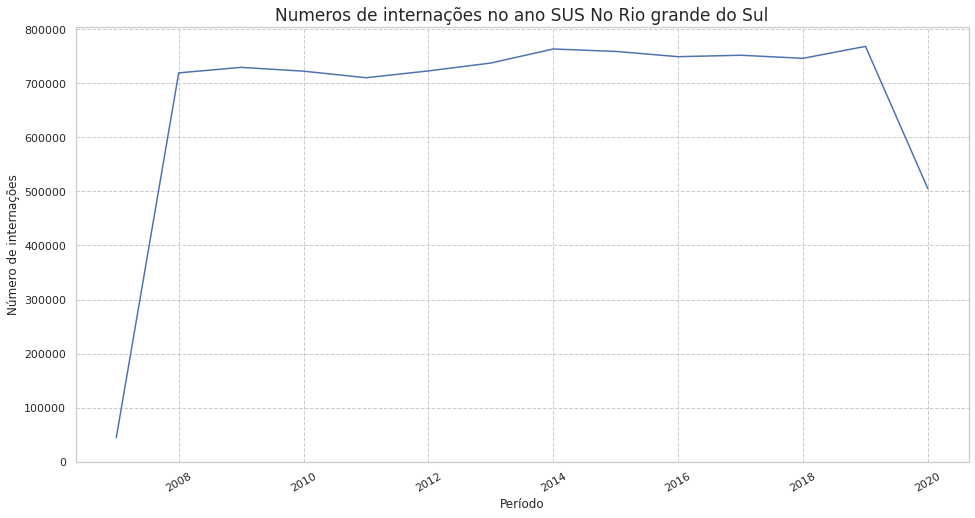

In [ ]:
plt.figure(figsize=(16,8))
sns.set(style="whitegrid")
ax = sns.lineplot(data = dados_estado_ano, x=dados_estado_ano.index,y='internacoes', palette="viridis")
plt.xticks( rotation = 30)
plt.title("Numeros de internações no ano SUS No Rio grande do Sul", fontsize = 17)
plt.grid('--')

#plt.legend(title='Estado')
plt.ylabel("Número de internações")
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()

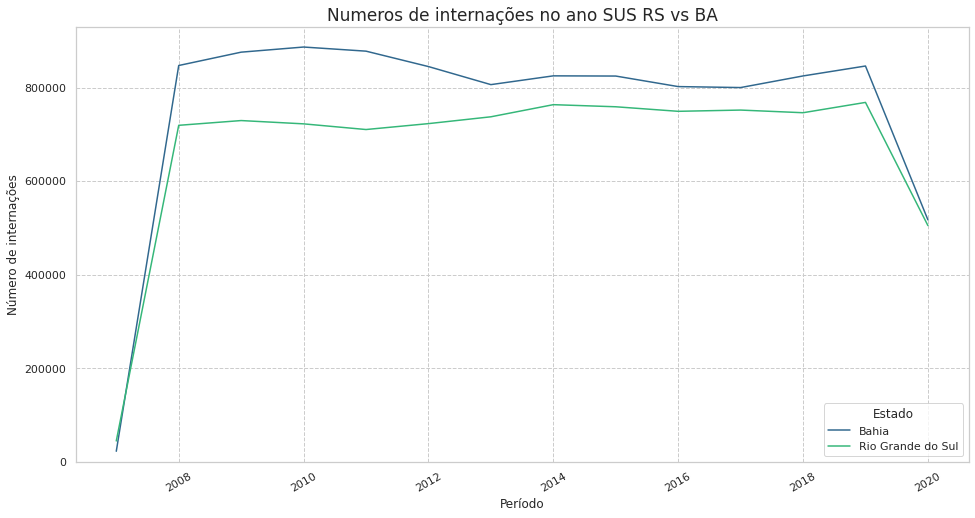

In [ ]:
plt.figure(figsize=(16,8))
sns.set(style="whitegrid")
ax = sns.lineplot(data = dados_estado_RS_BA, x='ano',y='internacoes', palette="viridis",hue='uf')
plt.xticks( rotation = 30)
plt.title("Numeros de internações no ano SUS RS vs BA", fontsize = 17)
plt.grid('--')

plt.legend(title='Estado')
plt.ylabel("Número de internações")
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()

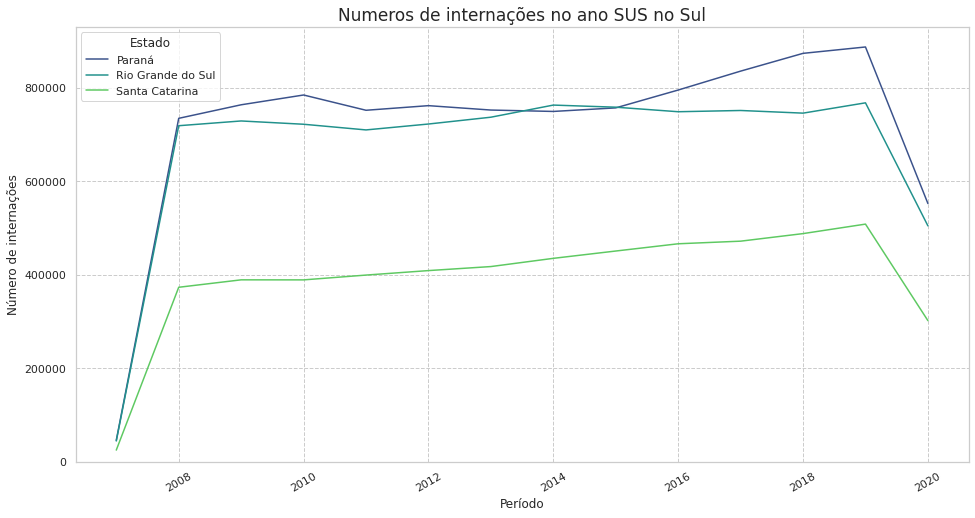

In [ ]:
plt.figure(figsize=(16,8))
sns.set(style="whitegrid")
ax = sns.lineplot(data = dados_estado_sul, x='ano',y='internacoes', palette="viridis",hue='uf')
plt.xticks( rotation = 30)
plt.title("Numeros de internações no ano SUS no Sul", fontsize = 17)
plt.grid('--')

plt.legend(title='Estado')
plt.ylabel("Número de internações")
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()

In [ ]:
internacoes_por_ano = dados[['uf','internacoes','ano']].groupby(['uf','ano']).sum()
internacoes_por_ano_percapto = populacao.join(internacoes_por_ano)

In [ ]:
internacoes_por_ano_percapto

populacao  internacoes
uf        ano                         
Acre      2007     894470      2187.00
          2008     894470     49010.00
          2009     894470     46359.00
          2010     894470     49778.00
          2011     894470     52112.00
...                   ...          ...
Tocantins 2016    1590248     76197.00
          2017    1590248     77648.00
          2018    1590248     70102.00
          2019    1590248     82688.00
          2020    1590248     55255.00

[378 rows x 2 columns]

In [ ]:
internacoes_por_ano_percapto['percapto'] = internacoes_por_ano_percapto['internacoes']/internacoes_por_ano_percapto['populacao']

In [ ]:
internacoes_por_ano_percapto.head()

populacao  internacoes  percapto
uf   ano                                   
Acre 2007     894470      2187.00      0.00
     2008     894470     49010.00      0.05
     2009     894470     46359.00      0.05
     2010     894470     49778.00      0.06
     2011     894470     52112.00      0.06

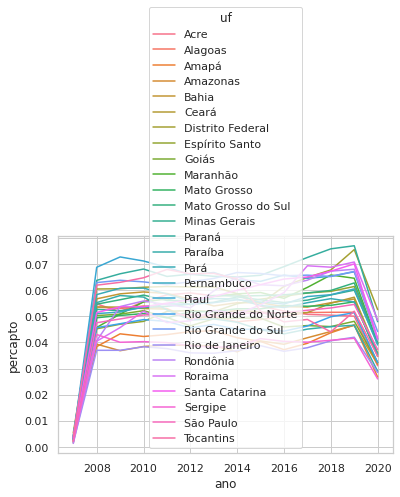

In [ ]:
sns.lineplot(data = internacoes_por_ano_percapto, x = 'ano', y = 'percapto', hue = 'uf')


In [ ]:
reg = {
'Rondônia'            :          'Norte',
'Acre'                :          'Norte',
'Amazonas'            :          'Norte',
'Roraima'             :          'Norte',
'Pará'                :          'Norte',
'Amapá'               :          'Norte',
'Tocantins'           :          'Norte',
'Maranhão'            :       'Nordeste',
'Piauí'               :       'Nordeste',
'Ceará'               :       'Nordeste',
'Rio Grande do Norte' :       'Nordeste',
'Paraíba'             :       'Nordeste',
'Pernambuco'          :       'Nordeste',
'Alagoas'             :       'Nordeste',
'Sergipe'             :       'Nordeste',
'Bahia'               :       'Nordeste',
'Minas Gerais'        :        'Sudeste',
'Espírito Santo'      :        'Sudeste',
'Rio de Janeiro'      :        'Sudeste',
'São Paulo'           :        'Sudeste',
'Paraná'              :            'Sul',
'Santa Catarina'      :            'Sul',
'Rio Grande do Sul'   :            'Sul',
'Mato Grosso do Sul'  :   'Centro-Oeste',
'Mato Grosso'         :   'Centro-Oeste',
'Goiás'               :   'Centro-Oeste',
'Distrito Federal'    :   'Centro-Oeste'
}

In [ ]:
internacoes_por_ano_percapto = internacoes_por_ano_percapto.reset_index()
internacoes_por_ano_percapto['regiao'] = internacoes_por_ano_percapto['uf'].map(reg)

In [ ]:
internacoes_por_ano_percapto

,uf,ano,populacao,internacoes,percapto,regiao
0,Acre,2007,894470,2187.00,0.00,Norte
1,Acre,2008,894470,49010.00,0.05,Norte
2,Acre,2009,894470,46359.00,0.05,Norte
3,Acre,2010,894470,49778.00,0.06,Norte
4,Acre,2011,894470,52112.00,0.06,Norte
...,...,...,...,...,...,...
373,Tocantins,2016,1590248,76197.00,0.05,Norte
374,Tocantins,2017,1590248,77648.00,0.05,Norte
375,Tocantins,2018,1590248,70102.00,0.04,Norte
376,Tocantins,2019,1590248,82688.00,0.05,Norte


In [ ]:
internacoes_por_ano_regiao = internacoes_por_ano_percapto[['regiao','ano','populacao','internacoes']].groupby(['regiao','ano']).sum()
internacoes_por_ano_regiao['percapto'] =  internacoes_por_ano_regiao['internacoes']/internacoes_por_ano_regiao['populacao']  

In [ ]:
internacoes_por_ano_regiao

populacao  internacoes  percapto
regiao       ano                                   
Centro-Oeste 2007   16504303     60968.00      0.00
             2008   16504303    870871.00      0.05
             2009   16504303    882976.00      0.05
             2010   16504303    901706.00      0.05
             2011   16504303    872622.00      0.05
...                      ...          ...       ...
Sul          2016   30192315   2011198.00      0.07
             2017   30192315   2059929.00      0.07
             2018   30192315   2108497.00      0.07
             2019   30192315   2164500.00      0.07
             2020   30192315   1359434.00      0.05

[70 rows x 3 columns]

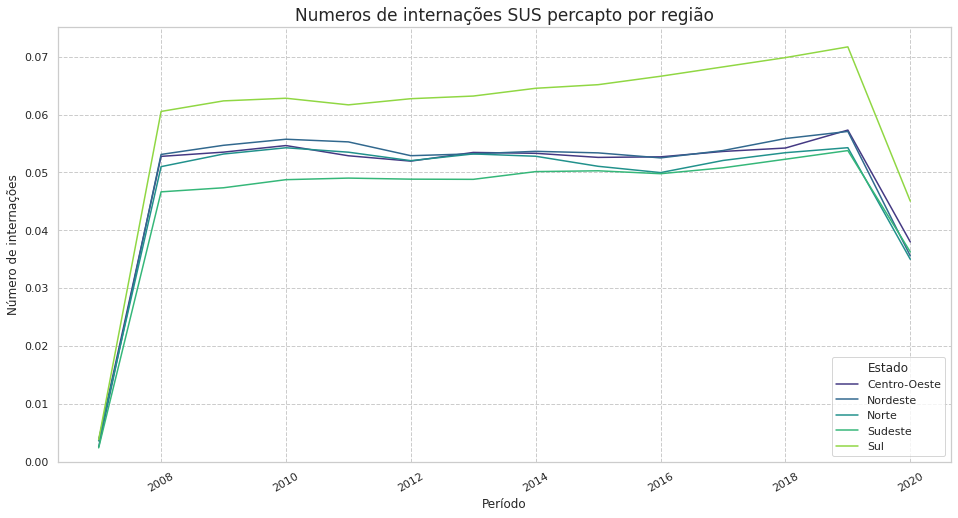

In [ ]:


plt.figure(figsize=(16,8))
sns.set(style="whitegrid")
sns.lineplot(data = internacoes_por_ano_regiao, x = 'ano', y = 'percapto', hue = 'regiao', palette = 'viridis')
plt.xticks( rotation = 30)
plt.title("Numeros de internações SUS percapto por região", fontsize = 17)
plt.grid('--')

plt.legend(title='Estado')
plt.ylabel("Número de internações")
plt.xlabel("Período")
plt.ylim(0,)
plt.grid(linestyle="--")
plt.show()

## M3: Análise descritiva e testes estatísticos
https://bootcamps.alura.com.br/course/bootcamp-datascience-modulo3

#### M3A1. Educação, Saúde e Tipos de dados

#### M3A1_3. Lendo dados compactados
descrito no Indice D3. Dados Modulo 3




#### M3A1_4. Tipos de dados

In [ ]:
dadosM3.shape

(16556, 181)

In [ ]:
dadosM3.columns

Index(['ANOPESQ', 'PAIS', 'REGEOGR', 'VB00004', 'VB01001', 'VB01002',
       'VB01003', 'VB01004', 'VB01005', 'VB01006',
       ...
       'ESTRATO_EXP', 'ESTRATOGEOREG', 'PESO', 'V0006', 'V0007', 'V0008',
       'V0041', 'aluno', 'escola', 'turma'],
      dtype='object', length=181)

In [ ]:
zip.namelist()[-1]

'Dicionario_PENSE_Microdados_AMOSTRA2.xls'

In [ ]:
dadosM3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16556 entries, 0 to 16555
Columns: 181 entries, ANOPESQ to turma
dtypes: float64(10), int64(171)
memory usage: 22.9 MB


In [ ]:
dadosM3.select_dtypes(include='object')

""
0
1
2
3
4
...
16551
16552
16553
16554


In [ ]:
dadosM3.select_dtypes(include='float')

,TEMPODESLOC,TEMPOTOTAL,TEMPOEDFIS,TEMPOEXTRA,TEMPOEST,VB17001,VB17002,VB17003,VB17004,PESO
0,0.0,15.0,0.0,15.0,60.0,371.0,1570.0,37.1,157.0,299.735235
1,120.0,510.0,260.0,130.0,300.0,502.0,1520.0,50.2,152.0,355.170081
2,0.0,585.0,130.0,455.0,420.0,482.0,1614.0,48.2,161.4,299.735235
3,0.0,0.0,0.0,0.0,0.0,694.0,1725.0,69.4,172.5,355.170081
4,30.0,165.0,90.0,45.0,60.0,789.0,1675.0,78.9,167.5,299.735235
...,...,...,...,...,...,...,...,...,...,...
16551,30.0,400.0,110.0,260.0,240.0,567.0,1679.0,56.7,167.9,447.815539
16552,20.0,800.0,325.0,455.0,240.0,619.0,1858.0,61.9,185.8,592.507440
16553,0.0,0.0,0.0,0.0,60.0,609.0,1594.0,60.9,159.4,401.131512
16554,75.0,215.0,35.0,105.0,120.0,473.0,1578.0,47.3,157.8,442.718091


##### M3A1D1. Desafio 01
Descompactar a pasta zipada usando outro método (Dica Allan, é utilizar comandos Bash).



In [ ]:
origem="/content/drive/MyDrive/Ensino/Cursos/'2020.11 - Alura DSA'/Dados/PeNSE_2015_AMOSTRA2.zip"

In [ ]:
destino="/content/drive/MyDrive/Ensino/Cursos/'2020.11 - Alura DSA'/Dados/Pense"

In [ ]:
!$destino

/bin/bash: /content/drive/MyDrive/Ensino/Cursos/2020.11 - Alura DSA/Dados/Pense: Is a directory


In [ ]:
!unzip {origem} -d {destino}

Archive:  /content/drive/MyDrive/Ensino/Cursos/2020.11 - Alura DSA/Dados/PeNSE_2015_AMOSTRA2.zip
replace /content/drive/MyDrive/Ensino/Cursos/2020.11 - Alura DSA/Dados/Pense/arquivos csv/PENSE_AMOSTRA2_ALUNO.CSV? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
!cd /content/drive/MyDrive/Ensino/Cursos/'2020.11 - Alura DSA'/Dados/

In [ ]:
!echo {origem}

/content/drive/MyDrive/Ensino/Cursos/2020.11 - Alura DSA/Dados/PeNSE_2015_AMOSTRA2.zip


In [ ]:
!ls -la $destino

total 154
drwx------ 2 root root   4096 Mar 19  2018 'arquivos csv'
drwx------ 2 root root   4096 Mar 19  2018 'arquivos sas'
drwx------ 2 root root   4096 Mar 19  2018 'arquivos xlsx'
-rw------- 1 root root 144896 Apr 18  2018  Dicionario_PENSE_Microdados_AMOSTRA2.xls


In [ ]:
!ls -la /content/drive/MyDrive/Ensino/Cursos/'2020.11 - Alura DSA'/Dados/ -PeNSE_2015_AMOSTRA2.zip

ls: invalid option -- 'P'
Try 'ls --help' for more information.


##### M3A1D2. Desafio 02
Estudar sobre a base de dados que vamos trabalhar. (PeNSE - 2015 Amostra 2)


https://www.youtube.com/watch?v=z4BBCHZUvD4

##### M3A1D3. Desafio 03
Classificar algumas perguntas como QualitativaXQuantitativa

> Qualitativa
* VB00004	Prezado(a) estudante, você concorda em participar dessa pesquisa?
* VB01001	Qual é o seu sexo?
* VB01002	Qual é a sua cor ou raça?
* VB01004	Qual é o mês do seu aniversário?
* VB01021	Em que ano/série você está?
* VB01022	Em que turno você estuda?
* VB01023	Você estuda em regime integral (tem atividades escolares por 7 horas ou mais horas diárias, durante todo o período escolar)?
* VB01024	Você estuda em regime de internato (a escola possui alojamento onde os alunos permanecem e dormem diariamente, durante todo o período escolar)?
* VB01025	Qual o grau de escolaridade mais elevado que você pretendo concluir?
* VB01026	Quando terminar o ciclo/curso que você está frequentando 
atualmente, você pretende?
* VB01006	Você mora com sua mãe?
* VB01007	Você mora com seu pai?

> Quantitativa Discreta 
* VB01003	Qual é a sua idade?
* VB01005	Em que ano você nasceu?
* VB01010A	Contando com você, quantas pessoas moram na sua casa ou apartamento?



#### M2A2. Dados Qualitativos e tabelas de frequência  

In [ ]:
dadosM3["VB01001"].value_counts()

1    8287
2    8269
Name: VB01001, dtype: int64

In [ ]:
dadosM3["VB01001"].value_counts(normalize = True)*100

1    50.054361
2    49.945639
Name: VB01001, dtype: float64

In [ ]:
frequencia = dadosM3["VB11007"].value_counts()
frequencia


2     6920
1     4608
4     2326
3     1807
5      714
99     181
Name: VB11007, dtype: int64

In [ ]:
percentual = dadosM3["VB11007"].value_counts(normalize = True)*100
percentual

2     41.797536
1     27.832810
4     14.049287
3     10.914472
5      4.312636
99     1.093259
Name: VB11007, dtype: float64

In [ ]:
respostas = {
    1: "Muito satisfeito(a)",
    2: "Satisfeito(a)",
    3: "Indiferente",
    4: "Insatisfeito(a)",
    5: "Muito insatisfeito(a)",
    6: "Não informado"
}

dist_freq = pd.DataFrame({"Frequência": frequencia, "Percentual": percentual})
dist_freq.rename(index = respostas, inplace =True)
dist_freq.rename_axis("Sentimento em relação ao seu corpo", axis = 1)

Sentimento em relação ao seu corpo,Frequência,Percentual
Satisfeito(a),6920,41.797536
Muito satisfeito(a),4608,27.832810
Insatisfeito(a),2326,14.049287
Indiferente,1807,10.914472
Muito insatisfeito(a),714,4.312636
99,181,1.093259


##### M3A2D1. Desafio 01
Criar uma função para gerar as tabelas de frequência e fazer a análise de outras informações

In [ ]:
def f_tab_freq(cod):
    frequencia = dadosM3[cod].value_counts()
    percentual = dadosM3[cod].value_counts(normalize = True)*100
    dist_freq = pd.DataFrame({"Frequência": frequencia, "Percentual": percentual})
    return dist_freq
    #dist_freq.rename(index = respostas, inplace =True)
    #dist_freq.rename_axis("Sentimento em relação ao seu corpo", axis = 1)

In [ ]:
dadosM3.columns

Index(['ANOPESQ', 'PAIS', 'REGEOGR', 'VB00004', 'VB01001', 'VB01002',
       'VB01003', 'VB01004', 'VB01005', 'VB01006',
       ...
       'ESTRATO_EXP', 'ESTRATOGEOREG', 'PESO', 'V0006', 'V0007', 'V0008',
       'V0041', 'aluno', 'escola', 'turma'],
      dtype='object', length=181)

In [ ]:
f_tab_freq('VB11007')

,Frequência,Percentual
2,6920,41.797536
1,4608,27.832810
4,2326,14.049287
3,1807,10.914472
5,714,4.312636
99,181,1.093259


#### M3A3. Frequência em dados contínuos e pandas

##### M3A3_1. Dados quantitativos e tabelas de frequência


In [ ]:
dadosM3['VB17004']

0        157.0
1        152.0
2        161.4
3        172.5
4        167.5
         ...  
16551    167.9
16552    185.8
16553    159.4
16554    157.8
16555    163.9
Name: VB17004, Length: 16556, dtype: float64

In [ ]:
dadosM3["IMC"] = dadosM3['VB17003'] / (dadosM3['VB17004']/100)**2
dadosM3["IMC"]

0        15.051321
1        21.727839
2        18.502907
3        23.322831
4        28.122076
           ...    
16551    20.113223
16552    17.930782
16553    23.968489
16554    18.995343
16555    23.303246
Name: IMC, Length: 16556, dtype: float64

In [ ]:
classes = [0, 18.5, 25, 30, 60]
labels = ["abaixo","normal","sobrepeso","obesidade"]

dadosM3["classe_IMC"] = pd.cut(x = dadosM3["IMC"],
       bins = classes,
       labels = labels,
       include_lowest = True)

dadosM3[["IMC","classe_IMC"]]

,IMC,classe_IMC
0,15.051321,abaixo
1,21.727839,normal
2,18.502907,normal
3,23.322831,normal
4,28.122076,sobrepeso
...,...,...
16551,20.113223,normal
16552,17.930782,abaixo
16553,23.968489,normal
16554,18.995343,normal


In [ ]:
f_tab_freq("classe_IMC")

,Frequência,Percentual
normal,9188,55.496497
abaixo,4975,30.049529
sobrepeso,1760,10.630587
obesidade,633,3.823387


##### M3A3_2. Regra de Sturges e CrossTabs

In [ ]:
tamanho_amostra = len(dadosM3)
tamanho_amostra

16556

In [ ]:
k = int(1+ (10/3)*np.log10(tamanho_amostra))
k

15

In [ ]:
dadosM3['VB17004'].min()

124.1

In [ ]:
dadosM3['VB17004'].max()

195.3

In [ ]:
dadosM3["classe_altura"] = pd.cut(x = dadosM3["VB17004"],
       bins = k,
       include_lowest = True)

dadosM3[["VB17004","classe_altura"]]

,VB17004,classe_altura
0,157.0,"(152.58, 157.327]"
1,152.0,"(147.833, 152.58]"
2,161.4,"(157.327, 162.073]"
3,172.5,"(171.567, 176.313]"
4,167.5,"(166.82, 171.567]"
...,...,...
16551,167.9,"(166.82, 171.567]"
16552,185.8,"(181.06, 185.807]"
16553,159.4,"(157.327, 162.073]"
16554,157.8,"(157.327, 162.073]"


In [ ]:
f_tab_freq("classe_altura")

,Frequência,Percentual
"(157.327, 162.073]",3110,18.784731
"(152.58, 157.327]",2734,16.513651
"(162.073, 166.82]",2550,15.402271
"(166.82, 171.567]",2063,12.460739
"(147.833, 152.58]",1782,10.763469
"(171.567, 176.313]",1416,8.552791
"(143.087, 147.833]",1012,6.112588
"(176.313, 181.06]",749,4.524040
"(138.34, 143.087]",484,2.923411
"(181.06, 185.807]",300,1.812032


In [ ]:
frequencia_cruzada = pd.crosstab(dadosM3["VB11007"],dadosM3["VB01001"], normalize=True)
frequencia_cruzada.rename(index = respostas, inplace = True)
frequencia_cruzada.rename(columns= {1:"Masculino",2:"Feminino"}, inplace=True)
frequencia_cruzada

VB01001,Masculino,Feminino
VB11007,,
Muito satisfeito(a),0.161996,0.116332
Satisfeito(a),0.210800,0.207176
Indiferente,0.057381,0.051764
Insatisfeito(a),0.047475,0.093018
Muito insatisfeito(a),0.015704,0.027422
99,0.007188,0.003745


In [ ]:
frequencia_cruzada = pd.crosstab(dadosM3["VB11007"],dadosM3["VB01001"], normalize="columns")*100
frequencia_cruzada.rename(index = respostas, inplace = True)
frequencia_cruzada.rename(columns= {1:"Masculino",2:"Feminino"}, inplace=True)
frequencia_cruzada

VB01001,Masculino,Feminino
VB11007,,
Muito satisfeito(a),32.363944,23.291813
Satisfeito(a),42.114155,41.480227
Indiferente,11.463738,10.364010
Insatisfeito(a),9.484735,18.623776
Muito insatisfeito(a),3.137444,5.490386
99,1.435984,0.749788


#####M3A3D1. Desafio 01
Criar uma tabela de frequência para o peso seguindo a regra de Sturges.



In [ ]:
dadosM3["classe_peso"] = pd.cut(x = dadosM3["VB17003"],
       bins = k,
       include_lowest = True)

dadosM3[["VB17003","classe_peso"]]

,VB17003,classe_peso
0,37.1,"(34.94, 46.32]"
1,50.2,"(46.32, 57.7]"
2,48.2,"(46.32, 57.7]"
3,69.4,"(69.08, 80.46]"
4,78.9,"(69.08, 80.46]"
...,...,...
16551,56.7,"(46.32, 57.7]"
16552,61.9,"(57.7, 69.08]"
16553,60.9,"(57.7, 69.08]"
16554,47.3,"(46.32, 57.7]"


In [ ]:
f_tab_freq("classe_peso")

,Frequência,Percentual
"(46.32, 57.7]",5754,34.754772
"(34.94, 46.32]",3852,23.266489
"(57.7, 69.08]",3724,22.493356
"(69.08, 80.46]",1425,8.607151
"(23.56, 34.94]",927,5.599179
"(80.46, 91.84]",544,3.285818
"(91.84, 103.22]",202,1.220101
"(103.22, 114.6]",77,0.465088
"(114.6, 125.98]",20,0.120802
"(125.98, 137.36]",15,0.090602


#####M3A3D2. Desafio 02
Criar outros CrossTabs para analisar outras variáveis, além das abordadas em aulas. Pesquisar sobre o parâmetro aggfunc e testar em pelo menos uma tabela criada.

https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.pivot_table.html

https://www.youtube.com/watch?v=dulyiY894nk


In [ ]:
dic_perguntas = {
"REGEOGR":"Região geográfica",
"VB00004":"Prezado(a) estudante, você concorda em participar dessa pesquisa?",
"VB01001":"Qual é o seu sexo?",
"VB01002":"Qual é a sua cor ou raça?",
"VB01003":"Qual é a sua idade?",
"VB01004":"Qual é o mês do seu aniversário?",
"VB01005":"Em que ano você nasceu?",
"VB01021":"Em que ano/série você está?",
"VB01022":"Em que turno você estuda?",
"VB01023":"Você estuda em regime integral (tem atividades escolares por 7 horas ou mais horas diárias, durante todo o período escolar)?",
"VB01024":"Você estuda em regime de internato (a escola possui alojamento onde os alunos permanecem e dormem diariamente, durante todo o período escolar)?",
"VB01025":"Qual o grau de escolaridade mais elevado que você pretendo concluir?",
"VB01026":"Quando terminar o ciclo/curso que você está frequentando atualmente, você pretende?",
"VB01006":"Você mora com sua mãe?",
"VB01007":"Você mora com seu pai?",
"VB01010A":"Contando com você, quantas pessoas moram na sua casa ou apartamento?",
"VB01013":"Na sua casa tem telefone fixo (convencional)?",
"VB01014":"Você tem celular?",
"VB01015A":"Na sua casa tem computador (de mesa, ou netbook, laptop, etc)?",
"VB01016":"Você tem acesso à internet em sua casa?",
"VB01017":"Alguém que mora na sua casa tem carro?",
"VB01018":"Alguém que mora na sua casa tem moto?",
"VB01019":"Quantos banheiros com chuveiro têm dentro da sua casa?",
"VB01020A":"Tem empregado(a) doméstico(a) recebendo dinheiro para fazer o trabalho em sua casa, três ou mais dias por semana?",
"VB01008A":"Qual nível de ensino (grau) sua mãe estudou ou estuda?",
"VB01011":"Você tem algum trabalho, emprego ou negócio atualmente?",
"VB01012":"Você recebe dinheiro por este trabalho, emprego ou negócio?",
"VB02019A":"Você costuma tomar o café da manhã?",
"VB02017A":"Você costuma almoçar ou jantar com sua mãe, pai ou responsável? ",
"VB02018A":"Você costuma comer quando está assistindo à TV ou estudando?",
"VB02021":"Sua escola oferece comida (merenda escolar/almoço) aos alunos da sua turma? (Não considerar lanches/comida comprados na cantina)",
"VB02020A":"Você costuma comer a comida (merenda/almoço) oferecida pela escola? (Não considerar lanches/comida comprados na cantina).",
"VB02001":"NOS ÚLTIMOS 7 DIAS, em quantos dias você comeu feijão?",
"VB02002":"NOS ÚLTIMOS 7 DIAS, em quantos dias você comeu salgados fritos? Exemplo: batata frita (sem contar a batata de pacote) ou salgados fritos como coxinha de galinha, quibe frito, pastel frito, acarajé etc.",
"VB02004A":"NOS ÚLTIMOS 7 DIAS, em quantos dias você comeu pelo menos um tipo de legume ou verdura? Exemplos: alface, abóbora, brócolis, cebola, cenoura, chuchu, couve, espinafre, pepino, tomate etc. Não inclua batata e aipim (mandioca/macaxeira).",
"VB02010":"NOS ÚLTIMOS 7 DIAS, em quantos dias você comeu guloseimas (doces, balas, chocolates, chicletes, bombons ou pirulitos)?",
"VB02011":"NOS ÚLTIMOS 7 DIAS, em quantos dias você comeu frutas frescas ou salada de frutas? ",
"VB02013":"NOS ÚLTIMOS 7 DIAS, em quantos dias você tomou refrigerante?",
"VB02022":"NOS ÚLTIMOS 7 DIAS, em quantos dias você comeu alimentos industrializados/ultraprocessados salgados, como hambúrguer, presunto, mortadela, salame, linguiça, salsicha, macarrão instantâneo, salgadinho de pacote, biscoitos salgados?",
"VB02023":"NOS ÚLTIMOS 7 DIAS, em quantos dias você comeu em restaurantes fast food, tais como lanchonetes, barracas de cachorro quentes, pizzaria etc?",
"VB02024":"NOS ÚLTIMOS 30 DIAS, com que frequência você ficou com fome por não ter comida suficiente em sua casa?",
"VB02025":"NOS ÚLTIMOS 30 DIAS, quantas vezes por dia você normalmente comeu frutas frescas ou salada de frutas?",
"VB02026":"NOS ÚLTIMOS 30 DIAS, quantas vezes por dia você normalmente comeu legumes ou verduras, tais como alface, abóbora, brócolis, cebola, cenoura, chuchu, couve, espinafre, pepino, tomate etc? Não inclua batata e aipim (mandioca/macaxeira)",
"VB02027":"NOS ÚLTIMOS 30 DIAS, quantas vezes por dia você tomou refrigerante?",
"VB03001A1":"NOS ÚLTIMOS 7 DIAS, em quantos dias você FOI a pé ou de bicicleta para a escola?",
"VB03002A1":"Quando você VAI para a escola a pé ou de bicicleta, quanto tempo você gasta?",
"VB03001A2":"NOS ÚLTIMOS 7 DIAS, em quantos dias você VOLTOU a pé ou de bicicleta da escola?",
"VB03002A2":"Quando você VOLTA da escola a pé ou de bicicleta, quanto tempo você gasta?",
"VB03003A":"NOS ÚLTIMOS 7 DIAS, quantos dias você teve aulas de educação física na escola?",
"VB03005A":"NOS ÚLTIMOS 7 DIAS, quanto tempo por dia você fez atividade física ou esporte durante as aulas de educação física na escola?",
"VB03006A":"NOS ÚLTIMOS 7 DIAS, sem contar as aulas de educação física da escola, em quantos dias você praticou alguma atividade física, como esportes, dança, ginástica, musculação, lutas ou outra atividade?",
"VB03007":"NORMALMENTE, quanto tempo por dia duram essas atividades (como esportes, dança, ginástica, musculação, lutas ou outra atividade) que você faz? (Sem contar as aulas de educação física)",
"VB03011A":"NOS ÚLTIMOS 7 DIAS, em quantos dias você fez atividade física por pelo menos 60 minutos (1 hora) por dia? (Some todo o tempo que você gastou em qualquer tipo de atividade física EM CADA DIA)",
"VB03008":"Se você tivesse oportunidade de fazer atividade física na maioria dos dias da semana, qual seria a sua atitude?",
"VB03009A":"Em um dia de semana comum, quantas horas por dia você assiste a TV? (não contar sábado, domingo e feriado)",
"VB03010A":"Em um dia de semana comum, quanto tempo você fica sentado(a), assistindo televisão, usando computador, jogando videogame, conversando com amigos(as) ou fazendo outras atividades sentado(a)? (não contar sábado, domingo, feriados e o tempo sentado na escola)",
"VB04001":"Alguma vez na vida, você já fumou cigarro, mesmo uma ou duas tragadas? ",
"VB04002":"Que idade você tinha quando experimentou fumar cigarro pela primeira vez?",
"VB04003":"NOS ÚLTIMOS 30 DIAS, em quantos dias você fumou cigarros?",
"VB04009":"NOS ÚLTIMOS 30 DIAS, em geral, como você conseguiu seus próprios cigarros?",
"VB04010":"NOS ÚLTIMOS 30 DIAS, alguém se recusou a lhe vender cigarros por causa de sua idade?",
"VB04008A":"NOS ÚLTIMOS 30 DIAS, em quantos dias você usou outros produtos de tabaco: cigarros de palha ou enrolados a mão, charuto, cachimbo, cigarrilha, cigarro indiano ou bali, narguilé, rapé, fumo de mascar etc? (não incluir cigarro comum)",
"VB04011":"Qual outro produto do tabaco você usou com mais frequência NOS ÚLTIMOS 30 DIAS?",
"VB04005":"NOS ÚLTIMOS 7 DIAS, em quantos dias pessoas fumaram na sua presença?",
"VB04006A":"Algum de seus pais ou responsáveis fuma? ",
"VB05002":"Alguma vez na vida você tomou uma dose de bebida alcoólica? (Uma dose equivale a uma lata de cerveja ou uma taça de vinho ou uma dose de cachaça ou uísque etc)",
"VB05003":"Que idade você tinha quando tomou a primeira dose de bebida alcoólica? (Uma dose equivale a uma lata de cerveja ou uma taça de vinho ou uma dose de cachaça ou uísque etc)",
"VB05004":"NOS ÚLTIMOS 30 DIAS, em quantos dias você tomou pelo menos um copo ou uma dose de bebida alcoólica? (Uma dose equivale a uma lata de cerveja ou uma taça de vinho ou uma dose de cachaça ou uísque etc)",
"VB05005":"NOS ÚLTIMOS 30 DIAS, nos dias em que você tomou alguma bebida alcoólica, quantos copos ou doses você tomou por dia? ",
"VB05006A":"NOS ÚLTIMOS 30 DIAS, na maioria das vezes, como você conseguiu a bebida que tomou?",
"VB05007":"Na sua vida, quantas vezes você bebeu tanto que ficou realmente bêbado(a)?",
"VB05009":"Na sua vida, quantas vezes você teve problemas com sua família ou amigos, perdeu aulas ou brigou por que tinha bebido?",
"VB05010":"Quantos amigos seus consomem bebida alcoólica?",
"VB06001":"Alguma vez na vida, você já usou alguma droga-como: maconha, cocaína, crack, loló, lança-perfume, ecstasy, oxy, etc?",
"VB06002":"Que idade você tinha quando usou droga como maconha, cocaína, crack, cola, loló, lança-perfume, ecstasy, oxy ou outra, pela primeira vez?",
"VB06003A":"NOS ÚLTIMOS 30 DIAS, quantos dias você usou droga como maconha, cocaína, crack, cola, loló, lança-perfume, ecstasy, oxy, etc?",
"VB06004A":"NOS ÚLTIMOS 30 DIAS, quantos dias você usou maconha? ",
"VB06005A":"NOS ÚLTIMOS 30 DIAS, quantos dias você usou crack?",
"VB06006":"Quantos amigos seus usam drogas?",
"VB07001":"NOS ÚLTIMOS 30 DIAS, em quantos dias você faltou às aulas ou à escola sem permissão dos seus pais ou responsáveis?",
"VB07002":"NOS ÚLTIMOS 30 DIAS, com que frequência seus pais ou responsáveis sabiam realmente o que você estava fazendo em seu tempo livre?",
"VB07003":"NOS ÚLTIMOS 30 DIAS, com que frequência seus pais ou responsáveis verificaram se os seus deveres de casa (lição de casa) foram feitos?",
"VB07004":"NOS ÚLTIMOS 30 DIAS, com que frequência seus pais ou responsáveis entenderam seus problemas e preocupações?",
"VB07005":"NOS ÚLTIMOS 30 DIAS, com que frequência seus pais ou responsáveis mexeram em suas coisas sem a sua concordância?",
"VB07006":"NOS ÚLTIMOS 30 DIAS, com que frequência os colegas de sua escola trataram você bem e/ou foram prestativos contigo?",
"VB07007":"NOS ÚLTIMOS 30 DIAS, com que frequência algum dos seus colegas de escola te esculacharam, zoaram, mangaram, intimidaram ou caçoaram tanto que você ficou magoado, incomodado, aborrecido, ofendido ou humilhado?",
"VB07008":"NOS ÚLTIMOS 30 DIAS, qual o motivo/causa de seus colegas terem te esculachado, zombado, zoado, caçoado, mangado, intimidado ou humilhado?",
"VB07009":"NOS ÚLTIMOS 30 DIAS, você esculachou, zombou, mangou, intimidou ou caçoou algum de seus colegas da escola tanto que ele ficou magoado, aborrecido, ofendido ou humilhado?",
"VB07010":"Você já sofreu bullying?",
"VB12001":"NOS ÚLTIMOS 12 MESES com que frequência tem se sentido sozinho(a)? ",
"VB12002":"NOS ÚLTIMOS 12 MESES, com que frequência você não conseguiu dormir à noite porque algo o(a) preocupava muito? ",
"VB12003":"Quantos amigos(as) próximos você tem?",
"VB08001":"Você já teve relação sexual (transou) alguma vez?",
"VB08002":"Que idade você tinha quando teve relação sexual (transou) pela primeira vez?",
"VB08011":"Você usou preservativo na primeira relação sexual?",
"VB08003A":"Na sua vida, com quantas pessoas você teve relações sexuais (transou)?",
"VB08005":"Na última vez que você teve relação sexual (transou), você ou seu(sua) parceiro(a) usou algum método para evitar a gravidez e/ou Doenças Sexualmente Transmissíveis (DST)",
"VB08006":"Na última vez que você teve relação sexual (transou), você ou seu(sua) parceiro(a) usou camisinha (preservativo)?",
"VB08007":"Na última vez que você teve relação sexual (transou), você ou seu(sua) parceiro(a) usou algum outro método para evitar a gravidez (não contar camisinha)?T)",
"VB08012":"Nesta última vez que você teve relação sexual (transou), qual outro método para evitar gravidez você ou sua parceira usou?",
"VB08013":"Alguma vez na vida você engravidou?",
"VB08008":"Na escola, você já recebeu orientação sobre prevenção de gravidez?",
"VB08009":"Na escola, você já recebeu orientação sobre AIDS ou outras Doenças Sexualmente Transmissíveis (DST)?",
"VB08010":"Na escola, você já recebeu orientação sobre como conseguir camisinha (preservativo) gratuitamente? ",
"VB10004":"NOS ÚLTIMOS 30 DIAS, com que frequência você lavou as mãos antes de comer?",
"VB10005":"NOS ÚLTIMOS 30 DIAS, com que frequência você lavou as mãos após usar o banheiro ou o vaso sanitário?",
"VB10006":"NOS ÚLTIMOS 30 DIAS, com que frequência você usou sabão ou sabonete quando lavou suas mãos?",
"VB10001A":"NOS ÚLTIMOS 30 DIAS, quantas vezes por dia você usualmente escovou os dentes?",
"VB10002":"NOS ÚLTIMOS 6 MESES, você teve dor de dente? (excluir dor de dente causada por uso de aparelho)",
"VB10003":"NOS ÚLTIMOS 12 MESES, quantas vezes você foi ao dentista?",
"VB09001":"NOS ÚLTIMOS 30 DIAS, em quantos dias você deixou de ir à escola porque não se sentia seguro no caminho de casa para a escola ou da escola para casa?",
"VB09002":"NOS ÚLTIMOS 30 DIAS, em quantos dias você não foi à escola porque não se sentia seguro na escola?",
"VB09006A1":"NOS ÚLTIMOS 30 DIAS, com que frequência você usou cinto de segurança enquanto andava como passageiro(a) no BANCO DA FRENTE de carro/automóvel, van ou táxi?",
"VB09006A2":"NOS ÚLTIMOS 30 DIAS, com que frequência você usou cinto de segurança enquanto andava como passageiro(a) no BANCO DE TRÁS de carro/automóvel, van ou táxi?",
"VB09007A":"NOS ÚLTIMOS 30 DIAS, com que frequência você usou capacete ao andar de motocicleta?",
"VB09008":"NOS ÚLTIMOS 30 DIAS, quantas vezes você dirigiu um veículo motorizado de transporte (carro, motocicleta, voadeira, barco)?",
"VB09009":"NOS ÚLTIMOS 30 DIAS, quantas vezes você andou em carro ou outro veículo motorizado dirigido por alguém que tinha consumido alguma bebida alcoólica?",
"VB09003":"NOS ÚLTIMOS 30 DIAS, quantas vezes você foi agredido(a) fisicamente por um adulto da sua família?",
"VB09004":"NOS ÚLTIMOS 30 DIAS, você esteve envolvido(a) em alguma briga em que alguma pessoa usou arma de fogo, como revólver ou espingarda?",
"VB09005":"NOS ÚLTIMOS 30 DIAS, você esteve envolvido(a) em alguma briga em que alguma pessoa usou alguma outra arma como faca, canivete, peixeira, pedra, pedaço de pau ou garrafa?",
"VB09010":"NOS ÚLTIMOS 12 MESES, quantas vezes você foi agredido(a) fisicamente?",
"VB09011":"NOS ÚLTIMOS 12 MESES, quantas vezes você se envolveu em briga (uma luta física)?",
"VB09012":"NOS ÚLTIMOS 12 MESES, quantas vezes você foi seriamente ferido(a)?",
"VB09013A":"NOS ÚLTIMOS 12 MESES, qual foi o ferimento ou a lesão mais séria que aconteceu com você?",
"VB09014A":"NOS ÚLTIMOS 12 MESES, qual foi a principal causa do ferimento ou da lesão mais séria que aconteceu com você?",
"VB09015":"NOS ÚLTIMOS 12 MESES, você sofreu algum acidente de bicicleta (caiu e se machucou)?",
"VB09016":"Alguma vez na vida você foi forçado a ter relação sexual? ",
"VB0901701":"Um(a) namorado(a)/ex-namorado(a) forçou você a ter relação sexual?",
"VB0901702":"Um(a) amigo(a) forçou você a ter relação sexual?",
"VB0901703":"Seu pai/mãe/padastro/madrasta forçou você a ter relação sexual?",
"VB0901704":"Outros familiares forçaram você a ter relação sexual?",
"VB0901705":"Um(a) desconhecido(a) forçou você a ter relação sexual?",
"VB0901706":"Outras pessoas forçaram você a ter relação sexual?",
"VB13005":"Como você classificaria seu estado de saúde?",
"VB13006":"NOS ÚLTIMOS 12 MESES, quantos dias você faltou a escola por motivo(s) relacionado(s) à sua saúde?",
"VB13001":"NOS ÚLTIMOS 12 MESES você procurou algum serviço ou profissional de saúde para atendimento relacionado à própria saúde? ",
"VB13002A":"NOS ÚLTIMOS 12 MESES, qual foi o serviço de saúde que você procurou com MAIS FREQUÊNCIA?",
"VB13004A":"Você foi atendido NA ÚLTIMA VEZ que procurou alguma Unidade Básica de Saúde (Centro ou Posto de saúde ou Unidade de Saúde da Família/PSF), NESTES ÚLTIMOS 12 MESES?",
"VB13007":"Qual foi o PRINCIPAL MOTIVO da sua procura na Unidade Básica de Saúde (Centro ou Posto de saúde ou Unidade de Saúde da Família/PSF) NESTA ÚLTIMA VEZ?",
"VB13008":"Você conhece/ouviu falar sobre a campanha de vacinação contra o vírus HPV?",
"VB13009":"Você foi vacinada contra o vírus HPV?",
"VB14001":"NOS ÚLTIMOS 12 MESES, você teve chiado (ou piado) no peito? ",
"VB14002":"Você teve asma alguma vez na vida?",
"VB11006":"Você considera sua imagem corporal como sendo algo:",
"VB11007":"Como você se sente em relação ao seu corpo?",
"VB11001":"Quanto ao seu corpo, você se considera: ",
"VB11002":"O que você está fazendo em relação a seu peso?",
"VB11003":"NOS ÚLTIMOS 30 DIAS, você vomitou ou tomou laxantes para perder peso ou evitar ganhar peso? ",
"VB11004A":"NOS ÚLTIMOS 30 DIAS, você tomou algum remédio, fórmula ou outro produto para perder peso, sem acompanhamento médico?",
"VB11005":"NOS ÚLTIMOS 30 DIAS, você tomou algum remédio, fórmula ou outro produto para ganhar peso ou massa muscular sem acompanhamento médico? ",
"VB16001A01":"Você achou este questionário fácil?",
"VB16001A02":"Você achou este questionário difícil?",
"VB16001A03":"Você achou este questionário chato?",
"VB16001A04":"Você achou este questionário legal?",
"VB16001A05":"Você achou este questionário interessante?",
"VB16001A06":"Você achou este questionário informativo?",
"VB16001A07":"Você achou este questionário cansativo?",
"VB16001A08":"Você achou este questionário constrangedor?",
"VB17001":"Qual é o peso do(a) aluno(a)?",
"VB17002":"Qual é a altura do(a) aluno(a)?",
"VB17003":"Peso do estudante, incluindo os imputados, com uma casa decimal ",
"VB17004":"Altura do estudante, incluindo os imputados, com uma casa decimal",
"VB17005":"Variável identificadora se houve imputação no peso e/ou altura do estudante",
"VB17006":"Variável identificadora do estado nutricional do estudante, onde: déficit de peso=1",
"V0006":"Situação da escola",
"V0007":"Dependência Administrativa da escola",
"V0008":"Esfera Administrativa da escola",
"V0041":"Tipo de escola privada"}


In [ ]:
dic_perguntas["VB09007A"]

'NOS ÚLTIMOS 30 DIAS, com que frequência você usou capacete ao andar de motocicleta?'

In [ ]:
dic_REGEOGR={	
	1:"Norte",
	2:"Nordeste",
	3:"Sudeste",
	4:"Sul",
	5:"Centro-Oeste"}
dic_VB00004={	
	1:"Sim"}
dic_VB01001={	
	1:"Masculino",
	2:"Feminino"}
dic_VB01002={	
	1:"Branca",
	2:"Preta",
	3:"Amarela",
	4:"Parda",
	5:"Indígena",
	99:"Não informado"}
dic_VB01003={	
	11:"11 anos ou menos",
	12:"12 anos",
	13:"13 anos",
	14:"14 anos",
	15:"15 anos",
	16:"16 anos ",
	17:"17 anos",
	18:"18 anos",
	19:"19 anos ou mais"}
dic_VB01004={	
	1:"Janeiro",
	2:"Fevereiro",
	3:"Março",
	4:"Abril",
	5:"Maio",
	6:"Junho",
	7:"Julho",
	8:"Agosto",
	9:"Setembro",
	10:"Outubro",
	11:"Novembro",
	12:"Dezembro",
	99:"Não informado"}
dic_VB01005={	
	1:"Antes de 1996",
	2:"1996",
	3:"1997",
	4:"1998",
	5:"1999",
	6:"2000",
	7:"2001",
	8:"2002",
	9:"2003",
	10:"2004 ou mais",
	99:"Não informado"}
dic_VB01021={	
	1:"6º ano / 5ª série do Ensino Fundamental",
	2:"7º ano / 6ª série do Ensino Fundamental",
	3:"8º ano / 7ª série do Ensino Fundamental",
	4:"9º ano / 8ª série do Ensino Fundamental",
	5:"1º ano Ensino Médio",
	6:"2º ano Ensino Médio",
	7:"3º ano Ensino Médio",
	99:"Não informado"}
dic_VB01022={	
	1:"Manhã",
	2:"Intermediário",
	3:"Tarde",
	4:"Noite",
	5:"Integral",
	99:"Não informado"}
dic_VB01023={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01024={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01025={	
	1:"Ensino Fundamental ",
	2:"Ensino Médio",
	3:"Ensino Médio Técnico",
	4:"Ensino Superior",
	5:"Pós-graduação",
	6:"Não sei",
	99:"Não informado"}
dic_VB01026={	
	1:"Somente continuar estudando",
	2:"Somente trabalhar",
	3:"Continuar estudando e trabalhar",
	4:"Seguir outro plano",
	5:"Não sei",
	99:"Não informado"}
dic_VB01006={	
	1:"Sim",
	2:"Não ",
	99:"Não informado"}
dic_VB01007={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01010A={	
	1:"1 pessoa (moro sozinho)",
	2:"2 pessoas",
	3:"3 pessoas",
	4:"4 pessoas",
	5:"5 pessoas",
	6:"6 pessoas",
	7:"7 pessoas",
	8:"8 pessoas",
	9:"9 pessoas",
	10:"10 pessoas ou mais",
	99:"Não informado"}
dic_VB01013={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01014={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01015A={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01016={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01017={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01018={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01019={	
	1:"Não tem banheiro com chuveiro dentro da minha casa",
	2:"1 banheiro ",
	3:"2 banheiros",
	4:"3 banheiros",
	5:"4 banheiros ou mais",
	99:"Não informado"}
dic_VB01020A={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01008A={	
	1:"Minha mãe não estudou",
	2:"Minha mãe começou o ensino fundamental ou 1º grau, mas não terminou",
	3:"Minha mãe terminou o ensino fundamental ou 1º grau",
	4:"Minha mãe começou o ensino médio ou 2º grau, mas não terminou",
	5:"Minha mãe terminou o ensino médio ou 2° grau",
	6:"Minha mãe começou a faculdade (ensino superior), mas não terminou",
	7:"Minha mãe terminou a faculdade (ensino superior)",
	8:"Não sei",
	99:"Não informado"}
dic_VB01011={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB01012={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB02019A={	
	1:"Sim, todos os dias",
	2:"Sim, 5 a 6 dias por semana",
	3:"Sim, 3 a 4 dias por semana",
	4:"Sim, 1 a 2 dias por semana",
	5:"Raramente",
	6:"Não",
	99:"Não informado"}
dic_VB02017A={	
	1:"Sim, todos os dias",
	2:"Sim, 5 a 6 dias por semana",
	3:"Sim, 3 a 4 dias por semana",
	4:"Sim, 1 a 2 dias por semana",
	5:"Raramente",
	6:"Não",
	99:"Não informado"}
dic_VB02018A={	
	1:"Sim, todos os dias",
	2:"Sim, 5 a 6 dias por semana",
	3:"Sim, 3 a 4 dias por semana",
	4:"Sim, 1 a 2 dias por semana",
	5:"Raramente",
	6:"Não",
	99:"Não informado"}
dic_VB02021={	
	1:"Sim",
	2:"Não",
	3:"Não sei",
	99:"Não informado"}
dic_VB02020A={	
	-1:"Pulo no questionário",
	1:"Sim, todos os dias",
	2:"Sim, 3 a 4 dias por semana",
	3:"Sim, 1 a 2 dias por semana",
	4:"Raramente",
	5:"Não",
	99:"Não informado"}
dic_VB02001={	
	1:"Não comi feijão nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias ",
	3:"2 dias nos últimos 7 dias ",
	4:"3 dias nos últimos 7 dias ",
	5:"4 dias nos últimos 7 dias ",
	6:"5 dias nos últimos 7 dias ",
	7:"6 dias nos últimos 7 dias ",
	8:"Todos os dias nos últimos 7 dias",
	99:"Não informado"}
dic_VB02002={	
	1:"Não comi salgados fritos nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5dias nos últimos 7 dias",
	7:"6 dias nos últimos 7 dias",
	8:"Todos os dias nos últimos 7 dias",
	99:"Não informado"}
dic_VB02004A={	
	1:"Não comi nenhum tipo de salada crua, legume ou verdura cozidos nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"6 dias nos últimos 7 dias",
	8:"Todos os dias nos últimos 7 dias",
	99:"Não informado"}
dic_VB02010={	
	1:"Não comi guloseimas nos últimos 7 dias (0 dia)",
	2:"1dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"6 dias nos últimos 7 dias",
	8:"Todos os dias nos últimos 7 dias",
	99:"Não informado"}
dic_VB02011={	
	1:"Não comi frutas frescas ou salada de frutas nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"6 dias nos últimos 7 dias",
	8:"Todos os dias nos últimos 7 dias",
	99:"Não informado"}
dic_VB02013={	
	1:"Não tomei refrigerante nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"6 dias nos últimos 7 dias",
	8:"Todos os dias nos últimos 7 dias",
	99:"Não informado"}
dic_VB02022={	
	1:"Não comi alimentos industrializados/ultraprocessados salgados nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"6 dias nos últimos 7 dias",
	8:"Todos os dias nos últimos 7 dias",
	99:"Não informado"}
dic_VB02023={	
	1:"Não comi em restaurantes fast food nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"6 dias nos últimos 7 dias",
	8:"Todos os dias nos últimos 7 dias",
	99:"Não informado"}
dic_VB02024={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maior parte das vezes",
	5:"Sempre",
	99:"Não informado"}
dic_VB02025={	
	1:"Não comi frutas nos últimos 30 dias",
	2:"Menos de uma vez por dia (não comi todos os dias)",
	3:"1 vez por dia",
	4:"2 vezes por dia",
	5:"3 vezes por dia",
	6:"4 vezes por dia",
	7:"5 ou mais vezes por dia",
	99:"Não informado"}
dic_VB02026={	
	1:"Não comi legumes ou verduras nos últimos 30 dias",
	2:"Menos de uma vez por dia (não comi todos os dias)",
	3:"1 vez por dia",
	4:"2 vezes por dia",
	5:"3 vezes por dia",
	6:"4 vezes por dia",
	7:"5 ou mais vezes por dia",
	99:"Não informado"}
dic_VB02027={	
	1:"Não tomei refrigerante nos últimos 30 dias",
	2:"Menos de uma vez por dia (não tomei todos os dias)",
	3:"1 vez por dia",
	4:"2 vezes por dia",
	5:"3 vezes por dia",
	6:"4 vezes por dia",
	7:"5 ou mais vezes por dia",
	99:"Não informado"}
dic_VB03001A1={	
	1:"Nenhum dia nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"5 dias mais sábado, nos últimos 7 dias",
	8:"5 dias mais sábado e domingo, nos últimos 7 dias",
	99:"Não informado"}
dic_VB03002A1={	
	-1:"Pulo no questionário",
	1:"Menos de 10 minutos por dia",
	2:"10 a 19 minutos por dia",
	3:"20 a 29 minutos por dia",
	4:"30 a 39 minutos por dia",
	5:"40 a 49 minutos por dia",
	6:"50 a 59 minutos por dia",
	7:"1 hora ou mais por dia",
	99:"Não informado"}
dic_VB03001A2={	
	1:"Nenhum dia nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"5 dias mais sábado, nos últimos 7 dias",
	8:"5 dias mais sábado e domingo, nos últimos 7 dias",
	99:"Não informado"}
dic_VB03002A2={	
	-1:"Pulo no questionário",
	1:"Menos de 10 minutos por dia",
	2:"10 a 19 minutos por dia",
	3:"20 a 29 minutos por dia",
	4:"30 a 39 minutos por dia",
	5:"40 a 49 minutos por dia",
	6:"50 a 59 minutos por dia",
	7:"1 hora ou mais por dia",
	99:"Não informado"}
dic_VB03003A={	
	1:"Nenhum dia nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"5 dias mais sábado, nos últimos 7 dias",
	8:"5 dias mais sábado e domingo, nos últimos 7 dias",
	99:"Não informado"}
dic_VB03005A={	
	-1:"Pulo no questionário",
	1:"Não fiz aula de educação física na escola nos últimos 7 dias.",
	2:"Menos de 10 minutos por dia",
	3:"10 a 19 minutos por dia",
	4:"20 a 29 minutos por dia",
	5:"30 a 39 minutos por dia",
	6:"40 a 49 minutos por dia",
	7:"50 a 59 minutos por dia",
	8:"1 hora ou mais por dia",
	99:"Não informado"}
dic_VB03006A={	
	1:"Nenhum dia nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"5 dias mais sábado, nos últimos 7 dias",
	8:"5 dias mais sábado e domingo, nos últimos 7 dias",
	99:"Não informado"}
dic_VB03007={	
	-1:"Pulo no questionário",
	1:"Menos de 10 minutos por dia",
	2:"10 a 19 minutos por dia",
	3:"20 a 29 minutos por dia",
	4:"30 a 39 minutos por dia",
	5:"40 a 49 minutos por dia",
	6:"50 a 59 minutos por dia",
	7:"1 hora ou mais por dia",
	99:"Não informado"}
dic_VB03011A={	
	1:"Nenhum dia nos últimos 7 dias (0 dia)",
	2:"1 dia nos últimos 7 dias",
	3:"2 dias nos últimos 7 dias",
	4:"3 dias nos últimos 7 dias",
	5:"4 dias nos últimos 7 dias",
	6:"5 dias nos últimos 7 dias",
	7:"5 dias mais sábado, nos últimos 7 dias",
	8:"5 dias mais sábado e domingo, nos últimos 7 dias",
	99:"Não informado"}
dic_VB03008={	
	1:"Não faria mesmo assim",
	2:"Faria atividade física em alguns dias da semana",
	3:"Faria atividade física na maioria dos dias da semana",
	4:"Já faço atividade física em alguns dias da semana",
	5:"Já faço atividade física na maioria dos dias da semana",
	99:"Não informado"}
dic_VB03009A={	
	1:"Não assisto a TV",
	2:"Até 1 hora por dia",
	3:"Mais de 1 hora até 2 horas por dia",
	4:"Mais de 2 horas até 3 horas por dia",
	5:"Mais de 3 horas até 4 horas por dia",
	6:"Mais de 4 horas até 5 horas por dia",
	7:"Mais de 5 horas até 6 horas por dia",
	8:"Mais de 6 horas até 7 horas por dia",
	9:"Mais de 7 horas até 8 horas por dia",
	10:"Mais de 8 horas por dia",
	99:"Não informado"}
dic_VB03010A={	
	1:"Até 1 hora por dia",
	2:"Mais de 1 hora até 2 horas por dia",
	3:"Mais de 2 horas até 3 horas por dia",
	4:"Mais de 3 horas até 4 horas por dia",
	5:"Mais de 4 horas até 5 horas por dia",
	6:"Mais de 5 horas até 6 horas por dia",
	7:"Mais de 6 horas até 7 horas por dia",
	8:"Mais de 7 horas até 8 horas por dia",
	9:"Mais de 8 horas por dia",
	99:"Não informado"}
dic_VB04001={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB04002={	
	-1:"Pulo no questionário",
	7:"7 anos de idade ou menos",
	8:"8 anos",
	9:"9 anos",
	10:"10 anos",
	11:"11 anos",
	12:"12 anos",
	13:"13 anos",
	14:"14 anos",
	15:"15 anos",
	16:"16 anos",
	17:"17 anos ",
	18:"18 anos ou mais",
	99:"Não informado"}
dic_VB04003={	
	-1:"Pulo no questionário",
	1:"Nenhum dia nos últimos 30 dias (0 dia)",
	2:"1 ou 2 dias nos últimos 30 dias",
	3:"3 a 5 dias nos últimos 30 dias",
	4:"6 a 9 dias nos últimos 30 dias",
	5:"10 a 19 dias nos últimos 30 dias",
	6:"20 a 29 dias nos últimos 30 dias",
	7:"Todos os dias nos últimos 30 dias",
	99:"Não informado"}
dic_VB04009={	
	-1:"Pulo no questionário",
	1:"Não fumei cigarros nos últimos 30 dias",
	2:"Eu os comprei numa loja ou botequim",
	3:"Eu os comprei num vendedor ambulante (camelô)",
	4:"Dei dinheiro para alguém comprá-los para mim",
	5:"Eu os pedi a alguém",
	6:"Eu peguei escondido",
	7:"Uma pessoa mais velha me deu",
	8:"Eu os consegui de outro modo",
	99:"Não informado"}
dic_VB04010={	
	-1:"Pulo no questionário",
	1:"Não tentei comprar cigarros nos últimos 30 dias",
	2:"Sim, alguém se recusou a me vender cigarros por causa de minha idade",
	3:"Não, minha idade não me impediu de comprar cigarros",
	99:"Não informado"}
dic_VB04008A={	
	-1:"Pulo no questionário",
	1:"Não uso outros produtos de tabaco",
	2:"Nenhum dia nos últimos 30 dias (0 dia)",
	3:"1 ou 2 dias nos últimos 30 dias",
	4:"3 a 5 dias nos últimos 30 dias",
	5:"6 a 9 dias nos últimos 30 dias",
	6:"10 a 19 dias nos últimos 30 dias",
	7:"20 a 29 dias nos últimos 30 dias",
	8:"Todos os 30 dias nos últimos 30 dias",
	99:"Não informado"}
dic_VB04011={	
	-1:"Pulo no questionário",
	1:"Cigarros de cravo (cigarros de Bali)",
	2:"Cigarros enrolados à mão (palha ou papel) ",
	3:"Cigarrilhas",
	4:"Charutos, charutos pequenos",
	5:"Fumo para mascar",
	6:"Narguilé (cachimbo de água)",
	7:"Cigarros indianos (bidis)",
	8:"Cigarro eletrônico (e-cigarette)",
	9:"Outros",
	99:"Não informado"}
dic_VB04005={	
	-1:"Pulo no questionário",
	1:"Nenhum dia nos últimos 7 dias (0 dia)",
	2:"1 ou 2 dias nos últimos 7 dias",
	3:"3 ou 4 dias nos últimos 7 dias",
	4:"5 ou 6 dias nos últimos 7 dias",
	5:"Todos os 7 dias nos últimos 7 dias",
	99:"Não informado"}
dic_VB04006A={	
	-1:"Pulo no questionário",
	1:"Nenhum deles ",
	2:"Só meu pai ou responsável do sexo masculino ",
	3:"Só minha mãe ou responsável do sexo feminino ",
	4:"Meu pai e minha mãe ou responsáveis ",
	5:"Não sei",
	99:"Não informado"}
dic_VB05002={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não ",
	99:"Não informado"}
dic_VB05003={	
	-1:"Pulo no questionário",
	1:"Nunca tomei bebida alcoólica",
	7:"7 anos de idade ou menos",
	8:"8 anos",
	9:"9 anos",
	10:"10 anos",
	11:"11 anos",
	12:"12 anos",
	13:"13 anos",
	14:"14 anos",
	15:"15 anos",
	16:"16 anos",
	17:"17 anos ",
	18:"18 anos ou mais",
	99:"Não informado"}
dic_VB05004={	
	-1:"Pulo no questionário",
	1:"Nenhum dia nos últimos 30 dias (0 dia)",
	2:"1 ou 2 dias nos últimos 30 dias",
	3:"3 a 5 dias nos últimos 30 dias",
	4:"6 a 9 dias nos últimos 30 dias",
	5:"10 a 19 dias nos últimos 30 dias",
	6:"20 a 29 dias nos últimos 30 dias",
	7:"Todos os dias nos últimos 30 dias",
	99:"Não informado"}
dic_VB05005={	
	-1:"Pulo no questionário",
	1:"Não tomei nenhuma bebida alcoólica nos últimos 30 dias (0 dia)",
	2:"Menos de um copo ou dose nos últimos 30 dias ",
	3:"1 copo ou 1 dose nos últimos 30 dias",
	4:"2 copos ou 2 doses nos últimos 30 dias",
	5:"3 copos ou 3 doses nos últimos 30 dias",
	6:"4 copos ou 4 doses nos últimos 30 dias",
	7:"5 copos ou mais ou 5 doses ou mais nos últimos 30 dias ",
	99:"Não informado"}
dic_VB05006A={	
	-1:"Pulo no questionário",
	1:"Não tomei nenhuma bebida alcoólica nos últimos 30 dias (0 dia)",
	2:"Comprei no mercado, loja, bar ou supermercado",
	3:"Comprei de um vendedor de rua",
	4:"Dei dinheiro a alguém que comprou para mim",
	5:"Consegui com meus amigos",
	6:"Peguei na minha casa sem permissão",
	7:"Consegui com alguém em minha família",
	8:"Em uma festa",
	9:"Consegui de outro modo",
	99:"Não informado"}
dic_VB05007={	
	-1:"Pulo no questionário",
	1:"Nenhuma vez na vida (0 vez)",
	2:"1 ou 2 vezes na vida ",
	3:"3 a 5 vezes na vida ",
	4:"6 a 9 vezes na vida ",
	5:"10 ou mais vezes na vida ",
	99:"Não informado"}
dic_VB05009={	
	-1:"Pulo no questionário",
	1:"Nenhuma vez na vida (0 vez)",
	2:"1 ou 2 vezes na vida ",
	3:"3 a 5 vezes na vida ",
	4:"6 a 9 vezes na vida ",
	5:"10 ou mais vezes na vida ",
	99:"Não informado"}
dic_VB05010={	
	-1:"Pulo no questionário",
	1:"Nenhum",
	2:"Poucos",
	3:"Alguns",
	4:"A maioria",
	5:"Todos",
	6:"Não sei",
	99:"Não informado"}
dic_VB06001={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB06002={	
	-1:"Pulo no questionário",
	7:"7 anos ou menos",
	8:"8 anos",
	9:"9 anos",
	10:"10 anos",
	11:"11 anos",
	12:"12 anos",
	13:"13 anos",
	14:"14 anos",
	15:"15 anos",
	16:"16 anos",
	17:"17 anos",
	18:"18 anos ou mais",
	99:"Não informado"}
dic_VB06003A={	
	-1:"Pulo no questionário",
	1:"Nenhum dia nos últimos 30 dias (0 dia)",
	2:"1 ou 2 dias nos últimos 30 dias",
	3:"3 a 5 dias nos últimos 30 dias",
	4:"6 a 9 dias nos últimos 30 dias",
	5:"10 ou mais dias nos últimos 30 dias",
	99:"Não informado"}
dic_VB06004A={	
	-1:"Pulo no questionário",
	1:"Nenhum dia nos últimos 30 dias (0 dia)",
	2:"1 ou 2 dias nos últimos 30 dias",
	3:"3 a 9 dias nos últimos 30 dias",
	4:"10 ou mais dias nos últimos 30 dias",
	99:"Não informado"}
dic_VB06005A={	
	-1:"Pulo no questionário",
	1:"Nenhum dia nos últimos 30 dias (0 dia)",
	2:"1 ou 2 dias nos últimos 30 dias",
	3:"3 a 9 dias nos últimos 30 dias",
	4:"10 ou mais dias nos últimos 30 dias",
	99:"Não informado"}
dic_VB06006={	
	-1:"Pulo no questionário",
	1:"Nenhum",
	2:"Poucos",
	3:"Alguns",
	4:"A maioria",
	5:"Todos",
	6:"Não sei",
	99:"Não informado"}
dic_VB07001={	
	1:"Nenhum dia nos últimos 30 dias (0 dia)",
	2:"1 ou 2 dias nos últimos 30 dias",
	3:"3 a 5 dias nos últimos 30 dias",
	4:"6 a 9 dias nos últimos 30 dias",
	5:"10 ou mais dias nos últimos 30 dias",
	99:"Não informado"}
dic_VB07002={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maior parte do tempo",
	5:"Sempre",
	99:"Não informado"}
dic_VB07003={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maior parte do tempo",
	5:"Sempre",
	99:"Não informado"}
dic_VB07004={	
	1:"Nunca ",
	2:"Raramente ",
	3:"Às vezes ",
	4:"Na maior parte do tempo ",
	5:"Sempre",
	99:"Não informado"}
dic_VB07005={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maior parte do tempo",
	5:"Sempre",
	99:"Não informado"}
dic_VB07006={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maior parte do tempo",
	5:"Sempre",
	99:"Não informado"}
dic_VB07007={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maior parte do tempo",
	5:"Sempre",
	99:"Não informado"}
dic_VB07008={	
	-1:"Pulo no questionário",
	1:"A minha cor ou raça",
	2:"A minha religião",
	3:"A aparência do meu rosto",
	4:"A aparência do meu corpo",
	5:"A minha orientação sexual",
	6:"A minha região de origem",
	7:"Outros motivos/causas",
	99:"Não informado"}
dic_VB07009={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB07010={	
	1:"Sim",
	2:"Não",
	3:"Não sei o que é bullying",
	99:"Não informado"}
dic_VB12001={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maioria das vezes",
	5:"Sempre",
	99:"Não informado"}
dic_VB12002={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maioria das vezes",
	5:"Sempre",
	99:"Não informado"}
dic_VB12003={	
	1:"Nenhum amigo (0)",
	2:"1 amigo",
	3:"2 amigos",
	4:"3 ou mais amigos",
	99:"Não informado"}
dic_VB08001={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB08002={	
	-1:"Pulo no questionário",
	9:"9 anos ou menos",
	10:"10 anos",
	11:"11 anos",
	12:"12 anos",
	13:"13 anos",
	14:"14 anos",
	15:"15 anos",
	16:"16 anos",
	17:"17 anos",
	18:"18 anos ou mais",
	99:"Não informado"}
dic_VB08011={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB08003A={	
	-1:"Pulo no questionário",
	1:"1 pessoa ",
	2:"2 pessoas ",
	3:"3 pessoas ",
	4:"4 pessoas ",
	5:"5 pessoas ",
	6:"6 ou mais pessoas ",
	99:"Não informado"}
dic_VB08005={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	3:"Não sei",
	99:"Não informado"}
dic_VB08006={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	3:"Não sei",
	99:"Não informado"}
dic_VB08007={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	3:"Não sei",
	99:"Não informado"}
dic_VB08012={	
	-1:"Pulo no questionário",
	1:"Pílula anticoncepcional ",
	2:"Injetável mensal",
	3:"Injetável trimestral",
	4:"Diafragma",
	5:"DIU",
	6:"Outro",
	99:"Não informado"}
dic_VB08013={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB08008={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	3:"Não sei",
	99:"Não informado"}
dic_VB08009={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	3:"Não sei",
	99:"Não informado"}
dic_VB08010={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	3:"Não sei",
	99:"Não informado"}
dic_VB10004={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maioria das vezes",
	5:"Sempre",
	99:"Não informado"}
dic_VB10005={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maioria das vezes",
	5:"Sempre",
	99:"Não informado"}
dic_VB10006={	
	1:"Nunca",
	2:"Raramente",
	3:"Às vezes",
	4:"Na maioria das vezes",
	5:"Sempre",
	99:"Não informado"}
dic_VB10001A={	
	1:"Não escovei meus dentes nos últimos 30 dias",
	2:"Não escovei meus dentes diariamente",
	3:"1 vez por dia nos últimos 30 dias",
	4:"2 vezes por dia nos últimos 30 dias",
	5:"3 vezes por dia nos últimos 30 dias",
	6:"4 ou mais vezes por dia nos últimos 30 dias",
	99:"Não informado"}
dic_VB10002={	
	1:"Sim ",
	2:"Não ",
	3:"Não sei / não me lembro",
	99:"Não informado"}
dic_VB10003={	
	1:"Nenhuma vez nos últimos 12 meses (0 vez)",
	2:"1 vez nos últimos 12 meses",
	3:"2 vezes nos últimos 12 meses",
	4:"3 ou mais vezes nos últimos 12 meses",
	99:"Não informado"}
dic_VB09001={	
	1:"Nenhum dia nos últimos 30 dias (0 dia)",
	2:"1 dia nos últimos 30 dias",
	3:"2 dias nos últimos 30 dias",
	4:"3 dias nos últimos 30 dias",
	5:"4 dias nos últimos 30 dias",
	6:"5 dias ou mais nos últimos 30 dias",
	99:"Não informado"}
dic_VB09002={	
	1:"Nenhum dia nos últimos 30 dias (0 dia)",
	2:"1 dia nos últimos 30 dias",
	3:"2 dias nos últimos 30 dias",
	4:"3 dias nos últimos 30 dias",
	5:"4 dias nos últimos 30 dias",
	6:"5 dias ou mais nos últimos 30 dias",
	99:"Não informado"}
dic_VB09006A1={	
	1:"Não andei nesse tipo de veículo no banco da frente nos últimos 30 dias",
	2:"Nunca uso cinto de segurança",
	3:"Raramente",
	4:"Às vezes",
	5:"Na maior parte do tempo",
	6:"Sempre",
	99:"Não informado"}
dic_VB09006A2={	
	1:"Não andei nesse tipo de veículo no banco de trás nos últimos 30 dias",
	2:"Nunca uso cinto de segurança",
	3:"Raramente",
	4:"Às vezes",
	5:"Na maior parte do tempo",
	6:"Sempre",
	99:"Não informado"}
dic_VB09007A={	
	1:"Não andei de motocicleta nos últimos 30 dias.",
	2:"Nunca uso capacete",
	3:"Raramente",
	4:"Às vezes",
	5:"Na maior parte do tempo",
	6:"Sempre",
	99:"Não informado"}
dic_VB09008={	
	1:"Nenhuma vez nos últimos 30 dias (0 vez)",
	2:"1 vez nos últimos 30 dias",
	3:"2 ou 3 vezes nos últimos 30 dias",
	4:"4 ou 5 vezes nos últimos 30 dias",
	5:"6 ou mais vezes nos últimos 30 dias",
	99:"Não informado"}
dic_VB09009={	
	1:"Nenhuma vez nos últimos 30 dias (0 vez)",
	2:"1 vez nos últimos 30 dias",
	3:"2 ou 3 vezes nos últimos 30 dias",
	4:"4 ou 5 vezes nos últimos 30 dias",
	5:"6 ou mais vezes nos últimos 30 dias",
	99:"Não informado"}
dic_VB09003={	
	1:"Nenhuma vez nos últimos 30 dias (0 vez)",
	2:"1 vez nos últimos 30 dias",
	3:"2 ou 3 vezes nos últimos 30 dias",
	4:"4 ou 5 vezes nos últimos 30 dias",
	5:"6 ou 7 vezes nos últimos 30 dias",
	6:"8 ou 9 vezes nos últimos 30 dias",
	7:"10 ou 11 vezes nos últimos 30 dias",
	8:"12 vezes ou mais nos últimos 30 dias",
	99:"Não informado"}
dic_VB09004={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB09005={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB09010={	
	1:"Nenhuma vez nos últimos 12 meses (0 vez)",
	2:"1 vez nos últimos 12 meses",
	3:"2 a 3 vezes nos últimos 12 meses",
	4:"4 a 5 vezes nos últimos 12 meses",
	5:"6 a 7 vezes nos últimos 12 meses",
	6:"8 a 9 vezes nos últimos 12 meses",
	7:"10 a 11 vezes nos últimos 12 meses",
	8:"12 ou mais nos últimos 12 meses",
	99:"Não informado"}
dic_VB09011={	
	1:"Nenhuma vez nos últimos 12 meses (0 vez)",
	2:"1 vez nos últimos 12 meses",
	3:"2 a 3 vezes nos últimos 12 meses",
	4:"4 a 5 vezes nos últimos 12 meses",
	5:"6 a 7 vezes nos últimos 12 meses",
	6:"8 a 9 vezes nos últimos 12 meses",
	7:"10 a 11 vezes nos últimos 12 meses",
	8:"12 ou mais nos últimos 12 meses",
	99:"Não informado"}
dic_VB09012={	
	1:"Nenhuma vez nos últimos 12 meses (0 vez)",
	2:"1 vez nos últimos 12 meses",
	3:"2 ou 3 vezes nos últimos 12 meses",
	4:"4 ou 5 vezes nos últimos 12 meses",
	5:"6 ou 7 vezes nos últimos 12 meses",
	6:"8 ou 9 vezes nos últimos 12 meses",
	7:"10 ou 11 vezes nos últimos 12 meses",
	8:"12 ou mais vezes nos últimos 12 meses",
	99:"Não informado"}
dic_VB09013A={	
	1:"Não tive ferimento/lesão séria nos últimos 12 meses",
	2:"Tive um osso quebrado ou junta deslocada",
	3:"Tive um corte ou perfuração",
	4:"Tive um traumatismo ou outra lesão na cabeça ou pescoço e desmaiei ou não consegui respirar",
	5:"Tive um ferimento a bala (arma de fogo)",
	6:"Tive uma queimadura grave",
	7:"Fui envenenado ou tive overdose (consumi drogas em excesso)",
	8:"Tive outra lesão ou machucado",
	99:"Não informado"}
dic_VB09014A={	
	-1:"Pulo no questionário",
	1:"Foi um acidente ou atropelamento causado por veículo motorizado",
	2:"Foi algo que caiu sobre mim ou me atingiu",
	3:"Foi um ataque que sofri ou briga com alguém (com ou sem uso de arma)",
	4:"Foi um incêndio ou a proximidade com algo quente",
	5:"Foi a inalação ou algo que engoli e me fez mal",
	6:"Foi praticando alguma atividade física/exercício/esporte",
	7:"Foi um acidente que sofri quando estava trabalhando",
	8:"Foi um acidente enquanto andava de bicicleta",
	9:"Foi uma queda",
	10:"Foi outra causa",
	99:"Não informado"}
dic_VB09015={	
	1:"Não andei de bicicleta nos últimos 12 meses.",
	2:"Andei de bicicleta e não sofri acidente",
	3:"Andei de bicicleta e sofri acidente",
	99:"Não informado"}
dic_VB09016={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB0901701={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB0901702={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB0901703={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB0901704={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB0901705={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB0901706={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB13005={	
	1:"Muito bom",
	2:"Bom",
	3:"Regular",
	4:"Ruim",
	5:"Muito ruim",
	99:"Não informado"}
dic_VB13006={	
	1:"Não faltei a escola nos últimos 12 meses por motivos de saúde",
	2:"1 a 3 dias nos últimos 12 meses",
	3:"4 a 7 dias nos últimos 12 meses",
	4:"8 a 15 dias nos últimos 12 meses",
	5:"16 dias ou mais nos últimos 12 meses",
	99:"Não informado"}
dic_VB13001={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB13002A={	
	-1:"Pulo no questionário",
	1:"Unidade Básica de Saúde (Centro ou Posto de saúde ou Unidade de Saúde da Família/PSF)",
	2:"Consultório médico particular ou clínica particular",
	3:"Consultório odontológico",
	4:"Consultório de outro profissional de saúde (fonoaudiólogo, psicólogo, etc.)",
	5:"Serviço de especialidades médicas ou Policlínica",
	6:"Pronto-socorro, emergência ou UPA",
	7:"Hospital",
	8:"Laboratório ou clínica para exames complementares",
	9:"Serviço de atendimento domiciliar",
	10:"Farmácia",
	11:"Outro",
	99:"Não informado"}
dic_VB13004A={	
	1:"Sim",
	2:"Não",
	3:"Não procurei uma Unidade Básica de Saúde",
	99:"Não informado"}
dic_VB13007={	
	-1:"Pulo no questionário",
	1:"Apoio para controle de peso (ganhar ou perder)",
	2:"Apoio para parar de fumar",
	3:"Acidente ou lesão",
	4:"Reabilitação ou terapia",
	5:"Doença",
	6:"Problema odontológico",
	7:"Vacinação",
	8:"Consulta para métodos contraceptivos (preservativos, pílula, DIU etc)",
	9:"Buscar contracepção de emergência (pílula do dia seguinte)",
	10:"Teste para HIV, Sífilis ou Hepatite B",
	11:"Pré-natal / Teste para gravidez",
	12:"Solicitação de atestado médico",
	13:"Outro",
	99:"Não informado"}
dic_VB13008={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB13009={	
	-1:"Pulo no questionário",
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB14001={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB14002={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB11006={	
	1:"Muito importante",
	2:"Importante",
	3:"Pouco importante",
	4:"Sem importância",
	99:"Não informado"}
dic_VB11007={	
	1:"Muito satisfeito(a)",
	2:"Satisfeito(a)",
	3:"Indiferente",
	4:"Insatisfeito(a)",
	5:"Muito insatisfeito(a)",
	99:"Não informado"}
dic_VB11001={	
	1:"Muito magro(a) ",
	2:"Magro(a)",
	3:"Normal",
	4:"Gordo(a)",
	5:"Muito Gordo(a)",
	99:"Não informado"}
dic_VB11002={	
	1:"Não estou fazendo nada",
	2:"Estou tentando perder peso",
	3:"Estou tentando ganhar peso ",
	4:"Estou tentando manter o mesmo peso",
	99:"Não informado"}
dic_VB11003={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB11004A={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB11005={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB16001A01={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB16001A02={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB16001A03={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB16001A04={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB16001A05={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB16001A06={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB16001A07={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB16001A08={	
	1:"Sim",
	2:"Não",
	99:"Não informado"}
dic_VB17005={	
	1:"Sim",
	2:"Não"}
dic_VB17006={	
	1:"Deficit de peso",
	2:"Eutrofia",
	3:"Sobrepeso",
	4:"Obesidade"}
dic_V0006={	
	1:"Urbana",
	2:"Rural"}
dic_V0007={	
	1:"Pública",
	2:"Privada"}
dic_V0008={	
	1:"Municipal",
	2:"Estadual",
	3:"Federal",
	4:"Privada"}
dic_V0041={	
	-1:"Pulo no questionário",
	1:"Particular",
	2:"Comunitária",
	3:"Confessional",
	4:"Filantrópica"}


In [ ]:
dic_perguntas["VB09007A"]

'NOS ÚLTIMOS 30 DIAS, com que frequência você usou capacete ao andar de motocicleta?'

In [ ]:
"dic"+"teste"

'dicteste'

In [ ]:
def f_crostab(pergunta1, dict1, pergunta2, dict2): 
    respostas = dict2
    colunas = dict1
    perguntaR = dic_perguntas[pergunta2]
    perguntaC = dic_perguntas[pergunta1]
    df = pd.crosstab(dadosM3[pergunta2],dadosM3[pergunta1], normalize = "columns")
    df.rename(columns= colunas, inplace=True)
    df.rename(index = respostas, inplace = True)
    df.rename_axis(perguntaC,axis="columns", inplace = True)
    df.rename_axis(perguntaR,axis="rows",inplace = True)
    return df

In [ ]:
f_crostab("VB01001",dic_VB01001,"VB09007A", dic_VB09007A)

Qual é o seu sexo?,Masculino,Feminino
"NOS ÚLTIMOS 30 DIAS, com que frequência você usou capacete ao andar de motocicleta?",,
Não andei de motocicleta nos últimos 30 dias.,0.421866,0.469706
Nunca uso capacete,0.036322,0.040150
Raramente,0.039097,0.037731
Às vezes,0.066972,0.051276
Na maior parte do tempo,0.052975,0.040513
Sempre,0.372511,0.354456
Não informado,0.010257,0.006168


In [ ]:
f_crostab("VB01001",dic_VB01001,"VB03008", dic_VB03008)

Qual é o seu sexo?,Masculino,Feminino
"Se você tivesse oportunidade de fazer atividade física na maioria dos dias da semana, qual seria a sua atitude?",,
Não faria mesmo assim,0.048751,0.057323
Faria atividade física em alguns dias da semana,0.250030,0.346838
Faria atividade física na maioria dos dias da semana,0.288766,0.321442
Já faço atividade física em alguns dias da semana,0.141668,0.131818
Já faço atividade física na maioria dos dias da semana,0.267769,0.139557
Não informado,0.003017,0.003023


In [ ]:
f_crostab("VB05004",dic_VB05004,"VB01019", dic_VB01019)

"NOS ÚLTIMOS 30 DIAS, em quantos dias você tomou pelo menos um copo ou uma dose de bebida alcoólica? (Uma dose equivale a uma lata de cerveja ou uma taça de vinho ou uma dose de cachaça ou uísque etc)",Pulo no questionário,Nenhum dia nos últimos 30 dias (0 dia),1 ou 2 dias nos últimos 30 dias,3 a 5 dias nos últimos 30 dias,6 a 9 dias nos últimos 30 dias,10 a 19 dias nos últimos 30 dias,20 a 29 dias nos últimos 30 dias,Todos os dias nos últimos 30 dias,Não informado
Quantos banheiros com chuveiro têm dentro da sua casa?,,,,,,,,,
Não tem banheiro com chuveiro dentro da minha casa,0.028342,0.021215,0.028061,0.009804,0.000000,0.018315,0.000000,0.023256,0.071429
1 banheiro,0.558367,0.568884,0.537245,0.507003,0.539846,0.523810,0.569892,0.500000,0.428571
2 banheiros,0.283310,0.282609,0.304592,0.306723,0.295630,0.355311,0.311828,0.325581,0.214286
3 banheiros,0.083614,0.086171,0.090306,0.107843,0.110540,0.069597,0.075269,0.046512,0.142857
4 banheiros ou mais,0.045173,0.041121,0.039796,0.067227,0.053985,0.032967,0.043011,0.104651,0.071429
Não informado,0.001194,0.000000,0.000000,0.001401,0.000000,0.000000,0.000000,0.000000,0.071429


In [ ]:
def f_crostab_a(pergunta1, dict1, pergunta2, dict2, agg): 
    respostas = dict2
    colunas = dict1
    perguntaR = dic_perguntas[pergunta2]
    perguntaC = dic_perguntas[pergunta1]
    df = pd.crosstab(dadosM3[pergunta2],dadosM3[pergunta1],values=dadosM3[pergunta2],  aggfunc=agg)
    df.rename(columns= colunas, inplace=True)
    df.rename(index = respostas, inplace = True)
    df.rename_axis(perguntaC,axis="columns", inplace = True)
    df.rename_axis(perguntaR,axis="rows",inplace = True)
    return df

In [ ]:
f_crostab_a("REGEOGR",dic_REGEOGR,"VB01019", dic_VB01019,"sum")

Região geográfica,Norte,Nordeste,Sudeste,Sul,Centro-Oeste
Quantos banheiros com chuveiro têm dentro da sua casa?,,,,,
Não tem banheiro com chuveiro dentro da minha casa,193,171,16,12,20
1 banheiro,3560,3908,3706,3872,3322
2 banheiros,2418,2685,2874,2985,3366
3 banheiros,1064,1120,1228,776,1524
4 banheiros ou mais,710,820,690,330,1165
Não informado,99,99,396,396,297


In [ ]:
f_crostab_a("REGEOGR",dic_REGEOGR,"VB01019", dic_VB01019,"mean")

Região geográfica,Norte,Nordeste,Sudeste,Sul,Centro-Oeste
Quantos banheiros com chuveiro têm dentro da sua casa?,,,,,
Não tem banheiro com chuveiro dentro da minha casa,1,1,1,1,1
1 banheiro,2,2,2,2,2
2 banheiros,3,3,3,3,3
3 banheiros,4,4,4,4,4
4 banheiros ou mais,5,5,5,5,5
Não informado,99,99,99,99,99


In [ ]:
f_crostab("REGEOGR",dic_REGEOGR,"VB01019", dic_VB01019)

Região geográfica,Norte,Nordeste,Sudeste,Sul,Centro-Oeste
Quantos banheiros com chuveiro têm dentro da sua casa?,,,,,
Não tem banheiro com chuveiro dentro da minha casa,0.060540,0.049351,0.004884,0.003742,0.005848
1 banheiro,0.558344,0.563925,0.565629,0.603679,0.485673
2 banheiros,0.252823,0.258297,0.292430,0.310259,0.328070
3 banheiros,0.083438,0.080808,0.093712,0.060493,0.111404
4 banheiros ou mais,0.044542,0.047330,0.042125,0.020580,0.068129
Não informado,0.000314,0.000289,0.001221,0.001247,0.000877


###M3A4. Análise descritiva e testes estatísticos 

*   Item da lista
*   Item da lista



####M3A4_1. Histogramas e Distribuíções 

Text(0.5, 0, 'Altura')

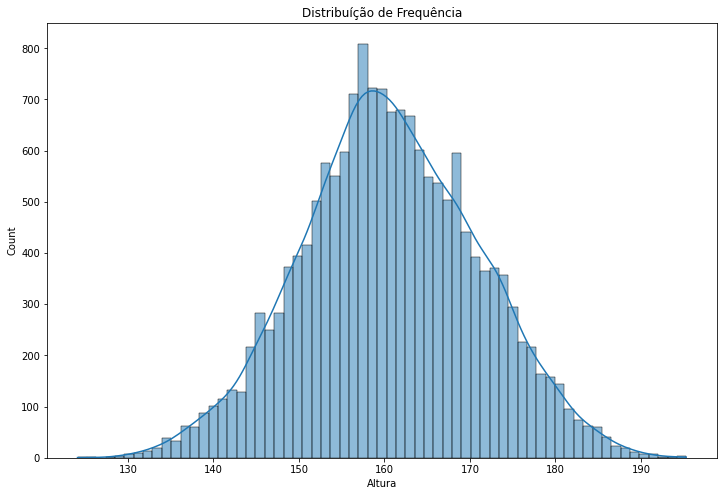

In [ ]:
ax = sns.histplot(data = dadosM3, x= "VB17004",  kde = True )
ax.figure.set_size_inches(12,8)
ax.set_title("Distribuíção de Frequência")
ax.set_xlabel("Altura")

Text(0.5, 0, 'Altura')

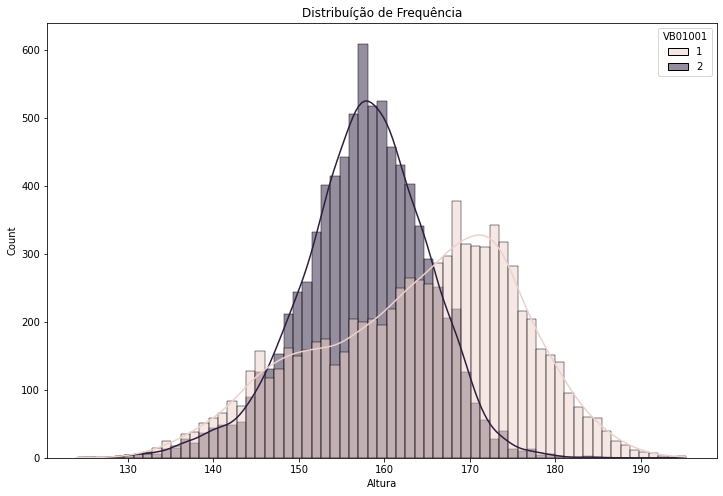

In [ ]:
ax = sns.histplot(data = dadosM3, x= "VB17004",  kde = True, hue = "VB01001" )
ax.figure.set_size_inches(12,8)
ax.set_title("Distribuíção de Frequência")
ax.set_xlabel("Altura")

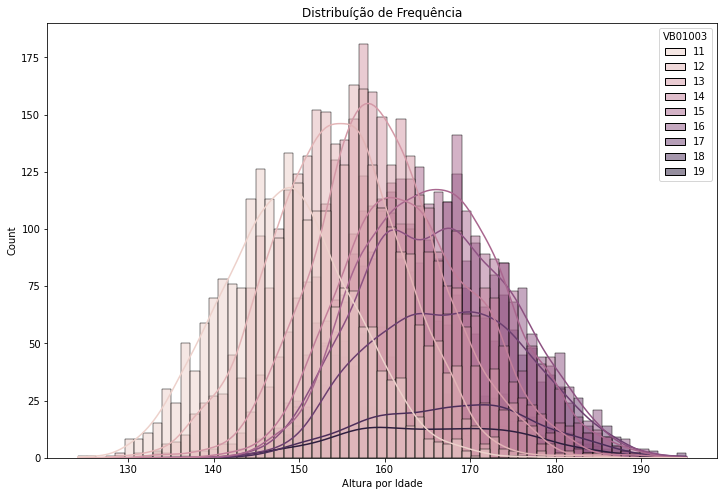

In [ ]:
ax = sns.histplot(data = dadosM3, x= "VB17004",  kde = True, hue = "VB01003" )
ax.figure.set_size_inches(12,8)
ax.set_title("Distribuíção de Frequência")
ax.set_xlabel("Altura por Idade");

####M3A4_2. boxplot e separatrizes

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


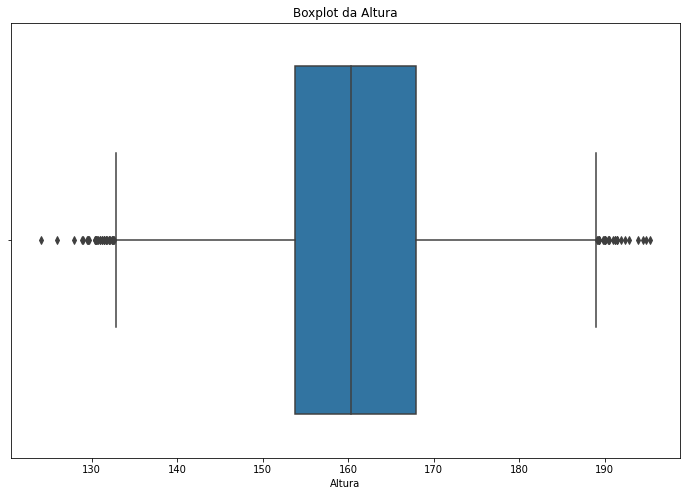

In [ ]:
ax = sns.boxplot(dadosM3["VB17004"])
ax.figure.set_size_inches(12,8)
ax.set_title("Boxplot da Altura")
ax.set_xlabel("Altura");

In [ ]:
dadosM3['VB17004'].quantile(0.25),dadosM3['VB17004'].quantile(0.5),dadosM3['VB17004'].quantile(0.75),

(153.8, 160.4, 167.9)

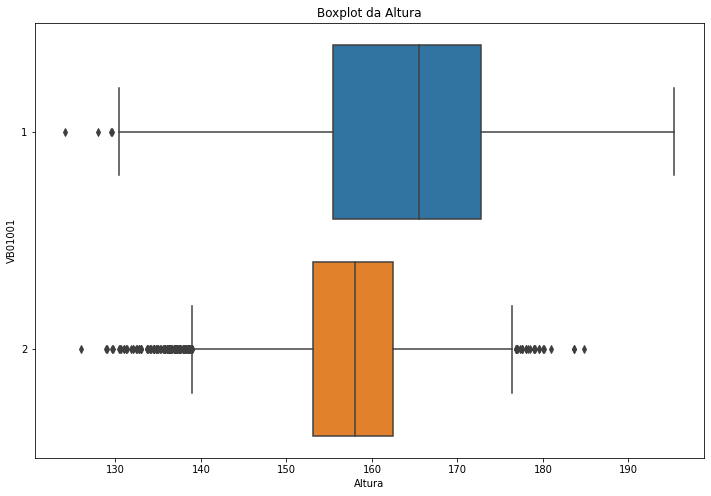

In [ ]:
ax = sns.boxplot(data = dadosM3, x = "VB17004", y = "VB01001", orient = "h")
ax.figure.set_size_inches(12,8)
ax.set_title("Boxplot da Altura")
ax.set_xlabel("Altura");

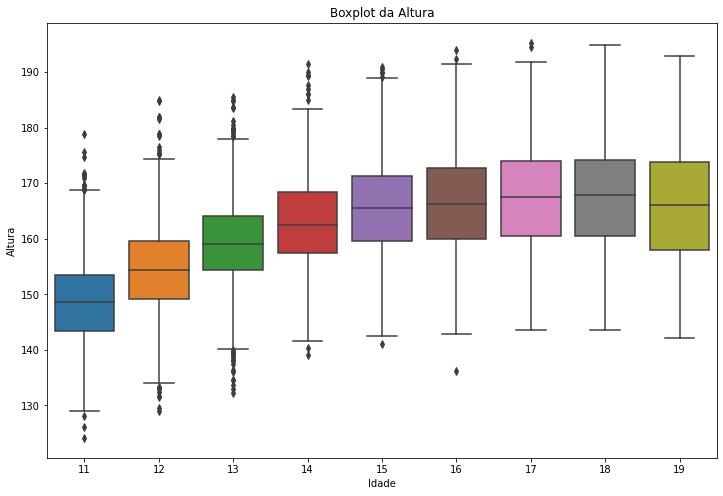

In [ ]:
ax = sns.boxplot(data = dadosM3, y = "VB17004", x = "VB01003", orient = "v")
ax.figure.set_size_inches(12,8)
ax.set_title("Boxplot da Altura")
ax.set_ylabel("Altura");
ax.set_xlabel("Idade");

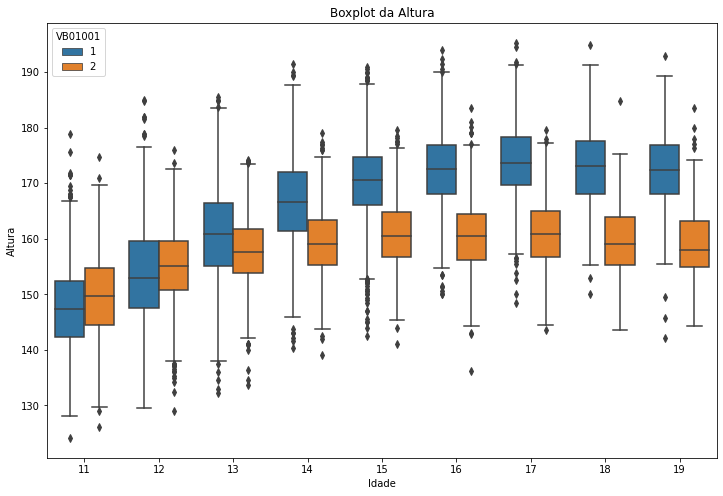

In [ ]:
ax = sns.boxplot(data = dadosM3, y = "VB17004", x = "VB01003", hue ="VB01001", orient = "v")
ax.figure.set_size_inches(12,8)
ax.set_title("Boxplot da Altura")
ax.set_ylabel("Altura");
ax.set_xlabel("Idade");

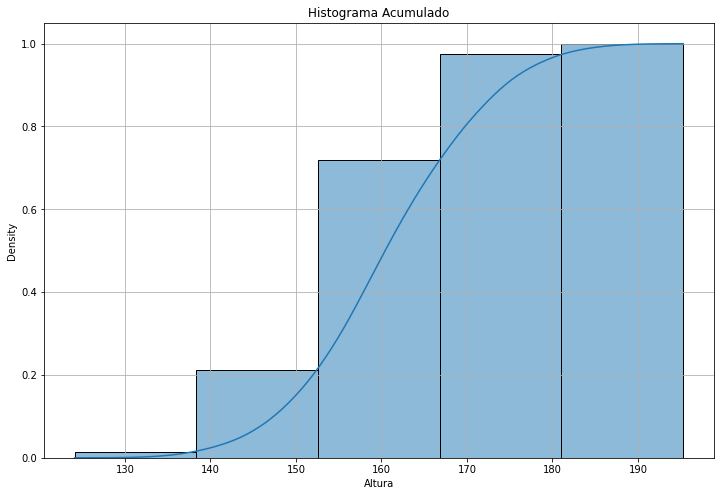

In [ ]:
ax = sns.histplot(data = dadosM3,
                  x= "VB17004",
                  kde = True,
                  cumulative=True,
                  stat = "density",
                  bins = 5)
ax.figure.set_size_inches(12,8)
ax.set_title("Histograma Acumulado")
ax.set_xlabel("Altura")
ax.set_xlabel("Altura")
ax.grid("--");

#####M3A4D01. Desafio 01
Calcular o desvio padrão, média, moda e mediana e plotar no gráfico de histograma.


TypeError: ignored

In [ ]:
def f_info_serie(sf):
    print("Desvio Padrão:", sf.std())
    print("Média:", sf.mean())
    print("Moda:", sf.mode()[0])
    print("Mediana:", sf.median())
    sinfo = {
        "Desvio Padrão":sf.std(),
        "Média": sf.mean(),
        "Moda": sf.mode()[0],
        "Mediana": sf.median(),
    }

    return sinfo

In [ ]:
sif = f_info_serie(dadosM3["VB17004"])

Desvio Padrão: 10.3400702338278
Média: 160.71311307078818
Moda: 160.0
Mediana: 160.4


In [ ]:
sif

{'Desvio Padrão': 10.3400702338278,
 'Mediana': 160.4,
 'Moda': 160.0,
 'Média': 160.71311307078818}

In [ ]:
sif["Média"]

160.71311307078818

''

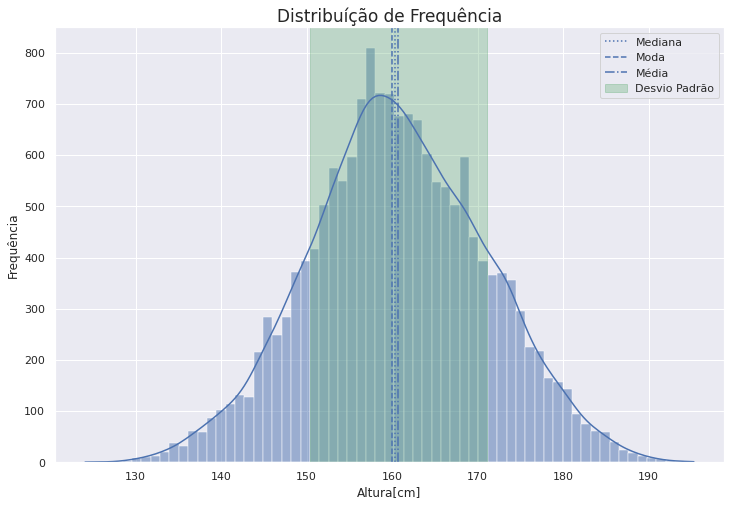

In [ ]:
sns.set_theme(color_codes=True)
ax = sns.histplot(data = dadosM3, x= "VB17004",  kde = True)

ax.figure.set_size_inches(12,8)
ax.axvspan((sif["Média"]-sif["Desvio Padrão"]),
           (sif["Média"]+sif["Desvio Padrão"]),
           color = "g",
           alpha = 0.3,
           label='Desvio Padrão')
ax.axvline(x=sif["Mediana"], 
           linestyle = ":",
           label='Mediana')
ax.axvline(x=sif["Moda"],linestyle = "--", label='Moda')
ax.axvline(x=sif["Média"],linestyle = "-.",   label='Média')

ax.set_title("Distribuíção de Frequência", fontsize = 17)
ax.set_xlabel("Altura[cm]");
ax.set_ylabel("Frequência");
ax.legend()
;


#####M3A4D02. Desafio 02
Fazer a análise com o histograma para outras informações da base de dados.




In [ ]:
def f_hist_m3(df, cod):
    s_f = df[cod]

    sns.set_theme(color_codes=True)
    ax = sns.histplot(data = df, x= cod,  kde = True)

    ax.figure.set_size_inches(12,8)
    ax.axvspan((s_f.mean()-s_f.std()),
            (s_f.mean()+s_f.std()),
            color = "g",
            alpha = 0.3,
            label='Desvio Padrão')
    ax.axvline(x=s_f.median(), 
            linestyle = ":",
            label='Mediana')
    ax.axvline(x=s_f.mode(),linestyle = "--", label='Moda')
    ax.axvline(x=s_f.mean(),linestyle = "-.",   label='Média')
    titulo = dic_perguntas[cod]
    ax.set_title(titulo, fontsize = 17)
    #ax.set_xlabel("xlab");
    ax.set_ylabel("Frequência");
    ax.legend()
    ;

ValueError: ignored

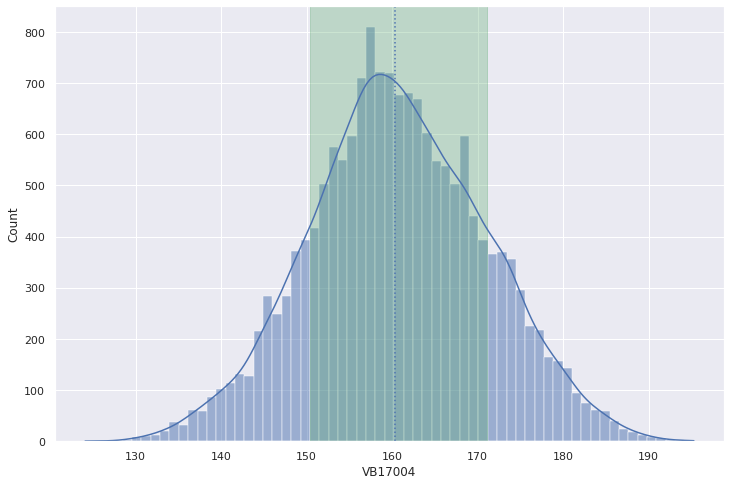

In [ ]:
f_hist_m3(dadosM3,"VB17004")

ValueError: ignored

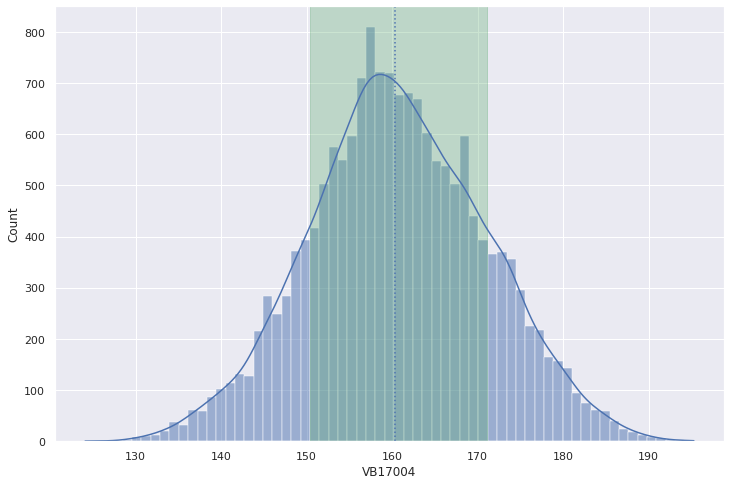

In [ ]:
f_hist_m3(dadosM3,"VB17004")

#####M3A4D03. Desafio 03
**Pesquisar como é determinado os outliers no boxplot do seaborn. Calcular na mão utilizando a função .quantile()

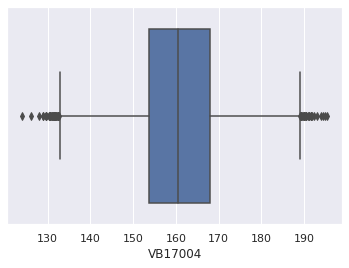

In [ ]:
sns.set_theme(context='notebook', style='darkgrid', palette='deep', font='sans-serif', font_scale=1, color_codes=True, rc=None)
sns.boxplot(data = dadosM3, x= "VB17004")

In [ ]:
#Quartis .. dividem as frequencias nos percentuais 
q0 = dadosM3["VB17004"].quantile(0)
q1 = dadosM3["VB17004"].quantile(.25)
q2 = dadosM3["VB17004"].quantile(.5)
q3 = dadosM3["VB17004"].quantile(.75)
q4 = dadosM3["VB17004"].quantile(1)

In [ ]:
#Bigodes: 
IQR = q3 - q1   #Tamanho do Retangulo onde estão contidos 50% da distribuíção
w0 = q1- 1.5*IQR
w1 = q3+ 1.5*IQR

In [ ]:
#Outliers 
#Pontos entre q0 e w0
#Pontos entre w1 e q4

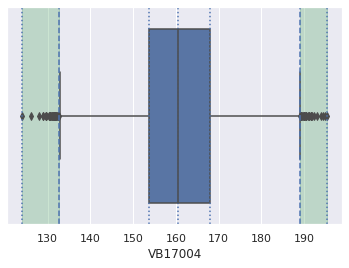

In [ ]:
ax = sns.boxplot(data = dadosM3, x= "VB17004")
ax.axvline(x=q0, linestyle = ":") 
ax.axvline(x=q1, linestyle = ":") 
ax.axvline(x=q2, linestyle = ":") 
ax.axvline(x=q3, linestyle = ":") 
ax.axvline(x=q4, linestyle = ":") 

ax.axvline(x=w0, linestyle = "--") 
ax.axvline(x=w1, linestyle = "--") 

ax.axvspan(q0,w0,
           color = "g",
           alpha = 0.3)

ax.axvspan(q4,w1,
           color = "g",
           alpha = 0.3);

###M3A5. Medidas de Centralidade e Dispersão

####M3A5_1. Medidas de Centralidade

In [ ]:
dadosM3["VB17004"].mean()

160.71311307078818

In [ ]:
dadosM3.groupby("VB01001")["VB17004"].mean()

VB01001
1    163.860758
2    157.558617
Name: VB17004, dtype: float64

In [ ]:
dadosM3.groupby(["VB01001","VB01003"])["VB17004"].mean()

VB01001  VB01003
1        11         147.617753
         12         153.696764
         13         160.719801
         14         166.406922
         15         170.336297
         16         172.424933
         17         173.814341
         18         173.024561
         19         172.143158
2        11         149.522512
         12         154.965021
         13         157.673105
         14         159.340320
         15         160.759848
         16         160.386527
         17         160.907937
         18         159.438462
         19         158.977193
Name: VB17004, dtype: float64

####M3A5_2.Desvio padrão passo a passo

In [ ]:
salario_thiago = 9000
salario_alan = 1000
salario_medio_ds_alura = (salario_thiago + salario_alan) / 2
salario_medio_ds_alura

5000.0

In [ ]:
media_altura = dadosM3["VB17004"].mean()
dadosM3["MEDIA_ALTURA"] = media_altura
diferenca_das_medias = dadosM3["VB17004"] - media_altura
dadosM3["DIFERENCA_MEDIA"] = diferenca_das_medias

diferenca_quadrado = diferenca_das_medias**2
dadosM3["DIFERENCA_QUADRADO"] = diferenca_quadrado
dadosM3[["VB17004","MEDIA_ALTURA","DIFERENCA_MEDIA","DIFERENCA_QUADRADO"]]

,VB17004,MEDIA_ALTURA,DIFERENCA_MEDIA,DIFERENCA_QUADRADO
0,157.0,160.713113,-3.713113,13.787209
1,152.0,160.713113,-8.713113,75.918339
2,161.4,160.713113,0.686887,0.471814
3,172.5,160.713113,11.786887,138.930703
4,167.5,160.713113,6.786887,46.061834
...,...,...,...,...
16551,167.9,160.713113,7.186887,51.651344
16552,185.8,160.713113,25.086887,629.351896
16553,159.4,160.713113,-1.313113,1.724266
16554,157.8,160.713113,-2.913113,8.486228


In [ ]:
variancia_amostral = 1/(len(dadosM3)-1) *dadosM3["DIFERENCA_QUADRADO"].sum()
variancia_amostral

106.91705244049119

In [ ]:
dadosM3[["VB17004"]].mean()

VB17004    160.713113
dtype: float64

In [ ]:
desvio_padrao = np.sqrt(variancia_amostral)
desvio_padrao

10.340070233827776

#####M3A5D1. Desafio 01
Fazer a descrição de outras variáveis, analisar e compartilhas suas análises no discord.


#####M3A5D2. Desafio 02
Fazer o calculo da média por sexo e idade, através do crosstab

In [ ]:
dadosM3["VB01003"]

0        13
1        14
2        13
3        14
4        13
         ..
16551    12
16552    15
16553    13
16554    14
16555    15
Name: VB01003, Length: 16556, dtype: int64

In [ ]:
pd.crosstab(index = [dadosM3["VB01001"],dadosM3["VB01003"]],
                    values = dadosM3["VB17004"],
                    columns='',
                    aggfunc="mean")

VB01001  VB01003
1        11         147.617753
         12         153.696764
         13         160.719801
         14         166.406922
         15         170.336297
         16         172.424933
         17         173.814341
         18         173.024561
         19         172.143158
2        11         149.522512
         12         154.965021
         13         157.673105
         14         159.340320
         15         160.759848
         16         160.386527
         17         160.907937
         18         159.438462
         19         158.977193
Name: __dummy__, dtype: float64

#####M3A5SD1. Super-desafio 01
Criar um dicionário para facilitar a busca da pergunta.

Resolvido acima 

https://colab.research.google.com/drive/1Vrok1XZVyyvOoJAUf_YeOcznm5yOWOGJ#scrollTo=rPK_PIn0FDfi&line=1&uniqifier=1


#####M3A5SD2. Super-desafio 02
De alguma maniera sumarizar as perguntas para ficar mais curta. NLTK, GESIM...


### M3A6. Intervalo de confiânça e testes

### M3A6_1. Intervalo de confiânça

In [ ]:
zconfint(dadosM3["VB17004"].tolist())

(160.5556082427712, 160.87061789880892)

In [ ]:
descricao_altura = DescrStatsW((dadosM3["VB17004"].tolist()))
descricao_altura.tconfint_mean()

(160.55559672649298, 160.8706294150872)

### M3A6_2. Testes estatísticos

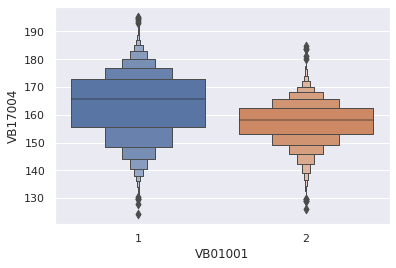

In [ ]:
sns.boxenplot(x="VB01001", y ="VB17004", data=dadosM3) 

In [ ]:
distribuicao_altura_m = dadosM3.query("VB01001==1")["VB17004"]
distribuicao_altura_f = dadosM3.query("VB01001==2")["VB17004"]
_ , p_value = ztest(distribuicao_altura_m,distribuicao_altura_f)
p_value

0.0

In [ ]:
_, p_value_normaltest_m = normaltest(distribuicao_altura_m)
_, p_value_normaltest_f = normaltest(distribuicao_altura_f)

print (p_value_normaltest_m)
print (p_value_normaltest_f)

7.695118853996524e-75
7.125189471020874e-47


In [ ]:
ranksums(distribuicao_altura_m,distribuicao_altura_f)

RanksumsResult(statistic=40.7525576033863, pvalue=0.0)

##### M3A6D1. Desafio 1
Estudar as medidas de dispersão e calcular utilizando o pandas, realizar os calculas para as outras colunas numéricas.


In [ ]:
#desvio Padão
dadosM3["VB17003"].std()

14.547864125282576

In [ ]:
#variancia
dadosM3["VB17003"].var()

211.64035060768379

In [ ]:
#moda
dadosM3["VB17003"].mode()

0    50.0
dtype: float64


##### M3A6D2. Desafio 2
Ler e pesquisar sobre o que intervalo de confiança, nível de confiança e o que significância.


* **Intervalo de confiânça:**
Um intervalo de confiança para um parâmetro populacional é um intervalo com uma proporção associada {\displaystyle p}p gerada por uma amostra aleatória de uma população subjacente, de tal forma que se o experimento for repetido várias vezes e o intervalo de confiança for recalculado para cada experimento com mesmo procedimento, uma proporção {\displaystyle p}p dos intervalos de confiança conteria o parâmetro estatístico em questão
(fonte: Wikipidia, https://pt.wikipedia.org/wiki/Intervalo_de_confian%C3%A7a)

* **Nivel de confiança**
O nível de confiança representa a porcentagem de intervalos que iriam incluir o parâmetro populacional se você reunisse amostras da mesma população, repetidas vezes. Um nível de confiança de 95% normalmente funciona bem. Isso indica que, se você tiver coletado uma centena de amostras, e tiver calculado 95% de intervalos de confiança, você esperaria que aproximadamente 95 dos intervalos contivesse o parâmetro populacional, como a média da população
(Fonte: https://support.minitab.com/pt-br/minitab/19/help-and-how-to/statistics/basic-statistics/supporting-topics/basics/what-is-a-confidence-level/)

* **Significância**
O nível de significância {\displaystyle \alpha }\alpha é a probabilidade de rejeitar a hipótese nula quando ela é verdadeira (conhecido como erro do tipo I). Em testes de hipóteses estatísticas, diz-se que há significância estatística ou que o resultado é estatisticamente significante quando o p-valor observado é menor que o nível de significância {\displaystyle \alpha }\alpha definido para o estudo.O nível de significância é geralmente determinado pelo pesquisador antes da coleta dos dados e é tradicionalmente fixado em 0,05 ou menos, dependendo da área de estudo. Em muitas áreas de estudo, resultados com nível de significância de 0,05 (probabilidade de erro de 5%) são considerados estatisticamente relevantes.
(fonte: Wikipidia, https://pt.wikipedia.org/wiki/Signific%C3%A2ncia_estat%C3%ADstica)



##### M3A6D3. Desafio 3
Plotar o intervalo de confiança no histograma das alturas.


In [ ]:
intervalo_confianca =  descricao_altura.tconfint_mean()

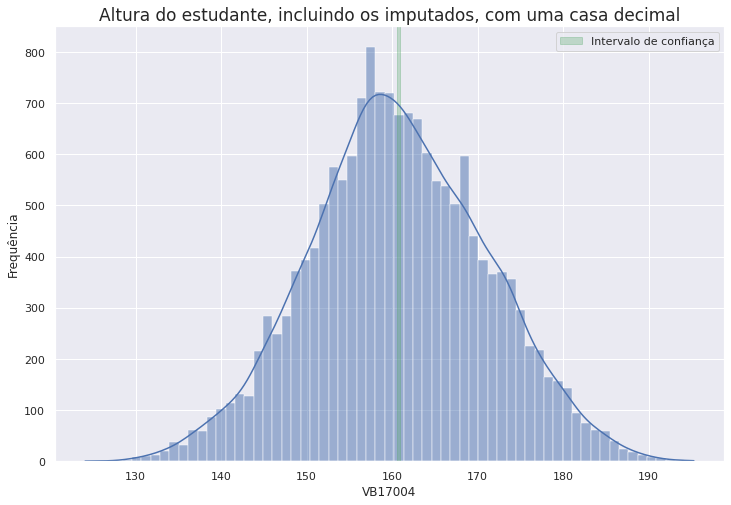

In [ ]:
    s_f = dadosM3["VB17004"]


    sns.set_theme(color_codes=True)
    ax = sns.histplot(data = dadosM3, x= "VB17004",  kde = True)

    ax.figure.set_size_inches(12,8)
    ax.axvspan(intervalo_confianca[0],
               intervalo_confianca[1],
               color = "g",
               alpha = 0.3,
               label='Intervalo de confiança')
    titulo = dic_perguntas["VB17004"]
    ax.set_title(titulo, fontsize = 17)
    #ax.set_xlabel("xlab");
    ax.set_ylabel("Frequência");
    ax.legend()

##### M3A6D4. Desafio 4
Realizar os testes de hipóteses de outras informações, explorando e enriquecendo a análise dos dados.

In [ ]:
#peso

distribuicao_peso_m = dadosM3.query("VB01001==1")["VB17003"]
distribuicao_peso_f = dadosM3.query("VB01001==2")["VB17003"]
_ , p_value = ztest(distribuicao_peso_m,distribuicao_peso_f)
print (p_value)

_, p_value_normaltest_m = normaltest(distribuicao_peso_m)
_, p_value_normaltest_f = normaltest(distribuicao_peso_f)
print (p_value_normaltest_m)
print (p_value_normaltest_f)

7.903530638224804e-73
0.0
0.0


In [ ]:
%%time

for i in range(100):
    j = 1+1

CPU times: user 14 µs, sys: 0 ns, total: 14 µs
Wall time: 18.1 µs


como sera a distribuíção das pesspas que estão satisfeitas vs insatisfeitas com seu corpo ... 